# Projet 7 - Implementation of a scoring model
# Notebook - Model comparison

# Context




# Data sources

The webpage containing all data and descriptions: <a href="https://www.kaggle.com/c/home-credit-default-risk/data" target="_blank">here</a>.

# Glossary

__- TP:__ True positives correspond to customers which are classified as they would default the repayment of their loan and they would as expected.<br>
__- FP:__ False positives correspond to customers which were guessed trustless to repay their loans whereas they would have to (Secondary case to avoid and minimize if possible).<br>
__- FN:__ False negatives correspond to customers which were guessed trustful to repay their loans whereas they will not (Worst case to absolutly minimize).<br>
__- TN:__ True negatives correspond to customers which are classified as they would not default the repayment of their loan and they don't as expected.<br>
__- dt_sp:__ Data sampling.<br>
__- wt:__ Weight.<br>
__- opt:__ Optimal.<br>
__- synth_sp:__ Synthetic sampling.<br>


<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Projet-7---Implementation-of-a-scoring-model" data-toc-modified-id="Projet-7---Implementation-of-a-scoring-model-1">Projet 7 - Implementation of a scoring model</a></span></li><li><span><a href="#Notebook---Model-comparison" data-toc-modified-id="Notebook---Model-comparison-2">Notebook - Model comparison</a></span></li><li><span><a href="#Context" data-toc-modified-id="Context-3">Context</a></span></li><li><span><a href="#Data-sources" data-toc-modified-id="Data-sources-4">Data sources</a></span></li><li><span><a href="#Glossary" data-toc-modified-id="Glossary-5">Glossary</a></span></li><li><span><a href="#I)-Importation-of-the-dataset-into-a-pandas-dataframe" data-toc-modified-id="I)-Importation-of-the-dataset-into-a-pandas-dataframe-6">I) Importation of the dataset into a pandas dataframe</a></span><ul class="toc-item"><li><span><a href="#1)-Import-all-librairies-and-tools-required-to-realize-the-project-and-set-the-first-global-variables" data-toc-modified-id="1)-Import-all-librairies-and-tools-required-to-realize-the-project-and-set-the-first-global-variables-6.1">1) Import all librairies and tools required to realize the project and set the first global variables</a></span></li><li><span><a href="#2)-Importation-of-the-preprocessed-datasets" data-toc-modified-id="2)-Importation-of-the-preprocessed-datasets-6.2">2) Importation of the preprocessed datasets</a></span></li><li><span><a href="#3)-Separation-of-the-explicatives-and-the-explicated" data-toc-modified-id="3)-Separation-of-the-explicatives-and-the-explicated-6.3">3) Separation of the explicatives and the explicated</a></span></li></ul></li><li><span><a href="#II)-Models" data-toc-modified-id="II)-Models-7">II) Models</a></span><ul class="toc-item"><li><span><a href="#1)-Importation-of-required-libraries" data-toc-modified-id="1)-Importation-of-required-libraries-7.1">1) Importation of required libraries</a></span></li><li><span><a href="#2)-Global-variables" data-toc-modified-id="2)-Global-variables-7.2">2) Global variables</a></span></li><li><span><a href="#3)-Functions" data-toc-modified-id="3)-Functions-7.3">3) Functions</a></span><ul class="toc-item"><li><span><a href="#a)-Model-fitting-and-predictions" data-toc-modified-id="a)-Model-fitting-and-predictions-7.3.1">a) Model fitting and predictions</a></span></li><li><span><a href="#b)-Optimization-of-the-probability-threshold" data-toc-modified-id="b)-Optimization-of-the-probability-threshold-7.3.2">b) Optimization of the probability threshold</a></span></li><li><span><a href="#c)-ROC-AUC" data-toc-modified-id="c)-ROC-AUC-7.3.3">c) ROC-AUC</a></span></li><li><span><a href="#d)-F-bêta-score" data-toc-modified-id="d)-F-bêta-score-7.3.4">d) F-bêta score</a></span></li><li><span><a href="#e)-Job-score" data-toc-modified-id="e)-Job-score-7.3.5">e) Job score</a></span></li><li><span><a href="#f)-Hyperparameter-tuning" data-toc-modified-id="f)-Hyperparameter-tuning-7.3.6">f) Hyperparameter tuning</a></span></li><li><span><a href="#g)-Model-peformance-evaluation" data-toc-modified-id="g)-Model-peformance-evaluation-7.3.7">g) Model peformance evaluation</a></span></li><li><span><a href="#h)-Table-to-store-all-models'-relevant-values-along-the-notebook" data-toc-modified-id="h)-Table-to-store-all-models'-relevant-values-along-the-notebook-7.3.8">h) Table to store all models' relevant values along the notebook</a></span></li></ul></li><li><span><a href="#3)-Preprocessing-for-data-sampling" data-toc-modified-id="3)-Preprocessing-for-data-sampling-7.4">3) Preprocessing for data sampling</a></span></li><li><span><a href="#4)-Modelisation" data-toc-modified-id="4)-Modelisation-7.5">4) Modelisation</a></span><ul class="toc-item"><li><span><a href="#a)-Baseline-model:-Dummy-classifier" data-toc-modified-id="a)-Baseline-model:-Dummy-classifier-7.5.1">a) Baseline model: Dummy classifier</a></span><ul class="toc-item"><li><span><a href="#i.-Libraries-importation" data-toc-modified-id="i.-Libraries-importation-7.5.1.1">i. Libraries importation</a></span></li><li><span><a href="#ii.-No-optimization" data-toc-modified-id="ii.-No-optimization-7.5.1.2">ii. No optimization</a></span></li><li><span><a href="#iii.-Generalization-over-the-testset" data-toc-modified-id="iii.-Generalization-over-the-testset-7.5.1.3">iii. Generalization over the testset</a></span></li></ul></li><li><span><a href="#b)-Logistic-regressor" data-toc-modified-id="b)-Logistic-regressor-7.5.2">b) Logistic regressor</a></span><ul class="toc-item"><li><span><a href="#i.-Hyperparameters-tuning" data-toc-modified-id="i.-Hyperparameters-tuning-7.5.2.1">i. Hyperparameters tuning</a></span></li><li><span><a href="#ii.-Evalutation-of-the-optimized-model-performances" data-toc-modified-id="ii.-Evalutation-of-the-optimized-model-performances-7.5.2.2">ii. Evalutation of the optimized model performances</a></span></li><li><span><a href="#iii.-Generalization-over-the-test-set" data-toc-modified-id="iii.-Generalization-over-the-test-set-7.5.2.3">iii. Generalization over the test set</a></span></li></ul></li><li><span><a href="#c)-Random-forest" data-toc-modified-id="c)-Random-forest-7.5.3">c) Random forest</a></span><ul class="toc-item"><li><span><a href="#i.-Hyperparameters-tuning" data-toc-modified-id="i.-Hyperparameters-tuning-7.5.3.1">i. Hyperparameters tuning</a></span></li><li><span><a href="#ii.-Evaluation-of-the-optimized-model-performances" data-toc-modified-id="ii.-Evaluation-of-the-optimized-model-performances-7.5.3.2">ii. Evaluation of the optimized model performances</a></span></li><li><span><a href="#iii.-Generalization-over-the-test-set" data-toc-modified-id="iii.-Generalization-over-the-test-set-7.5.3.3">iii. Generalization over the test set</a></span></li></ul></li><li><span><a href="#d)-XGBoosting" data-toc-modified-id="d)-XGBoosting-7.5.4">d) XGBoosting</a></span><ul class="toc-item"><li><span><a href="#i.-Hyperparameters-tuning" data-toc-modified-id="i.-Hyperparameters-tuning-7.5.4.1">i. Hyperparameters tuning</a></span></li><li><span><a href="#ii.-Evaluation-of-the-optimized-model-performances" data-toc-modified-id="ii.-Evaluation-of-the-optimized-model-performances-7.5.4.2">ii. Evaluation of the optimized model performances</a></span></li><li><span><a href="#iii.-Generalization-over-the-test-set" data-toc-modified-id="iii.-Generalization-over-the-test-set-7.5.4.3">iii. Generalization over the test set</a></span></li></ul></li><li><span><a href="#e)-LightGBM" data-toc-modified-id="e)-LightGBM-7.5.5">e) LightGBM</a></span><ul class="toc-item"><li><span><a href="#i.-Hyperparameters-tuning" data-toc-modified-id="i.-Hyperparameters-tuning-7.5.5.1">i. Hyperparameters tuning</a></span></li><li><span><a href="#ii.-Evaluation-of-the-optimized-model-performances" data-toc-modified-id="ii.-Evaluation-of-the-optimized-model-performances-7.5.5.2">ii. Evaluation of the optimized model performances</a></span></li><li><span><a href="#iii.-Generalization-over-the-test-set" data-toc-modified-id="iii.-Generalization-over-the-test-set-7.5.5.3">iii. Generalization over the test set</a></span></li></ul></li><li><span><a href="#f)-Models-comparison" data-toc-modified-id="f)-Models-comparison-7.5.6">f) Models comparison</a></span><ul class="toc-item"><li><span><a href="#i.-Functions" data-toc-modified-id="i.-Functions-7.5.6.1">i. Functions</a></span></li><li><span><a href="#ii.-Figures" data-toc-modified-id="ii.-Figures-7.5.6.2">ii. Figures</a></span></li></ul></li></ul></li></ul></li><li><span><a href="#Interpretations" data-toc-modified-id="Interpretations-8">Interpretations</a></span><ul class="toc-item"><li><span><a href="#Global" data-toc-modified-id="Global-8.1">Global</a></span><ul class="toc-item"><li><span><a href="#LightGBM-importance-parameter" data-toc-modified-id="LightGBM-importance-parameter-8.1.1">LightGBM importance parameter</a></span></li><li><span><a href="#SHAP" data-toc-modified-id="SHAP-8.1.2">SHAP</a></span><ul class="toc-item"><li><span><a href="#Library-importation" data-toc-modified-id="Library-importation-8.1.2.1">Library importation</a></span></li><li><span><a href="#Functions" data-toc-modified-id="Functions-8.1.2.2">Functions</a></span></li><li><span><a href="#Shap-explanation" data-toc-modified-id="Shap-explanation-8.1.2.3">Shap explanation</a></span></li><li><span><a href="#Interpretations" data-toc-modified-id="Interpretations-8.1.2.4">Interpretations</a></span></li></ul></li></ul></li><li><span><a href="#Local" data-toc-modified-id="Local-8.2">Local</a></span><ul class="toc-item"><li><span><a href="#Shap" data-toc-modified-id="Shap-8.2.1">Shap</a></span><ul class="toc-item"><li><span><a href="#Shap-explanation" data-toc-modified-id="Shap-explanation-8.2.1.1">Shap explanation</a></span></li><li><span><a href="#Interpretations" data-toc-modified-id="Interpretations-8.2.1.2">Interpretations</a></span></li></ul></li><li><span><a href="#Dashboard:-streamlit" data-toc-modified-id="Dashboard:-streamlit-8.2.2">Dashboard: streamlit</a></span></li><li><span><a href="#LIME" data-toc-modified-id="LIME-8.2.3">LIME</a></span></li></ul></li></ul></li><li><span><a href="#API-Flask" data-toc-modified-id="API-Flask-9">API Flask</a></span></li></ul></div>

# I) Importation of the dataset into a pandas dataframe

## 1) Import all librairies and tools required to realize the project and set the first global variables

In [1]:
### Librairies and tools to import ###

# File system management.
import os.path

# Data manipulations.
import numpy as np
import pandas as pd

# Time measurment and datetime management.
import datetime as dt
#import time
from time import time

# Python random sampling.
from random import sample as py_rd_sp

# Warnings suppression.
import warnings
warnings.filterwarnings('ignore')

# Data visualizations.
from pprint import pprint
#from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Warnings management.
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Saving full data.
from numpy import set_printoptions


### Set default figure parameters for the whole notebook ###

# Default parameters for matplotlib's figures.
plt.rcParams['figure.figsize'] = [6,6]
plt.rcParams['figure.dpi'] = 200
#mpl.rcParams['axes.prop_cycle'] = cycler(color=['b', 'r', 'g'])
plt.rcParams['axes.spines.right'] = False
plt.rcParams['axes.spines.top'] = False
plt.rcParams['xtick.bottom'] = True
plt.rcParams['ytick.left'] = True

# Default parameters of seaborn's figures.
sns.set_style('white') # NB: Needs to be above sns.set_theme to properly attend custom_params.
custom_params = {'axes.spines.right': False, 'axes.spines.top': False}
sns.set_theme(style='ticks', palette='deep', rc=custom_params)


# Global file paths.
#EXPORTS_DIR_PATH = 'Exports'
EXPORTS_MODELS_DIR_PATH = r'Exports\Models\Tried'
IMPORTS_DIR_PATH = r'Exports\Preprocessed_data'

CSV_MODELS_FILE = 'models_info.csv'
PKL_MODELS_FILE = 'models_info.pkl'
#JSON_MODELS_FILE = 'models_info.json'
#DATASETS_DIR_PATH = r'D:\0Partage\MP-P2PNet\MP-Sync\MP-Sync_Pro\Info\OC_DS\Projet 7\Datasets' #os.path.join('D:', '0Partage', 'MP-P2PNet', 'MP-Sync', 'MP-Sync_Pro', 'Info', 'OC_DS', 'Projet 7', 'Datasets')

In [2]:
def display_EZ (x, max_rows = 100, max_cols = 100, max_colwidth = 100):
    
    """
    Description
    -----------
    Allows to display pandas dataframes with the number of rows and columns whished in an easy manner.
    
    Parameters
    ----------
    df: pandas.DataFrame()
        Dataframe to display.
    max_rows: int
        Maximum number of rows to display.
    max_cols: int
        Maximum number of columns to display.
    max_colwidth: int
        Maximum width of each column.
        
    """
    
    with pd.option_context('display.max_rows', max_rows, 'display.max_columns', max_cols, 'display.max_colwidth', max_colwidth):
        display(x)

In [3]:
def df_to_csv_full (df):
    
    # Set the numpy array number of items cutting threshold to a very high number and avoid the cut.
    set_printoptions(threshold=1e100, linewidth=1e100)
    
    # Save the df to a csv file.
    df.to_csv(os.path.join(EXPORTS_MODELS_DIR_PATH, CSV_MODELS_FILE))
    
    # Reset the numpy array number of items cutting threshold to default.
    set_printoptions(threshold=100, linewidth=25)

## 2) Importation of the preprocessed datasets

In [4]:
def reduce_memory(df):
    """Reduce memory usage of a dataframe by setting data types. """

    start_mem = df.memory_usage().sum() / 1024 ** 2
    print('Initial df memory usage is {:.2f} MB for {} columns'
          .format(start_mem, len(df.columns)))

    for col in df.columns:
        col_type = df[col].dtypes
        if col_type != object:
            cmin = df[col].min()
            cmax = df[col].max()
            if str(col_type)[:3] == 'int':
                # Can use unsigned int here too
                if cmin > np.iinfo(np.int8).min and cmax < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif cmin > np.iinfo(np.int16).min and cmax < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif cmin > np.iinfo(np.int32).min and cmax < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif cmin > np.iinfo(np.int64).min and cmax < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)
            else:
                if cmin > np.finfo(np.float16).min and cmax < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif cmin > np.finfo(np.float32).min and cmax < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
                    
    end_mem = df.memory_usage().sum() / 1024 ** 2
    memory_reduction = 100 * (start_mem - end_mem) / start_mem
    print('Final memory usage is: {:.2f} MB - decreased by {:.1f}%'.format(end_mem, memory_reduction))
    return df

In [5]:
def find_int_cols (df):
      
    for col in df.columns:
        for item in df[col]:
            if item == int(item):
                if df[col].dtype != "int64":
                    df[col] = df[col].astype("int64")
            else:
                if df[col].dtype != "float64":
                    df[col] = df[col].astype("float64") 
                break
                
    return df

In [482]:
df_train = pd.read_csv(os.path.join(IMPORTS_DIR_PATH, 'preprocessed_data_train.csv'))
df_valid = pd.read_csv(os.path.join(IMPORTS_DIR_PATH, 'preprocessed_data_valid.csv'))
df_test = pd.read_csv(os.path.join(IMPORTS_DIR_PATH, 'preprocessed_data_test.csv'))
#df_new_customers = pd.read_csv(os.path.join(IMPORTS_DIR_PATH, 'preprocessed_data_new_customers.csv'))

In [483]:
df_test_w_ids = df_test.copy()

In [484]:
del_features = ['SK_ID_CURR'] #, 'SK_ID_CURR', 'SK_ID_BUREAU', 'SK_ID_PREV', 'index', 'level_0']

df_train = df_train.drop(del_features, axis=1)
df_valid = df_valid.drop(del_features, axis=1)
df_test = df_test.drop(del_features, axis=1)

In [8]:
%%time

df_train = find_int_cols(df_train)
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23999 entries, 0 to 23998
Columns: 169 entries, NAME_CONTRACT_TYPE to TARGET
dtypes: float64(112), int64(57)
memory usage: 30.9 MB
CPU times: total: 3.67 s
Wall time: 3.67 s


In [9]:
df_train = reduce_memory(df_train)

Initial df memory usage is 30.94 MB for 169 columns
Final memory usage is: 8.74 MB - decreased by 71.7%


In [10]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23999 entries, 0 to 23998
Columns: 169 entries, NAME_CONTRACT_TYPE to TARGET
dtypes: float16(71), float32(41), int16(19), int8(38)
memory usage: 8.7 MB


## 3) Separation of the explicatives and the explicated

In [11]:
X_TRAIN = df_train.drop('TARGET', axis=1)
y_TRAIN = df_train['TARGET']

#X_VALID = df_valid.drop('TARGET', axis=1)
#y_VALID = df_valid['TARGET']

X_TEST = df_test.drop('TARGET', axis=1)
y_TEST = df_test['TARGET']

# II) Models

## 1) Importation of required libraries

In [12]:
# Files management (Save and load files).
import csv
import pickle

# Additional common libraries.
from numpy import argmax, argmin
import math

# sklearn tools ad libraries.
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from sklearn.model_selection import StratifiedKFold, GridSearchCV, RandomizedSearchCV, cross_val_predict, cross_val_score
from sklearn.metrics import roc_curve, auc, roc_auc_score, precision_recall_curve, fbeta_score, confusion_matrix

# Make a sklearn job scorer.
from sklearn.metrics import make_scorer

# Data sampling.
from imblearn.pipeline import Pipeline # NB: imbalearn.pipeline.Pipeline allows to properly deal the SMOTE on the train set and avoid the validation/test sets.
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTENC # NB: SMOTENC can manage categorial features while SMOTE cannot.


### Beyesian hyperparmaters tuning ###

# Hyperopt modules.
from hyperopt import STATUS_OK # Check if the objective function returned a valid value (Mandatory).

# Methods for the domain space, algorithm optimization, save the trials history, bayesian optimization.
from hyperopt import hp, tpe, Trials, fmin

*NB: In order to calculate the best probability threshold the AUCROC is selected over the AUCPR since the first one focuses on the FP and FN balance (the 2 most important values to consider for this project) while the AUCPR focused exclusively on the positive (minority class) (=> FP) which does not take into account the most relevant value for this project (FN).*

## 2) Global variables

In [13]:
# Initialize the default cross validation method to use.
SKF_5 = StratifiedKFold(5, shuffle=True, random_state=0)

# True: Allows hyperprameter tuning, False: Get the results stored from the last hyperparameters tuning.
HT = True

# For imbalanced data use weight or data sampling.
IMB_PROCESS = 'Weight' #'Resp'

# Global common scaler to use.
SCALER = MinMaxScaler()

# Update the csv file containing the training information and scores of the model or not (True = update).
GET_CSV_FILE = True

# Set and initialize the main scorer used for the models comparisons.
MAIN_SCORER_TRAIN_LABEL = 'Job_score_train'
MAIN_SCORER_TEST_LABEL = 'Job_score_test'
MAIN_SCORER_VAL = 0

# Load/create and initialize the dataframe in which store all relevant models' information (best hyperparameters, scores...).
# NB: In case of the creation of the file data=np.full((1,len(l_COL_LABELS)), None) to force dtypes as objects
#     until one of the next added entries (rows) are full then, it will be removed. Otherwise, the np.nan values which will appear
#     within the first row will convert their columns' dtypes to float64 and prevent their replacement
#     by objects such as np.array.
l_COL_LABELS = ['Model_labels', 'Models',
                'yhat_train', 'yhat_test',
                'Best_proba_threshold_train', 'Best_proba_threshold_test',
                'Job_score_train', 'Job_score_test', 
                'AUROC_scores_train', 'AUROC_scores_test',
                'F-bêta_score_train', 'F-bêta_score_test',
                'Process_time_train (s)', 'Process_time_test (s)'
               ]

#l_COL_LABELS = ['Model_labels', 'Models',
#                'X_train_shape', 'X_test_shape',
#                'yhat_train', 'yhat_test',
#                'Best_proba_threshold_train', 'Best_proba_threshold_test',
#                'Job_score_train', 'Job_score_test', 
#                'AUROC_scores_train', 'AUROC_scores_test',
#                'F-bêta_score_train', 'F-bêta_score_test',
#                'Process_time_train (s)', 'Process_time_test (s)'
#               ]

if GET_CSV_FILE:
    try:
        df_MODELS = pd.read_pickle(os.path.join(EXPORTS_MODELS_DIR_PATH, PKL_MODELS_FILE))#.set_index('Model_labels')

    except:
        print("No csv models informations were found. A new one is created...")
        df_MODELS = pd.DataFrame(data=np.full((1,len(l_COL_LABELS)), None), columns=l_COL_LABELS).set_index('Model_labels')
        df_MODELS.to_pickle(os.path.join(EXPORTS_MODELS_DIR_PATH, PKL_MODELS_FILE))
        print('Done !')
    
else:
    print("Creation of a new csv file to store models informations...")
    df_MODELS = pd.DataFrame(data=np.full((1,len(l_COL_LABELS)), None), columns=l_COL_LABELS).set_index('Model_labels')
    df_MODELS.to_pickle(os.path.join(EXPORTS_MODELS_DIR_PATH, PKL_MODELS_FILE))
    print('Done !')  

display(df_MODELS.info())

<class 'pandas.core.frame.DataFrame'>
Index: 9 entries, dummy_clf to wt_lgbm_clf_opt
Data columns (total 13 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Models                      9 non-null      object 
 1   yhat_train                  9 non-null      object 
 2   yhat_test                   8 non-null      object 
 3   Best_proba_threshold_train  9 non-null      float64
 4   Best_proba_threshold_test   8 non-null      object 
 5   Job_score_train             9 non-null      float64
 6   Job_score_test              8 non-null      object 
 7   AUROC_scores_train          9 non-null      float64
 8   AUROC_scores_test           8 non-null      object 
 9   F-bêta_score_train          9 non-null      float64
 10  F-bêta_score_test           8 non-null      object 
 11  Process_time_train (s)      9 non-null      float64
 12  Process_time_test (s)       8 non-null      object 
dtypes: float64(5), object(

None

In [14]:
df_MODELS

,Models,yhat_train,yhat_test,Best_proba_threshold_train,Best_proba_threshold_test,Job_score_train,Job_score_test,AUROC_scores_train,AUROC_scores_test,F-bêta_score_train,F-bêta_score_test,Process_time_train (s),Process_time_test (s)
Model_labels,,,,,,,,,,,,,
dummy_clf,DummyClassifier(strategy='stratified'),"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, ...",0.000,0.0,0.535220,0.539438,0.506514,0.510236,0.091577,0.091748,0.118105,0.028026
logi_reg_opt,"LogisticRegression(C=100.0, class_weight='bala...","[0.5950216861017936, 0.5400718415302808, 0.430...","[0.34288296588972866, 0.4585440415379346, 0.56...",0.475,0.475,0.587815,0.581008,0.618610,0.601764,0.897919,0.897778,2.928672,0.345314
rf_clf_opt,"(DecisionTreeClassifier(max_depth=10, max_feat...","[0.5443689719737853, 0.6585302236646584, 0.177...","[0.42756610416750596, 0.5202812622906803, 0.13...",0.400,0.38,0.668959,0.640988,0.727212,0.696335,0.897898,0.901347,7.106856,1.94677
xgb_clf_opt,"XGBClassifier(base_score=None, booster=None, c...","[0.5688134, 0.62018585, 0.15535076, 0.42749348...","[0.3637119, 0.47850734, 0.07989965, 0.32197857...",0.475,0.465,0.684892,0.6625,0.741560,0.706817,0.898201,0.897944,3.163377,1.121018
lgbm_clf_opt,"LGBMClassifier(class_weight='balanced', colsam...","[0.6142795453522419, 0.6490163088635007, 0.246...","[0.5517143544597476, 0.38818625549996316, 0.16...",0.505,0.485,0.681817,0.651357,0.742423,0.702991,0.898531,0.898577,1.303183,0.516469
logi_reg_opt_dt_sp,"(MinMaxScaler(), SMOTE(k_neighbors=10, random_...","[0.6010609071046806, 0.6039352551291393, 0.115...","[0.09112835665798243, 0.5446520704704663, 0.30...",0.370,0.31,0.677604,0.65,0.734119,0.710206,0.898762,0.897778,4.625697,0.583532
wt_logi_reg_opt,"(MinMaxScaler(), LogisticRegression(C=0.1, cla...","[0.6512462417233318, 0.6626875538059055, 0.215...","[0.4661041263911844, 0.48343001608522007, 0.38...",0.495,0.51,0.680413,0.659302,0.742460,0.719538,0.898795,0.900108,3.182272,0.35556
wt_rf_clf_opt,"(MinMaxScaler(), SMOTE(k_neighbors=4, random_s...","[0.22779337291446336, 0.23599944893841715, 0.0...",NaN,0.155,NaN,0.668741,NaN,0.719419,NaN,0.897919,NaN,18.100912,NaN
wt_lgbm_clf_opt,"(MinMaxScaler(), LGBMClassifier(class_weight='...","[0.42106664903786667, 0.7378387650141042, 0.22...","[0.09226216071321515, 0.27391479648233213, 0.0...",0.445,0.205,0.682083,0.648643,0.735635,0.69377,0.898643,0.897861,1.788634,0.917834


## 3) Functions 

### a) Model fitting and predictions

In [15]:
def model_fit_predict (model, X=X_TRAIN, y=y_TRAIN, cv=SKF_5):
    
    # Fit and predict probabilities by cross validation.
    if cv != 0:
        t0 = time()
        y_pred_proba_NP = cross_val_predict(model, X, y, cv=cv, method='predict_proba')
        process_time = time() - t0

    # Fit and predict over the test set (no cv).
    else:
        t0 = time()
        model.fit(X, y)
        y_pred_proba_NP = model.predict_proba(X)
        process_time = time() - t0
    
    return y_pred_proba_NP, process_time

In [16]:
def get_y_pred_list (y_pred_proba_P, l_proba_thrs = np.linspace(0, 1, num=100)):
    
    # Classify the customers of the sample for each probability threshold.
    l_y_pred = []
    for proba_thr in l_proba_thrs:

        y_pred = []
        for proba in y_pred_proba_P:
            if proba > proba_thr:
                y_pred.append(1)
            else:
                y_pred.append(0)
        
        l_y_pred.append(y_pred)
                
    return l_y_pred

In [17]:
def get_tp_fp_fn_tn_lists (y_true, l_y_pred):

    l_tp = []
    l_fp = []
    l_fn = []
    l_tn = []
    for y_pred in l_y_pred:
        #cm = confusion_matrix(y_true, y_pred)
        #l_tn.append(cm[0][0])
        #l_fp.append(cm[0][1])
        #l_fn.append(cm[1][0])
        #l_tp.append(cm[1][1])
        #display(y_true[y_true == 1])
        tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
        l_tp.append(tp)
        l_fp.append(fp)
        l_fn.append(fn)
        l_tn.append(tn)

    
    return l_tp, l_fp, l_fn, l_tn

### b) Optimization of the probability threshold

In [18]:
def opt_proba_thr (np_tp, np_fp, np_fn, np_tn, l_proba_thrs, fn_cost_coeff = 10):     
        
    ### Calculation of the best probability threshold.
    
    # Method 1 (Less accurate at low number of thresholds tried): Get the index of the closest FP/FN ratio of 1.
    #J = np_fp / (fn_cost_coeff * np_fn)
    #j_opt = 0
    #for idx, j in enumerate(J):
    #    if (j < 1 and j > j_opt) or (j > 1 and j < j_opt):
    #        j_opt = j
    #        J_opt_idx = idx
    #print("Corresponding optimal ratio found:", J[J_opt_idx])
    
    # Method 2 (More accurate at low number of thresholds tried):
    # NB: As it had been seen within the global EDA notebook, there is 1 FN for 10 FP.
    #     Our manager suggested that we should consider that 1 FN cost ~10 times more then 1 FP.
    #     => No need to add a coefficient in front of FN to add more weight since it is already
    #        taken into account within the classification balancement for the 2nd method.
    #        => fn_cost_coeff = 10 --> 1
    
    tpr = np_tp / (np_tp + fn_cost_coeff/fn_cost_coeff * np_fn)
    fpr = np_fp / (np_fp + np_tn)
    J = tpr - fpr
    J_opt_idx = argmax(J)
    
    # Method 3:
    #np_fp_hypothesis = np_fp + fn_cost_coeff * np_fn
    #J_opt_idx = argmin(np_fp_hypothesis)
    
    # Get the optimal probability threshold.
    best_thr = l_proba_thrs[J_opt_idx]

    # Print scores.
    #print('Best Threshold: %.3f' % best_thr)
    #print('Number of FP =', np_fp[J_opt_idx])
    #print('Number of FN =', np_fn[J_opt_idx], '~ FP =', 10 * np_fn[J_opt_idx])
    #print('Equivalent number of FP =', np_fp_hypothesis[J_opt_idx])
    
    return best_thr, J_opt_idx

In [19]:
def figure_density (y_true, y_pred_proba_P, best_thr):
    
    # Find and show the optimal probability threshold on a figure.
    
    # Find the best threshold value graphically.
    y_true_P = y_true[y_true == 1]
    y_true_N = y_true[y_true == 0]

    # Plot the probability density approximation of the TN.
    #plt.hist(y_pred_proba_P[y_true_N.index], bins=100, density=True)
    kde_N = sns.kdeplot(y_pred_proba_P[y_true_N.index], fill=True, alpha=0.5, edgecolor='k') #multiple="stack"
    
    # Plot the probability density approximation of the FN.
    #plt.hist(y_pred_proba_P[y_true_P.index], bins=100, density=True)
    sns.kdeplot(y_pred_proba_P[y_true_P.index], fill=True, alpha=0.5, edgecolor='k')

    # Plot a line at the best threshold found.
    plt.vlines(best_thr, ymin=0, ymax=max(kde_N.get_yticks()), colors='k', linestyles='--')
    
    # Set other figures' parameters.
    plt.title("Distribution of the probability a customer default")
    plt.xlabel("Probability thresholds")
    plt.legend(["Regular customers", "Default customers"])
    
    # Draw the figure.
    #plt.show()

In [20]:
def figure_sum_fp_coeff_fn (np_fp, np_fn, l_proba_thrs, best_thr, fn_cost_coeff = 10):
    
    # Apply the cost hypothesis and convert FN to its supposed corresponding number of FP.
    np_fp_hypothesis = np_fp + fn_cost_coeff * np_fn
    
    # Plot the corresponding curve.
    plt.plot(l_proba_thrs, np_fp_hypothesis)
     
    # Plot a line at the best threshold found.
    plt.vlines(best_thr, ymin=0, ymax=max(np_fp_hypothesis), colors='k', linestyles='--')
    
    # Set other figures' parameters.
    plt.title("Total number of corresponding FP according to probability thresholds")
    plt.xlabel("Probability thresholds")
    plt.ylabel("Total false positives")
    
    # Draw the figure.
    #plt.show()

### c) ROC-AUC

In [21]:
def figure_roc (y_true, l_yhats, l_model_labels):
    
    idx = 0
    for idx in range(len(l_model_labels)):
        model_label = l_model_labels[idx]
        yhat = l_yhats[idx]
            
        # Calculate inputs for the roc curve.
        fpr, tpr, thresholds = roc_curve(y_true, yhat)
        
        # Calculate the corresponding AUC.
        auroc = roc_auc_score(y_true, yhat)
    
        # Plot the roc curves.
        plt.plot(fpr, tpr, marker='.', markersize=2, label=model_label + " (AUC = %.3f)" % auroc)
        
        # Iterate the index value for the next loop.
        idx += 1
    
    # Plot the no skill roc curve (the diagonal line).
    plt.plot([0, 1], [0, 1], linestyle='--', label='No skill (AUC = 0.5)', color='k', alpha=0.75)
    
    # Set axis labels and the title.
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC")
    
    # Show the legend.
    plt.legend()

### d) F-bêta score

In [22]:
def get_fbeta_score (l_proba_thrs, l_fbeta, beta, best_thr, best_thr_idx):
       
    # Get the optimal F-bêta score.
    print('F-Bêta score of the optimal threshold found = %.3f' % l_fbeta[best_thr_idx])
    print('Highest F-Bêta score = %.3f' % max(l_fbeta))
    
    return max(l_fbeta)

In [23]:
def figure_fbeta_score (l_proba_thrs, l_fbeta, best_thr):
    
    # Plot the graph.
    plt.plot(l_proba_thrs, l_fbeta)
    
    # Plot a line at the best threshold found.
    plt.vlines(best_thr, ymin=0, ymax=max(l_fbeta), colors='k', linestyles='--')
     
    # Set other figures' parameters.
    plt.title('F-bêta score = f(Probability thresholds)')
    plt.xlabel('Probability thresholds')
    plt.ylabel('F-bêta score')

### e) Job score

In [24]:
def gain_norm (y_true, y_pred, fn_value=-10, fp_value=0, tp_value=0, tn_value=1):


    # Matrice de Confusion
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    
    # gain total
    g = tp*tp_value + tn*tn_value + fp*fp_value + fn*fn_value
    # gain maximum
    g_max = (fp + tn)*tn_value + (fn + tp)*tp_value
    # gain minimum
    g_min = (fp + tn)*fp_value + (fn + tp)*fn_value
    # gain normalisé
    g_norm = (g - g_min)/(g_max - g_min)

    return g_norm

In [25]:
def g_norm_scorer_fct (y_true, y_pred_proba_P, verbose = True):
    
    # Set the probability threshold range to try.
    l_proba_thrs = np.linspace(0, 1, num=100)
    
    # Get all set of predictions for each threshold.
    l_y_pred = get_y_pred_list(y_pred_proba_P)
    
    # Get the confusion matrix results for each set of predictions.
    np_tp, np_fp, np_fn, np_tn = np.array(get_tp_fp_fn_tn_lists(y_true, l_y_pred))
    
    # Get the best threshold and its corresponding index with the list of the predictions sets.
    best_thr, idx = opt_proba_thr(np_tp, np_fp, np_fn, np_tn, l_proba_thrs, fn_cost_coeff = 10)

    # Select the prediction set corresponding to the best threshold found.
    y_pred = l_y_pred[idx+1]

    # Calculate the normalized gain.
    g_norm = gain_norm(y_true, y_pred, fn_value=-10, fp_value=0, tp_value=0, tn_value=1)
    
    if verbose:
        print('Best probability threshold:', best_thr)

    return g_norm

# Make the function as a new scorer for sklearn.
g_norm_scorer = make_scorer(g_norm_scorer_fct, verbose=False, needs_proba=True)

In [26]:
#skf = StratifiedKFold(5, shuffle=True, random_state=0)
#test = cross_val_score(logi_reg, X_TRAIN, y_TRAIN, cv=skf, scoring=g_norm_scorer)

#np.mean(test)

### f) Hyperparameter tuning

In [27]:
def hyper_tune_rand_grid (model, X, y, para_grid, score, cv, score_label = 'score',
                          n_iter = 100, grid_loop = 1, range_precision = None, rand_state = 0, verbose = 0):
    
    """
    Description
    -----------
    Tune the chosen hyperapameters of the model by checking a random number of combinations with the RandomizedSearchCV() method.
    This function tunes the hyperparameters by taking the best combination among the best one found in each loop run.
    
    Parameters
    ----------
    model: sklearn model
        Model to test.
    X: pandas.Dataframe()
        Dataframe of the explicatives.
    y: pandas.Dataframe()
        Dataframe of the explicated.
    n_folds: int
        Split parameter of the KFold function.
    para_grid: dictionary
        Parameters of the model to tune.
    n_iter: int
        Number of combinations of hyperparameters within which the RandomizedSearchCV will pick the best.
    grid_loop:
        Number of loop run.
    range_precision: int
        Number of decimals to round to.
    int_para_names: list of strings
        Hyperparameters which accept only integers.
    bool_para_names: list of strings
        Hyperparameters which accept only booleans.
    rand_state: int
        random_state parameter in order to fix the randomness of the runs.

    Return: sklearn.RandomizedSearchCV()
    ------
    Returns the fitted randomized model grid.
        
    """      
    
    def show ():
        
        """
        Description
        -----------
        Show relevant information at the end of the process.
        
        """  
        
        # Fit the grid model.
        model_grid.fit(X, y)
        
        # Display the best hyperparameter.
        print("\nBest estimator found:\n", model_grid.best_estimator_)
        print("\nBest score found:\n", score_label, '=', round(model_grid.best_score_, 3))
        print("\nBest hyperparameters found:\n", model_grid.best_params_)  

        
    # Set the KFold cross validation with the selected n_folds.
    #skf = StratifiedKFold(n_folds, shuffle=True, random_state=0)

    # Create a dictionary with all parameters to test as keys and empty lists as values.
    best_para_stored = para_grid.copy()
    for key in best_para_stored.keys():
        best_para_stored[key] = []
    
    for i in range(grid_loop):
               
        # Random search of parameters, use all available cores.
        model_grid = RandomizedSearchCV(estimator=model, param_distributions=para_grid, cv=cv, scoring=score,
                                        n_iter=n_iter, refit=True, n_jobs=-1, random_state=rand_state, verbose=verbose)
         
        # Fit the random grid.
        # NB: Step needed to be able to get the "best_params_" method.
        model_grid.fit(X, y)#.to_numpy().ravel())

        # Get the best parameters values in a dictionary.
        best_para = model_grid.best_params_
        
        # Loop to store the best parameter got in this loop run, in order to make the average at the end of all runs.
        for key in best_para_stored.keys():
            
            # Get the best value for the "key" parameter.
            if range_precision != None:
                best_para_value = round(best_para.get(key), range_precision)
            else:
                best_para_value = best_para.get(key)
            
            # Store this value in the dictionary set at the beginning of the function ("best_para_stored").
            best_para_stored[key].append(best_para_value)
            
            # Remove duplicates.
            best_para_stored[key] = list(set(best_para_stored[key]))
    

    # Replace the initial parameters with the best ones found.
    para_grid = best_para_stored
    
    # Find the best parameter among the best found.
    model_grid = GridSearchCV(estimator=model, param_grid=para_grid, cv=cv, scoring=score, n_jobs=-1, verbose=verbose)
    
    # Show results.
    show()
        
    return model_grid

In [523]:
def hyper_tune_bayes (model,
                      search_space,
                      model_label,
                      cv,
                      action = 0,
                      max_eval = 5,
                      eval_metric = gain_norm, # Mesure d'évaluation
                      eval_metric_label = 'g_norm',
                      X = X_TRAIN,
                      y = y_TRAIN,
                     ):

    
    ### Configuration ###

    # Set global variabls.
    global ITERATION
    
    # Set save file path.
    history_dir_path = os.path.join(r'Exports\Models\Selected\Hyperparams_tuning_history')
    csv_file_name = model_label + "_" + eval_metric_label + "_trials.csv"
    p_file_name = model_label + "_" + eval_metric_label + "_trials.pkl"
    
    
    #history_json_file_path = os.path.join(r'Exports\Models\Hyperparams_tuning_history',
    #                                 model_label + "_" + eval_metric_label + '_trials.json')
    
    
    # 1. Definition of the objective function (=> calculation of the loss score).
    def objective (hyperparams_set):
        
        # Count each function call as an iteration.
        global ITERATION    
        ITERATION += 1

        # On s'assure que les paramètres soient au bon format
        #for param_label in ['num_leaves','max_depth','n_estimators']:
        #    params[param_label] = int(params[param_label])

        ### Initializes a new set of model's hyperparameters values.
        #model_hyperparams = {'n_estimators': int(params['n_estimators']), 
        #                     'class_weight': params['class_weight'],
        #                     'max_depth': int(params['max_depth']), 
        #                     'learning_rate': params['learning_rate'],
        #                     'subsample': params['subsample'],
        #                     'colsample_bytree': params['colsample_bytree'],
        #                     'num_leaves': int(params['num_leaves']),
        #                     'reg_alpha': params['reg_alpha'],
        #                     'reg_lambda': params['reg_lambda']
        #                    }
        
        
        ### Methode 1: The best threshold is determined by the algorithm as any other hyperparmeters ###
        # NB: 25 % faster than method 2.
        
        # Get the classification probability threshold to try (chosen the algorithm).
        proba_thr = hyperparams_set['proba_thr']
        
        # Delete the custom probability "hyperparmeter" as it does not belong to the model hyperparameters.
        del hyperparams_set['proba_thr']
        
        # Set the new model's hyperparameters values to try.
        model.set_params(**hyperparams_set)

        # Get the time before the model training and predictions processes.
        t0 = time()
        
        # Get the positive probabilities over all validation folds.
        y_proba_P_cv = cross_val_predict(model, X, y, method='predict_proba', cv=cv)[:, 1]

        # If positive probability > probility threshold => prediction = 1
        # NB: "(y_proba_P_cv > proba_thr)" returns a boolean np.array() and "* 1" converts booleans as True = 1 or False = 0.
        y_pred = (y_proba_P_cv > proba_thr) * 1
        #y_pred = np.array(y_pred > 0) * 1
            
        # Get the score value of the chosen metric.
        score = eval_metric(y, y_pred)
        
        
        ### Methode 2: The best threshold is determined at each iteration by
        #              calculating all thresholds before selecting the best one. 
        #              Everything is done within the score calculation function ###
        # NB: 25 % slower than method 1.
        
        # Set the new model's hyperparameters values to try.
        #model.set_params(**hyperparams_set)

        # Get the time before the model training and predictions processes.
        #t0 = time()
        
        # Get the positive probabilities over all validation folds.
        #y_proba_P_cv = cross_val_predict(model, X, y, method='predict_proba', cv=cv)[:, 1]

        # Get the score value of the chosen metric.
        #score = eval_metric(y, y_proba_P_cv)
    
        
        ### Calculate the loss function ###
    
        # Calculate the corresponding loss (value to minimize).
        loss = 1 - score

        # Calculate the processing time.
        run_time = round((time() - t0), 2)
                
            
        # Save the trials gotten at this iteration.
        with open(os.path.join(history_dir_path, csv_file_name), 'a') as history_file:
            csv_file_writer = csv.writer(history_file)
            csv_file_writer.writerow([ITERATION, loss, proba_thr, run_time, hyperparams_set])
            history_file.close()
        
        #with open(os.path.join(history_dir_path, p_file_name), 'a') as history_file:
            #json_file_writer = json.writer(history_file)
            #history_file.write(json.dumps({'loss': loss, 'status': STATUS_OK}))
            #history_file.close()
        
        return {'loss': loss, 'status': STATUS_OK} #'hyperparams': hyperparams_set, 'proba_thr': proba_thr, 'iter': ITERATION, 'run_time': run_time,

    
    def process ():

        best_hyperparams = fmin(fn = objective,
                                space = search_space,
                                algo = tpe.suggest,
                                max_evals = max_eval,
                                trials = trials,
                #               rstate = np.random.RandomState(rs_)
                               )

        # Save the trials' history to continue the hyperparameter tuning if required later on.
        #history_file = pd.read_csv(os.path.join(history_dir_path, csv_file_name))
        #json.dump(trials, open(os.path.join(history_dir_path, p_file_name)), indent=4)
        pickle.dump(trials, open(os.path.join(history_dir_path, p_file_name), "wb"))
    
    
    # 2. Dictionary of hyperpameters (Domain space).
    


    
    # 3. Optimization algorithme (Substitution function).
    tpe_algorithm = tpe.suggest
    
    
    # 4. Process and save trials.
    
    if action == 0:
    
        # To save trials save trials.
        trials = Trials()

        # Create and open the file into save the history of the hyperparmeter tuning.
        with open(os.path.join(history_dir_path, csv_file_name), 'w') as history_file:
            
            csv_file_writer = csv.writer(history_file)

            # Create the header of the file then close it.
            csv_file_writer.writerow(['iter', 'loss', 'tuned_hyperparams', 'proba_thr', 'run_time'])
            history_file.close()
        
        # Create and open the file into save the history of the hyperparmeter tuning.
        with open(os.path.join(history_dir_path, p_file_name), 'w') as history_file:
            history_file.close()
        
        
        #with open(os.path.join(history_dir_path, p_file_name), 'w') as  history_file:
        #    history_file.close()
                      
            
        #with open(_model + ".hyperopt", "wb") as f:
        #    pickle.dump(trials, f)


        ### Processing ###

        #if eval_metric == gain_norm:
        #    metric_ = 'GainNorm'
        #elif eval_metric == roc_auc_score:
        #    metric_ = 'RocAuc'
        #elif eval_metric == f1_score:
        #    metric_ = 'F1Sco'
        
        #global ITERATION
        ITERATION = 0
        
        process()

    elif action == 1:
        
        # Save the trial results
        #with open('trials.json', 'w') as f:
           # f.write(json.dumps(trials_dict))

        trials = pickle.load(open(os.path.join(history_dir_path, p_file_name), "rb"))
        #trials = json.load(open(os.path.join(history_dir_path, p_file_name)))
        df_history = pd.read_csv(os.path.join(history_dir_path, csv_file_name))

        #trials = pickle.load(open("my_model.hyperopt", "rb"))x
        print("Found saved Trials! Loading...")
        add_n_eval = max_eval
        max_eval = len(trials.trials) + add_n_eval
        print("Running from the {}th trial to {} trials (=> +{} trials)".format(len(trials.trials), max_eval, add_n_eval))
   
        ITERATION = len(df_history)
        
        process()

    df_history = pd.read_csv(os.path.join(history_dir_path, csv_file_name)).sort_values(by='loss')

    return df_history

### g) Model peformance evaluation

In [29]:
def evaluate (y_pred_proba_P, y_true = y_TEST, fig = (1,1,1,1), l_model_labels = ['Model']):
      
    global MAIN_SCORER_VAL
    
    ### Calculate necessary variables.
    
    # List of the probability thresholds to try.
    l_proba_thrs = np.linspace(0, 1, num=201)
    
    # Get the predictions corresponding to each probability thresholds tried.
    l_y_pred = get_y_pred_list(y_pred_proba_P, l_proba_thrs)
    
    # Get the corresponding TP, FP, FN and TN for each probability thresholds tried.
    np_tp, np_fp, np_fn, np_tn = np.array(get_tp_fp_fn_tn_lists(y_true, l_y_pred))
    
    # FN cost coefficient (FN ~ 10 FP).
    fn_cost_coeff = 10
    
    # Display figures configuration.
    n_fig = fig.count(1)
    
    if n_fig != 0:
        plt.figure(figsize=(12,12), dpi=300)
        p = 0
        if n_fig == 1:
            l = 1; c = 1
        elif n_fig == 2:
            l = 1; c = 2
        elif n_fig >= 3:
            l = 2; c = 2  
    
    
    ### Calculate the optimal probability threshold.
    
    # Calculate the optimal threshold.
    model_best_thr, best_thr_idx = opt_proba_thr(np_tp, np_fp, np_fn, np_tn, l_proba_thrs)    
    
    # Plot figures.
    if fig[0]:
        p += 1 
        plt.subplot(l,c,p)
        figure_density(y_true, y_pred_proba_P, model_best_thr)
    
    if fig[1]:
        p += 1 
        plt.subplot(l,c,p)
        figure_sum_fp_coeff_fn(np_fp, np_fn, l_proba_thrs, model_best_thr, fn_cost_coeff)
    
    
    ### Calculate scores.
    
    # ROC AUC score.
    roc_auc_s = roc_auc_score(y_true, y_pred_proba_P)
    print('\nROC-AUC = %f' % roc_auc_s) #%.3f
    
    # Plot figure.
    if fig[2]:
        p += 1 
        plt.subplot(l,c,p)
        figure_roc(y_true, [y_pred_proba_P], l_model_labels)
    
    
    # F-bêta score.
    # NB: Square beta = cost FN / cost FP = 10
    square_beta = 100
    beta = round(math.sqrt(square_beta), 2)
      
    # Calculate the F-bêta score for each probability thresholds tried.
    l_fbeta = []
    for y_pred in l_y_pred:
        fbeta = fbeta_score(y_true, y_pred, beta=beta)
        l_fbeta.append(fbeta)
    fbeta = get_fbeta_score(l_proba_thrs, l_fbeta, beta, model_best_thr, best_thr_idx)

    # Plot figure.
    if fig[3]:
        p += 1 
        plt.subplot(l,c,p)
        figure_fbeta_score(l_proba_thrs, l_fbeta, model_best_thr)
    
    
    # Job score.
    g_norm = gain_norm(y_true, l_y_pred[best_thr_idx])
    MAIN_SCORER_VAL = g_norm
    print("Job score: %.3f" % g_norm)

    
    print("\n" + "-" * 100 + "\n")
    # Draw figures.
    if fig != (0,0,0,0):
        plt.show() 
        
    return model_best_thr, g_norm, roc_auc_s, fbeta

In [30]:
def evaluate_cv (model, X = X_TRAIN, y = y_TRAIN, l_scores = ['roc_auc', 'precision', 'recall'], cv = 5):
    
    cv_folds_results = cross_validate(model, X, y, cv=cv, scoring=l_scores, return_train_score=True)
    
    display(cv_folds_results)
    
    cv_mean_results = {}
    for key, value in cv_folds_results.items():
        cv_mean_results[key] = np.mean(value) #sum(folds_scores) / float(len(folds_scores))
    
    display(cv_mean_results)

### h) Table to store all models' relevant values along the notebook

In [31]:
def summarizing_table (df, l_vars, eval_dataset):
    
    ### Variables unpacking ###
    model_label_key, model_key, \
    yhat_train_key, yhat_test_key, \
    best_thr_train_key, best_thr_test_key, \
    g_norm_train_key, g_norm_test_key, \
    rocauc_train_key, rocauc_test_key, \
    fbeta_train_key, fbeta_test_key, \
    process_time_train_key, process_time_test_key = l_COL_LABELS
    
    model_label, model, yhat, best_thr, g_norm, rocauc, fbeta, process_time = l_vars

    
    ### Select if the values corresponds to the validation set or the test set ###
    if eval_dataset == 'valid_set':
        dict_val = {yhat_train_key: yhat,
                    best_thr_train_key: best_thr,
                    g_norm_train_key: g_norm,
                    rocauc_train_key: rocauc,
                    fbeta_train_key: fbeta,
                    process_time_train_key: process_time
                   }

    else: # test_set
        dict_val = {yhat_test_key: yhat,
                    best_thr_test_key: best_thr,
                    g_norm_test_key: g_norm,
                    rocauc_test_key: rocauc,
                    fbeta_test_key: fbeta,
                    process_time_test_key: process_time
                   }
    
    dict_model = {model_label_key: model_label, model_key: model}
    

    ### Create or update the right line in the dataframe ###
    # NB: In python > 3.9 it is possible to merge dictionaries with "|" (the last dictionary takes the priority in conflicts).
    
    # Create a new row if it does not exist.
    if model_label not in df.index:
        print("Creating new entry...")
        df.loc[model_label] = dict_model | dict_val #[None] * df.shape[1]
        print("Done!")
        
    # Update the row.
    else:
        print("Updating entry...")
        df.loc[model_label] = df.loc[model_label].to_dict() | dict_model | dict_val 
        print("Done!")

    return df

In [32]:
def update_sum_table (df, l_vars, get_csv_file, eval_dataset, force_update = False):

    # Update the csv file if the main score is higher.
    if get_csv_file:
        
        # Reload the csv file in a df (created or already loaded at the beginning of the notebook).
        df = pd.read_pickle(os.path.join(EXPORTS_MODELS_DIR_PATH, PKL_MODELS_FILE))#.set_index('Model_labels')
        
        # Remove the initializing row (first row of filled with None) if one of the added rows are already full.    
        if df.index[0] == None:
            i = 0
            for i in range(df.shape[0]):
                if sum(df.iloc[i].isna()) == 0:
                    df.dropna(how='all', inplace=True) # Drop the now useless first row.
                    #df = df.convert_dtypes() # Infere all dtypes to according to the data type under each column.
                    break
        
        # Check if the measures are from the test set or the train set.
        if eval_dataset == 'valid_set':
            main_scorer_label = MAIN_SCORER_TRAIN_LABEL
        else:
            main_scorer_label = MAIN_SCORER_TEST_LABEL
        
        # Check if the model_label entry is in the df.
        model_label = l_vars[0]        

        if model_label not in df_MODELS.index:
            df = summarizing_table(df, l_vars, eval_dataset)
            #df_to_csv_full(df)
            df.to_pickle(os.path.join(EXPORTS_MODELS_DIR_PATH, PKL_MODELS_FILE))
            print('The new informations have been saved in a new row.')
        
        # Check if the score is inferior from the one already stored in the csv file.
        elif df.loc[model_label, main_scorer_label] < MAIN_SCORER_VAL or pd.isnull(df.loc[model_label, main_scorer_label]) or force_update:
            df = summarizing_table(df, l_vars, eval_dataset)
            #df_to_csv_full(df)
            df.to_pickle(os.path.join(EXPORTS_MODELS_DIR_PATH, PKL_MODELS_FILE))
            print('The row have been updated.')
        
        # Don't update if the new score is below the one in the csv file.
        else:
            print('The new score is inferior to the one already saved.')
            print('Dataframe not saved.')

            
    # Do not update the csv file (set by user).
    else: 
        df = summarizing_table(df, l_vars, eval_dataset)

    return df

In [33]:
def select_model_label (imb_process, label_root):
    
    if imb_process == 'Resp':
        model_label = 'resp_' + label_root
    elif imb_process == 'Weight':
        model_label = 'wt_' + label_root
    else:
        model_label = label_root
    
    return model_label

In [34]:
def set_model_pipeline (model, scaler = SCALER, imb_process = IMB_PROCESS):
    
    # Initiliaze the model or the pipeline with its default values.
    # NB: scaler = MinMaxScaler() as binary categories won't be changed and
    #     the distance between all other values of a feature will be kept.
    pipe_vars = []
    if scaler != None:
        pipe_vars.append(('scaler', scaler))
            
    if imb_process == 'Resp':
        pipe_vars.append(('resampler', SMOTE(random_state=0)), ('model', model))
    else:
        pipe_vars.append(('model', model))
                            
    model_pl = Pipeline(pipe_vars)
        
    return model_pl

## 3) Preprocessing for data sampling

*NB: SMOTE should be applied on the train set only.*

In [35]:
from imblearn.pipeline import Pipeline # NB: imbalearn.pipeline.Pipeline allows to properly deal the SMOTE on the train set and avoid the validation/test sets.
from imblearn.over_sampling import SMOTENC, SMOTE # NB: SMOTENC can manage categorial features while SMOTE cannot.

In [36]:
# Create a mask which will indicate SMOTENC which features it should consider as a category.
# NB: In practice the trick is to consider all "int" columns as categories in order to force SMOTE
#     to avoid to return float values for these columns.
l_CAT_COLS = []
l_CAT_COLS_MASK = []
for col in X_TRAIN.columns:
    col_type = X_TRAIN[col].dtypes
    if col_type != object:
        if str(col_type)[:3] == 'int':
            l_CAT_COLS.append(col)
            l_CAT_COLS_MASK.append(True)
        else:
            l_CAT_COLS_MASK.append(False)

print("List of names of the %i categorical features:\n %s" % (len(l_CAT_COLS), l_CAT_COLS))

List of names of the 56 categorical features:
 ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_WORK_PHONE', 'OCCUPATION_TYPE', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'WEEKDAY_APPR_PROCESS_START', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'WALLSMATERIAL_MODE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_18', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_QRT', 'DOCUMENT_COUNT', 'AGE_RANGE', 'INS_SK_ID_PREV_SIZE', 'INS_SK_ID_PREV_NUNIQUE', 'INS_DAYS_ENTRY_PAYMENT_MIN', 'INS_DAYS_ENTRY_PAYMENT_MAX', 'INS_DPD_MAX', 'INS_DBD_MAX', 'INS_LATE_PAYMENT_SUM', 'INS_SIGNIFICANT_LATE_PAYMENT_SUM',

In [37]:
display_EZ(df_train[l_CAT_COLS])

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_WORK_PHONE,OCCUPATION_TYPE,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,WALLSMATERIAL_MODE,DEF_30_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_8,FLAG_DOCUMENT_18,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_QRT,DOCUMENT_COUNT,AGE_RANGE,INS_SK_ID_PREV_SIZE,INS_SK_ID_PREV_NUNIQUE,INS_DAYS_ENTRY_PAYMENT_MIN,INS_DAYS_ENTRY_PAYMENT_MAX,INS_DPD_MAX,INS_DBD_MAX,INS_LATE_PAYMENT_SUM,INS_SIGNIFICANT_LATE_PAYMENT_SUM,INS_36M_SK_ID_PREV_SIZE,INS_36M_DAYS_ENTRY_PAYMENT_MIN,INS_36M_DAYS_ENTRY_PAYMENT_MAX,INS_36M_DPD_MAX,INS_36M_DBD_MAX,INS_60M_SK_ID_PREV_SIZE,INS_60M_DAYS_ENTRY_PAYMENT_MIN,INS_60M_DAYS_ENTRY_PAYMENT_MAX,INS_60M_DPD_MAX,INS_60M_DBD_MAX,LAST_LOAN_DPD_sum,LAST_LOAN_DPD_max,LAST_LOAN_LATE_PAYMENT_count,LAST_LOAN_PAID_OVER_count
0,0,0,1,0,0,0,0,0,-8874,-1706,-1302,-1302,12,0,5,2,2,6,0,0,0,20,2,0,0,-182,1,0,0,0,0,0,1,1,1,1,-922,-678,0,8,1,1,1,-484,-397,0,8,1,-670,-524,0,8,0,0,1,1
1,0,1,0,0,3,0,1,0,-18529,-1709,-2460,-2078,9,0,-1,2,2,0,0,0,0,5,-1,1,1,-340,1,0,0,0,0,1,1,4,1,1,-922,-678,0,8,1,1,1,-484,-397,0,8,1,-670,-524,0,8,0,0,1,1
2,0,1,0,1,0,1,2,0,-15285,-8164,-9256,-4599,9,1,-1,3,3,1,0,0,0,4,-1,0,0,-468,1,0,0,0,0,1,1,3,1,1,-922,-678,0,8,1,1,1,-484,-397,0,8,1,-670,-524,0,8,0,0,1,1
3,0,1,1,0,0,0,2,2,-10147,-2900,-2420,-439,39,0,7,2,2,1,0,0,0,9,-1,0,0,-1718,1,0,0,0,0,0,1,2,1,1,-922,-678,0,8,1,1,1,-484,-397,0,8,1,-670,-524,0,8,0,0,1,1
4,0,0,1,0,0,0,1,0,-16506,-478,-7340,-58,7,0,4,2,2,5,0,0,0,30,-1,0,0,-480,1,0,0,0,0,0,1,3,1,1,-1052,-1052,0,8,1,1,1,-1052,-1052,0,8,1,-1052,-1052,0,8,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23994,0,1,0,0,0,1,1,0,-16929,-1714,-4644,-463,9,0,3,2,2,0,0,0,0,0,2,0,0,-926,1,0,0,0,0,1,1,3,2,2,-1080,-148,0,10,1,1,2,-1080,-148,0,10,2,-1080,-148,0,10,0,0,1,1
23995,0,1,0,1,3,0,1,0,-20859,-1709,-11120,-4046,9,0,-1,2,2,1,0,0,0,5,-1,0,0,-973,1,0,0,0,0,0,1,4,1,1,-922,-678,0,8,1,1,1,-484,-397,0,8,1,-670,-524,0,8,0,0,1,1
23996,0,0,1,0,2,0,1,0,-20293,-11840,-4828,-3228,14,1,0,2,2,1,0,0,0,8,2,0,0,-1361,1,0,1,0,0,1,2,4,1,1,-922,-678,0,8,1,1,1,-484,-397,0,8,1,-670,-524,0,8,0,0,1,1
23997,0,0,0,0,0,0,1,0,-14233,-402,-5716,-5091,9,0,0,2,2,2,0,1,1,4,2,0,0,-248,1,0,0,0,0,1,1,2,1,1,-922,-678,0,8,1,1,1,-484,-397,0,8,1,-670,-524,0,8,0,0,1,1


In [524]:
# Create the models.
smote_nc = SMOTENC(categorical_features=l_CAT_COLS_MASK, random_state=0)

# Create the model's pipeline.
smote_nc_pipe = Pipeline([('scaler', StandardScaler(copy=True)),
                          ('resampler', smote_nc)]
                        )

# Show the pipeline hyperparameters. 
pprint(smote_nc_pipe.get_params(), compact=True)

NameError: name 'l_CAT_COLS_MASK' is not defined

In [39]:
# Set the SMOTE hyperparameters range.
k_neighbors = [int(x) for x in np.linspace(start=3, stop=10, num=5)]
sampling_strategy = [round(x, 2) for x in np.linspace(start=0.2, stop=1.0, num=5)]

# Generate the grid.
SMOTE_GRID = ({'resampler__k_neighbors': k_neighbors,
               'resampler__sampling_strategy': sampling_strategy
              })

**/!\ Finally the following this part was not used as SMOTENC() does not work with RandomizedSearchCV() (scorers returns NaN and sometimes memory problems occur). Nevertheless, it should not be much of a problem as integer columns should be able to only accept integers and so force SMOTE to return integer values or trunc float to integer and after the normalization (MinMaxScaler()) only binary categories will remain integers /!\ .**

__- Annexe__

In [40]:
### Method to normalize selected columns.

#from sklearn.compose import ColumnTransformer

#l_NUM_COLS = X_TRAIN.columns[~np.array(l_CAT_COLS_MASK)]
#num_cols_norm = ColumnTransformer([('num_cols', StandardScaler(), l_NUM_COLS),
#                                   ('cat_cols', 'passthrough', l_CAT_COLS)]) #NB: 'passthrough' allows to ignore the set columns.

#df = pd.DataFrame(MinMaxScaler().fit_transform(X_TRAIN), columns=X_TRAIN.columns)
#display_EZ(df[l_CAT_COLS])

## 4) Modelisation

### a) Baseline model: Dummy classifier

#### i. Libraries importation

In [297]:
from sklearn.dummy import DummyClassifier

In [298]:
# Initiliaze the baseline model with its default values.
dummy_clf = DummyClassifier(strategy="stratified")

#### ii. No optimization

sklearn cross val score = 0.501796281407876

ROC-AUC = 0.506514
F-Bêta score of the optimal threshold found = 0.092
Highest F-Bêta score = 0.092
Job score: 0.535

----------------------------------------------------------------------------------------------------



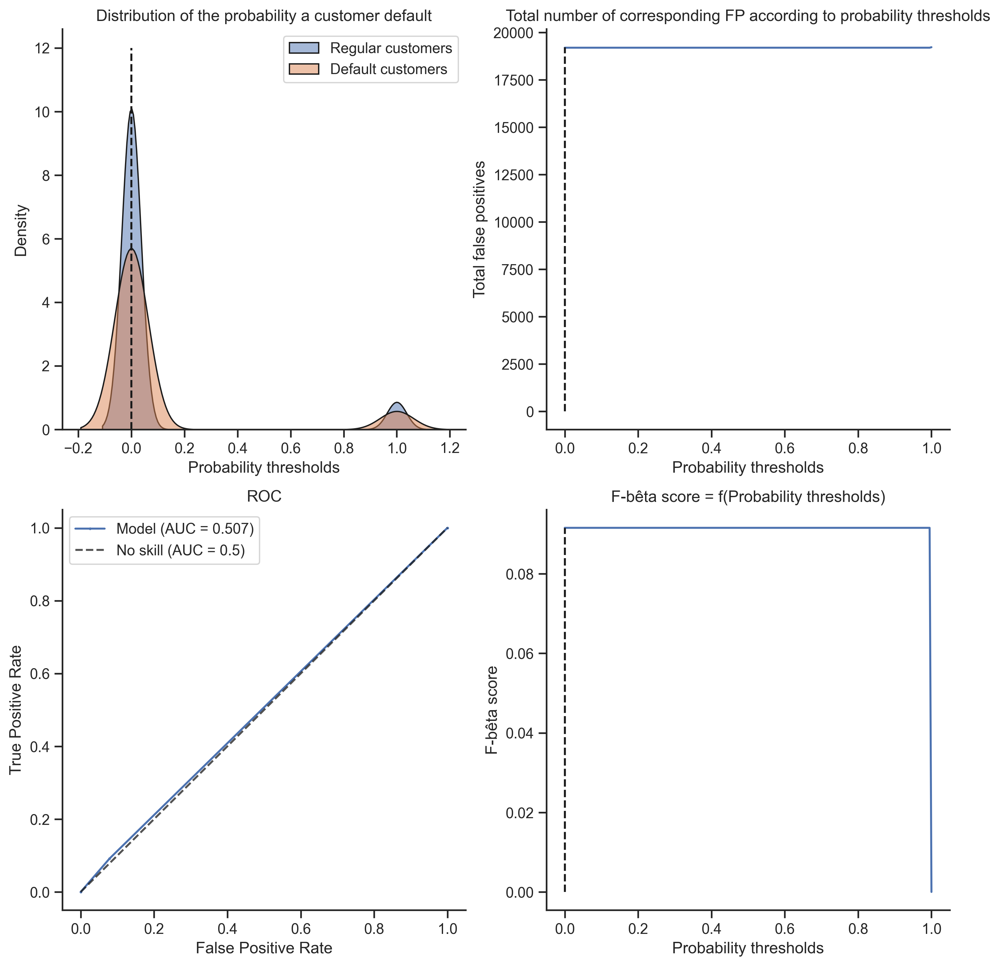


----------------------------------------------------------------------------------------------------

Updating entry...
Done!
The row have been updated.


,Models,yhat_train,yhat_test,Best_proba_threshold_train,Best_proba_threshold_test,Job_score_train,Job_score_test,AUROC_scores_train,AUROC_scores_test,F-bêta_score_train,F-bêta_score_test,Process_time_train (s),Process_time_test (s)
Model_labels,,,,,,,,,,,,,
dummy_clf,DummyClassifier(strategy='stratified'),"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, ...",0.000,0.0,0.535220,0.539438,0.506514,0.510236,0.091577,0.091748,0.118105,0.028026
logi_reg_opt,"LogisticRegression(C=100.0, class_weight='bala...","[0.5950216861017936, 0.5400718415302808, 0.430...","[0.34288296588972866, 0.4585440415379346, 0.56...",0.475,0.475,0.587815,0.581008,0.618610,0.601764,0.897919,0.897778,2.928672,0.345314
rf_clf_opt,"(DecisionTreeClassifier(max_depth=10, max_feat...","[0.5443689719737853, 0.6585302236646584, 0.177...","[0.42756610416750596, 0.5202812622906803, 0.13...",0.400,0.38,0.668959,0.640988,0.727212,0.696335,0.897898,0.901347,7.106856,1.94677
xgb_clf_opt,"XGBClassifier(base_score=None, booster=None, c...","[0.5688134, 0.62018585, 0.15535076, 0.42749348...","[0.3637119, 0.47850734, 0.07989965, 0.32197857...",0.475,0.465,0.684892,0.6625,0.741560,0.706817,0.898201,0.897944,3.163377,1.121018
lgbm_clf_opt,"LGBMClassifier(class_weight='balanced', colsam...","[0.6142795453522419, 0.6490163088635007, 0.246...","[0.5517143544597476, 0.38818625549996316, 0.16...",0.505,0.485,0.681817,0.651357,0.742423,0.702991,0.898531,0.898577,1.303183,0.516469


CPU times: total: 9.17 s
Wall time: 6.74 s


In [299]:
%%time

# Initialize local variables.
model = dummy_clf
model_label = 'dummy_clf'
eval_dataset = 'valid_set'
get_csv_file = GET_CSV_FILE


# Train the model and get its predictions probabilities.
y_pred_proba_NP, process_time = model_fit_predict(model_opt)

print('sklearn cross val score =', np.mean(cross_val_score(model, X_TRAIN, y_TRAIN, scoring='roc_auc', cv=SKF_5, n_jobs=-1)))

# Evaluate the model.
best_thr, g_norm, rocauc, fbeta = evaluate(y_pred_proba_NP[:,1], y_true=y_TRAIN)


# Store the relevant values in the model storage dataframe.
l_vars = [model_label, model, y_pred_proba_NP[:,1], best_thr, g_norm, rocauc, fbeta, process_time]

# Update the csv file if the main score is higher and the user allowed it.
print("\n" + "-" * 100 + "\n")
df_MODELS = update_sum_table(df_MODELS, l_vars, get_csv_file, eval_dataset)
                        
# Show the table.
display(df_MODELS)

#### iii. Generalization over the testset


ROC-AUC = 0.502355
F-Bêta score of the optimal threshold found = 0.079
Highest F-Bêta score = 0.079
Job score: 0.532

----------------------------------------------------------------------------------------------------



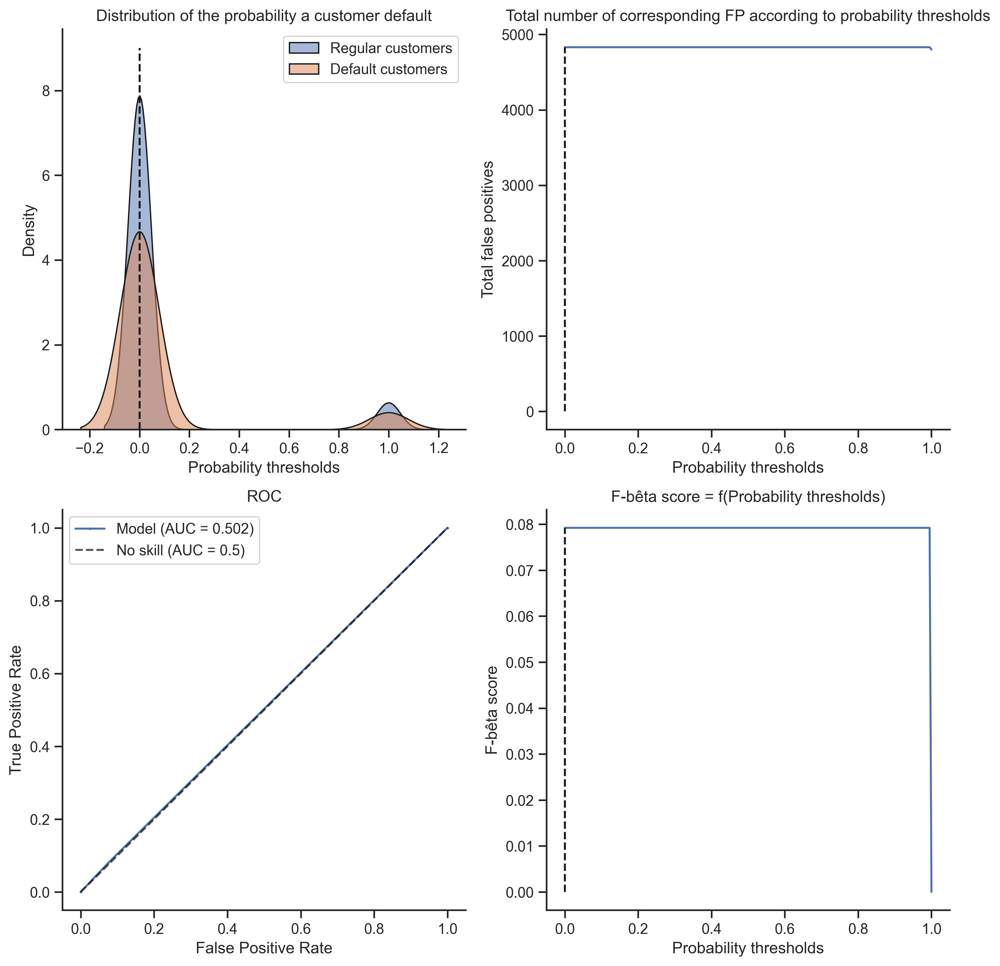


----------------------------------------------------------------------------------------------------

The new score is inferior to the one already saved.
Dataframe not saved.


,Models,yhat_train,yhat_test,Best_proba_threshold_train,Best_proba_threshold_test,Job_score_train,Job_score_test,AUROC_scores_train,AUROC_scores_test,F-bêta_score_train,F-bêta_score_test,Process_time_train (s),Process_time_test (s)
Model_labels,,,,,,,,,,,,,
dummy_clf,DummyClassifier(strategy='stratified'),"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, ...",0.000,0.0,0.535220,0.539438,0.506514,0.510236,0.091577,0.091748,0.118105,0.028026
logi_reg_opt,"LogisticRegression(C=100.0, class_weight='bala...","[0.5950216861017936, 0.5400718415302808, 0.430...","[0.34288296588972866, 0.4585440415379346, 0.56...",0.475,0.475,0.587815,0.581008,0.618610,0.601764,0.897919,0.897778,2.928672,0.345314
rf_clf_opt,"(DecisionTreeClassifier(max_depth=10, max_feat...","[0.5443689719737853, 0.6585302236646584, 0.177...","[0.42756610416750596, 0.5202812622906803, 0.13...",0.400,0.38,0.668959,0.640988,0.727212,0.696335,0.897898,0.901347,7.106856,1.94677
xgb_clf_opt,"XGBClassifier(base_score=None, booster=None, c...","[0.5688134, 0.62018585, 0.15535076, 0.42749348...","[0.3637119, 0.47850734, 0.07989965, 0.32197857...",0.475,0.465,0.684892,0.6625,0.741560,0.706817,0.898201,0.897944,3.163377,1.121018
lgbm_clf_opt,"LGBMClassifier(class_weight='balanced', colsam...","[0.6142795453522419, 0.6490163088635007, 0.246...","[0.5517143544597476, 0.38818625549996316, 0.16...",0.505,0.485,0.681817,0.651357,0.742423,0.702991,0.898531,0.898577,1.303183,0.516469


CPU times: total: 6.06 s
Wall time: 3.03 s


In [300]:
%%time

# Initialize local variables.
model = dummy_clf
model_label = 'dummy_clf'
eval_dataset = 'test_set'
get_csv_file = GET_CSV_FILE


# Train the model and get its predictions probabilities.
y_pred_proba_NP, process_time = model_fit_predict(model, X=X_TEST, y=y_TEST)


#print('sklearn score =', model.score(X_TEST, y_TEST, scoring='roc_auc', cv=SKF_5, n_jobs=-1))

# Evaluate the model.
best_thr, g_norm, rocauc, fbeta = evaluate(y_pred_proba_NP[:,1], y_true=y_TEST)


# Store the relevant values in the model storage dataframe.
l_vars = [model_label, model, y_pred_proba_NP[:,1], best_thr, g_norm, rocauc, fbeta, process_time]

# Update the csv file if the main score is higher and the user allowed it.
print("\n" + "-" * 100 + "\n")
df_MODELS = update_sum_table(df_MODELS, l_vars, get_csv_file, eval_dataset)
                        
# Show the table.
display(df_MODELS)

### b) Logistic regressor

#### i. Hyperparameters tuning

In [301]:
from sklearn.linear_model import LogisticRegression

In [404]:
# Way to manage imbalanced data.
imb_process = IMB_PROCESS

# Initialize the model.
model = LogisticRegression()

# Create the label of the model.
model_label = select_model_label(imb_process, 'logi_reg_opt')

# Initiliaze the model or the pipeline with its default values.
# NB: scaler = MinMaxScaler() as binary categories won't be changed and
#     the distance between all other values of a feature will be kept.
model_pl = set_model_pipeline(model, imb_process)
model_pl

Pipeline(steps=[('scaler', MinMaxScaler()), ('model', LogisticRegression())])

In [406]:
# Get the list of the model's hyperparameters.
pprint(model_pl.get_params(), compact=True)

{'memory': None,
 'model': LogisticRegression(),
 'model__C': 1.0,
 'model__class_weight': None,
 'model__dual': False,
 'model__fit_intercept': True,
 'model__intercept_scaling': 1,
 'model__l1_ratio': None,
 'model__max_iter': 100,
 'model__multi_class': 'auto',
 'model__n_jobs': None,
 'model__penalty': 'l2',
 'model__random_state': None,
 'model__solver': 'lbfgs',
 'model__tol': 0.0001,
 'model__verbose': 0,
 'model__warm_start': False,
 'scaler': MinMaxScaler(),
 'scaler__clip': False,
 'scaler__copy': True,
 'scaler__feature_range': (0, 1),
 'steps': [('scaler', MinMaxScaler()), ('model', LogisticRegression())],
 'verbose': False}


In [418]:
### Hyperparameters tuning range setting ###

# Set the value's ranges to try for the selected hypermarameters to tune.
C = [x for x in np.logspace(start=-5, stop=2, num=8)]
penalty = [None, 'l2', 'l1', 'elasticnet']


### Building of the hyperparameters' dictionary ###

# Add the classifier's hyperparameters to tune.
hyperparams_grid = ({'model__C': C,
                     'model__penalty': penalty})


### Add and/or set additional contextual hyperparameters if required ###

# Add SMOTE hyperparameters in the case of data resampling.
if imb_process == 'Resp':
    hyperparams_grid.update(SMOTE_GRID)

# Add a weight hyperparameter for the imbalanced data.
elif imb_process == 'Weight':
    model_pl['model'].set_params(class_weight='balanced')


### Check the results ###    

# Show the hyperparameters list and their associated range of values to try.
print("Hyperameters tuning ranges:")
pprint(hyperparams_grid)

print()

# Show the pipeline models' default hyperparmeters' values.
print("Default values of the model's hyperparameters:")
pprint(model_pl)

Hyperameters tuning ranges:
{'model__C': [1e-05, 0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0],
 'model__penalty': [None, 'l2', 'l1', 'elasticnet']}

Deafult values of the model's hyperparameters:
Pipeline(steps=[('scaler', MinMaxScaler()),
                ('model', LogisticRegression(class_weight='balanced'))])


In [362]:
%%time

# True: Tune hyperparameters, False: Get the last tuned results stored.
tune = HT

# Tune the hyperparameters of the model.
# NB: Verbose displays within the terminal of the server session.
if tune:
    model_grid = hyper_tune_rand_grid(model_pl, X_TRAIN, y_TRAIN, hyperparams_grid, g_norm_scorer, SKF_5,
                                      n_iter=20, grid_loop=1, range_precision=None, rand_state=0, verbose=2)

    # Get the model set with the best hyperparameters found.
    logi_reg_opt = model_grid.best_estimator_

# Load the last values calculated for the hyperparameters.
else:
    df_MODELS = pd.read_pickle(os.path.join(EXPORTS_MODELS_DIR_PATH, PKL_MODELS_FILE))#.set_index('Model_labels')
    logi_reg_opt = df_MODELS.loc['Logi_reg_opt', 'Models']
    
print()

Fitting 5 folds for each of 20 candidates, totalling 100 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits

Best estimator found:
 Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampler',
                 SMOTE(k_neighbors=8, random_state=0, sampling_strategy=1.0)),
                ('model', LogisticRegression(C=0.01))])

Best score found:
 score = 0.683

Best hyperparameters found:
 {'model__C': 0.01, 'model__penalty': 'l2', 'resampler__k_neighbors': 8, 'resampler__sampling_strategy': 1.0}

CPU times: total: 11.3 s
Wall time: 22.2 s


In [323]:
### Beysian optimization ###

# Set the KFold cross validation with the selected n_folds.
#skf = StratifiedKFold(5, shuffle=True, random_state=0)
#search_space = {'C': hp.loguniform('C', math.log10(0.00001), math.log10(1.0)),
#                'proba_thr': hp.quniform('proba_thr', 0.0, 1.0, 0.01)}


#test = hyper_tune_bayes(logi_reg, search_space, model_label='lr', cv=skf,
#                        max_eval=3, action=1)# eval_metric=roc_auc_score, eval_metric_label='auroc' )

#### ii. Evalutation of the optimized model performances

sklearn cross val score = 0.7425610730134294

ROC-AUC = 0.742460
F-Bêta score of the optimal threshold found = 0.652
Highest F-Bêta score = 0.899
Job score: 0.680

----------------------------------------------------------------------------------------------------



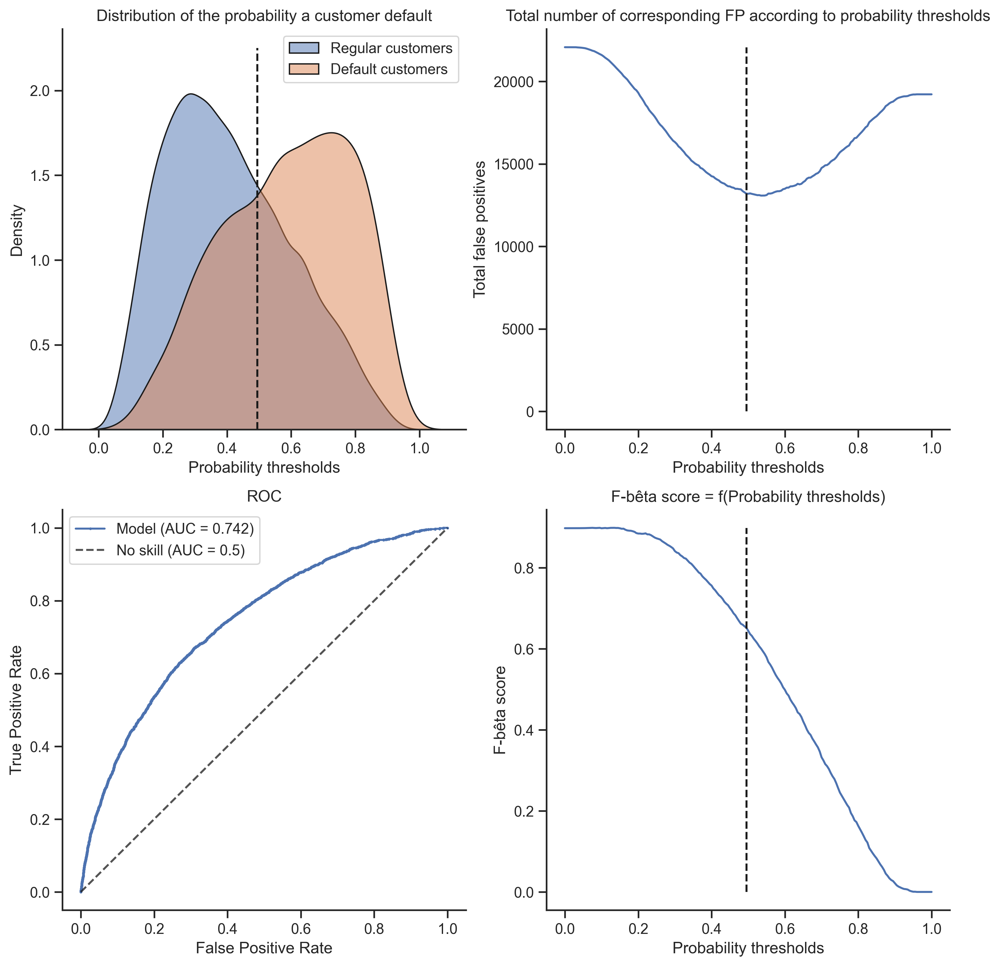


----------------------------------------------------------------------------------------------------

Creating new entry...
Done!
The new informations have been saved in a new row.


,Models,yhat_train,yhat_test,Best_proba_threshold_train,Best_proba_threshold_test,Job_score_train,Job_score_test,AUROC_scores_train,AUROC_scores_test,F-bêta_score_train,F-bêta_score_test,Process_time_train (s),Process_time_test (s)
Model_labels,,,,,,,,,,,,,
dummy_clf,DummyClassifier(strategy='stratified'),"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, ...",0.000,0.0,0.535220,0.539438,0.506514,0.510236,0.091577,0.091748,0.118105,0.028026
logi_reg_opt,"LogisticRegression(C=100.0, class_weight='bala...","[0.5950216861017936, 0.5400718415302808, 0.430...","[0.34288296588972866, 0.4585440415379346, 0.56...",0.475,0.475,0.587815,0.581008,0.618610,0.601764,0.897919,0.897778,2.928672,0.345314
rf_clf_opt,"(DecisionTreeClassifier(max_depth=10, max_feat...","[0.5443689719737853, 0.6585302236646584, 0.177...","[0.42756610416750596, 0.5202812622906803, 0.13...",0.400,0.38,0.668959,0.640988,0.727212,0.696335,0.897898,0.901347,7.106856,1.94677
xgb_clf_opt,"XGBClassifier(base_score=None, booster=None, c...","[0.5688134, 0.62018585, 0.15535076, 0.42749348...","[0.3637119, 0.47850734, 0.07989965, 0.32197857...",0.475,0.465,0.684892,0.6625,0.741560,0.706817,0.898201,0.897944,3.163377,1.121018
lgbm_clf_opt,"LGBMClassifier(class_weight='balanced', colsam...","[0.6142795453522419, 0.6490163088635007, 0.246...","[0.5517143544597476, 0.38818625549996316, 0.16...",0.505,0.485,0.681817,0.651357,0.742423,0.702991,0.898531,0.898577,1.303183,0.516469
logi_reg_opt_dt_sp,"(MinMaxScaler(), SMOTE(k_neighbors=10, random_...","[0.6010609071046806, 0.6039352551291393, 0.115...","[0.09112835665798243, 0.5446520704704663, 0.30...",0.370,0.31,0.677604,0.65,0.734119,0.710206,0.898762,0.897778,4.625697,0.583532
wt_logi_reg_opt,"(MinMaxScaler(), LogisticRegression(C=0.1, cla...","[0.6512462417233318, 0.6626875538059055, 0.215...",NaN,0.495,NaN,0.680413,NaN,0.742460,NaN,0.898795,NaN,3.182272,NaN


CPU times: total: 11.5 s
Wall time: 10.1 s


In [352]:
%%time

# Initialize local variables.
model_opt = logi_reg_opt
eval_dataset = 'valid_set'
get_csv_file = GET_CSV_FILE


# Train the model and get its predictions probabilities.
y_pred_proba_NP, process_time = model_fit_predict(model_opt)


print('sklearn cross val score =', np.mean(cross_val_score(model_opt, X_TRAIN, y_TRAIN, scoring='roc_auc', cv=SKF_5, n_jobs=-1)))

# Evaluate the model.
best_thr, g_norm, rocauc, fbeta = evaluate(y_pred_proba_NP[:,1], y_true=y_TRAIN)


# Store the relevant values in the model storage dataframe.
l_vars = [model_label, model_opt, y_pred_proba_NP[:,1], best_thr, g_norm, rocauc, fbeta, process_time]

# Update the csv file if the main score is higher and the user allowed it.
print("\n" + "-" * 100 + "\n")
df_MODELS = update_sum_table(df_MODELS, l_vars, get_csv_file, eval_dataset, force_update=True)
                        
# Show the table.
display(df_MODELS)

#### iii. Generalization over the test set


ROC-AUC = 0.719538
F-Bêta score of the optimal threshold found = 0.593
Highest F-Bêta score = 0.900
Job score: 0.659

----------------------------------------------------------------------------------------------------



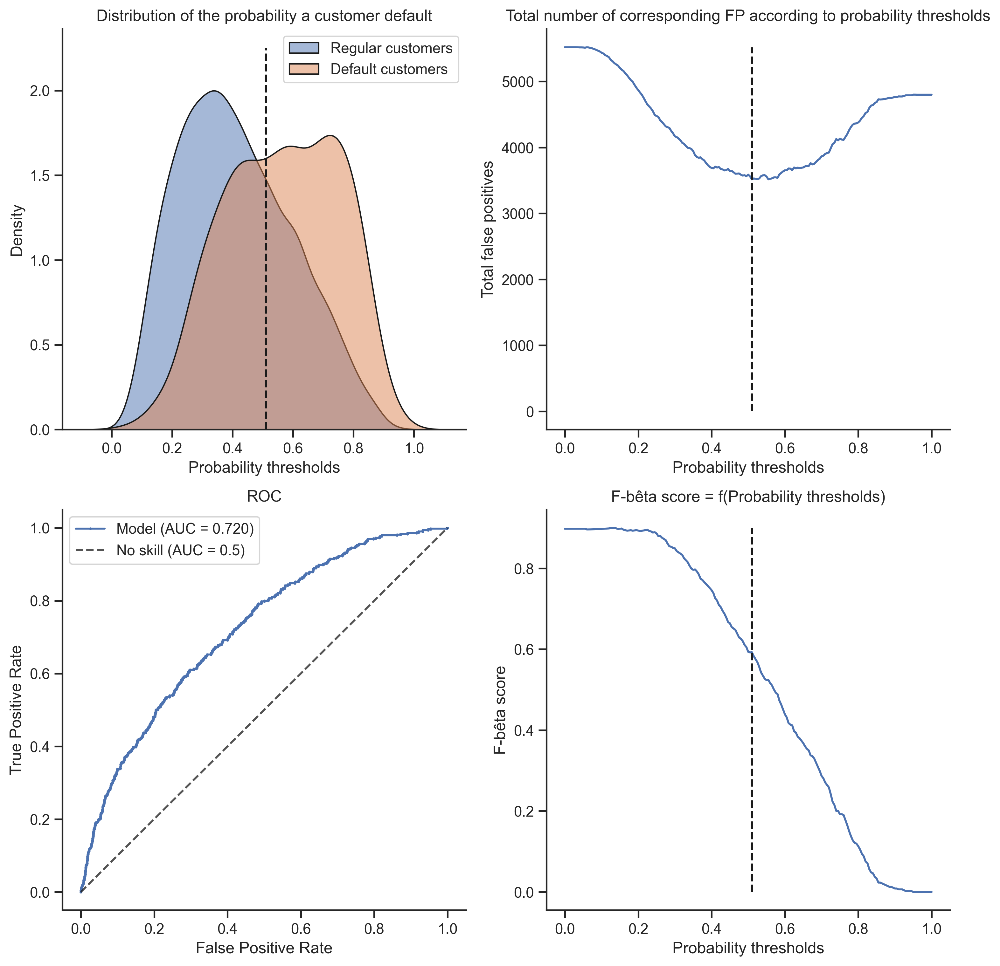


----------------------------------------------------------------------------------------------------

Updating entry...
Done!
The row have been updated.


,Models,yhat_train,yhat_test,Best_proba_threshold_train,Best_proba_threshold_test,Job_score_train,Job_score_test,AUROC_scores_train,AUROC_scores_test,F-bêta_score_train,F-bêta_score_test,Process_time_train (s),Process_time_test (s)
Model_labels,,,,,,,,,,,,,
dummy_clf,DummyClassifier(strategy='stratified'),"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, ...",0.000,0.0,0.535220,0.539438,0.506514,0.510236,0.091577,0.091748,0.118105,0.028026
logi_reg_opt,"LogisticRegression(C=100.0, class_weight='bala...","[0.5950216861017936, 0.5400718415302808, 0.430...","[0.34288296588972866, 0.4585440415379346, 0.56...",0.475,0.475,0.587815,0.581008,0.618610,0.601764,0.897919,0.897778,2.928672,0.345314
rf_clf_opt,"(DecisionTreeClassifier(max_depth=10, max_feat...","[0.5443689719737853, 0.6585302236646584, 0.177...","[0.42756610416750596, 0.5202812622906803, 0.13...",0.400,0.38,0.668959,0.640988,0.727212,0.696335,0.897898,0.901347,7.106856,1.94677
xgb_clf_opt,"XGBClassifier(base_score=None, booster=None, c...","[0.5688134, 0.62018585, 0.15535076, 0.42749348...","[0.3637119, 0.47850734, 0.07989965, 0.32197857...",0.475,0.465,0.684892,0.6625,0.741560,0.706817,0.898201,0.897944,3.163377,1.121018
lgbm_clf_opt,"LGBMClassifier(class_weight='balanced', colsam...","[0.6142795453522419, 0.6490163088635007, 0.246...","[0.5517143544597476, 0.38818625549996316, 0.16...",0.505,0.485,0.681817,0.651357,0.742423,0.702991,0.898531,0.898577,1.303183,0.516469
logi_reg_opt_dt_sp,"(MinMaxScaler(), SMOTE(k_neighbors=10, random_...","[0.6010609071046806, 0.6039352551291393, 0.115...","[0.09112835665798243, 0.5446520704704663, 0.30...",0.370,0.31,0.677604,0.65,0.734119,0.710206,0.898762,0.897778,4.625697,0.583532
wt_logi_reg_opt,"(MinMaxScaler(), LogisticRegression(C=0.1, cla...","[0.6512462417233318, 0.6626875538059055, 0.215...","[0.4661041263911844, 0.48343001608522007, 0.38...",0.495,0.51,0.680413,0.659302,0.742460,0.719538,0.898795,0.900108,3.182272,0.35556


CPU times: total: 6.3 s
Wall time: 3.37 s


In [353]:
%%time

# Initialize local variables.
model_opt = logi_reg_opt
eval_dataset = 'test_set'
get_csv_file = GET_CSV_FILE


# Train the model and get its predictions probabilities.
y_pred_proba_NP, process_time = model_fit_predict(model_opt, X=X_TEST, y=y_TEST)


#print('sklearn score =', model.score(X_TEST, y_TEST, scoring='roc_auc', cv=SKF_5, n_jobs=-1))

# Evaluate the model.
best_thr, g_norm, rocauc, fbeta = evaluate(y_pred_proba_NP[:,1], y_true=y_TEST)


# Store the relevant values in the model storage dataframe.
l_vars = [model_label, model_opt, y_pred_proba_NP[:,1], best_thr, g_norm, rocauc, fbeta, process_time]


# Update the csv file if the main score is higher and the user allowed it.
print("\n" + "-" * 100 + "\n")
df_MODELS = update_sum_table(df_MODELS, l_vars, get_csv_file, eval_dataset, force_update=True)
                        
# Show the table.
display(df_MODELS)

### c) Random forest

In [380]:
from sklearn.ensemble import RandomForestClassifier

#### i. Hyperparameters tuning

In [421]:
# Initiliaze the model with its default values.
model = RandomForestClassifier()

# Way to manage imbalanced data.
imb_process = IMB_PROCESS

# Create the label of the model.
model_label = select_model_label(imb_process, 'rf_clf_opt')

# Initiliaze the model or the pipeline with its default values.
# NB: scaler = MinMaxScaler() as binary categories won't be changed and
#     the distance between all other values of a feature will be kept.
model_pl = set_model_pipeline(model, imb_process = IMB_PROCESS)
model_pl

Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampler', SMOTE(random_state=0)),
                ('model', RandomForestClassifier())])

In [430]:
# Get the list of the model's hyperparameters.
pprint(model_pl.get_params(), compact=True)

{'memory': None,
 'model': RandomForestClassifier(),
 'model__bootstrap': True,
 'model__ccp_alpha': 0.0,
 'model__class_weight': None,
 'model__criterion': 'gini',
 'model__max_depth': None,
 'model__max_features': 'sqrt',
 'model__max_leaf_nodes': None,
 'model__max_samples': None,
 'model__min_impurity_decrease': 0.0,
 'model__min_samples_leaf': 1,
 'model__min_samples_split': 2,
 'model__min_weight_fraction_leaf': 0.0,
 'model__n_estimators': 100,
 'model__n_jobs': None,
 'model__oob_score': False,
 'model__random_state': None,
 'model__verbose': 0,
 'model__warm_start': False,
 'resampler': SMOTE(random_state=0),
 'resampler__k_neighbors': 5,
 'resampler__n_jobs': None,
 'resampler__random_state': 0,
 'resampler__sampling_strategy': 'auto',
 'scaler': MinMaxScaler(),
 'scaler__clip': False,
 'scaler__copy': True,
 'scaler__feature_range': (0, 1),
 'steps': [('scaler', MinMaxScaler()), ('resampler', SMOTE(random_state=0)),
           ('model', RandomForestClassifier())],
 'verbose'

In [436]:
### Hyperparameters tuning range setting ###

# Number of trees in the random forest.
n_estimators = [int(x) for x in np.linspace(start = 1, stop = 50, num = 51)]

# Maximum number of levels in each tree.
max_depth = [int(x) for x in np.linspace(1, 100, num = 11)]

# Minimum number of samples required to split a node.
min_samples_split = [int(x) for x in np.linspace(1, 100, num = 11)]

# Use or don't bootstrap samples.
#bootstrap = [True, False]

# Number of features to consider at every split.
max_features = [None, 'auto', 'sqrt', 'log2']


### Building of the hyperparameters' dictionary ###

# Add the classifier's hyperparameters to tune.
hyperparams_grid = {'model__n_estimators': n_estimators,
                    'model__max_depth': max_depth,
                    'model__min_samples_split': min_samples_split,
                    #'model__bootstrap': bootstrap,
                    'model__max_features': max_features,
                   }


### Add and/or set additional contextual hyperparameters if required ###

# Add SMOTE hyperparameters in the case of data resampling.
if imb_process == 'Resp':
    hyperparams_grid.update(SMOTE_GRID)

# Add a weight hyperparameter for the imbalanced data.
elif imb_process == 'Weight':
    model_pl['model'].set_params(class_weight='balanced')


### Check the results ###    

# Show the hyperparameters list and their associated range of values to try.
print("Hyperameters tuning ranges:")
pprint(hyperparams_grid, compact=True)

print()

# Show the pipeline models' default hyperparmeters' values.
print("Default values of the model's hyperparameters:")
pprint(model_pl)

Hyperameters tuning ranges:
{'model__max_depth': [1, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100],
 'model__max_features': [None, 'auto', 'sqrt', 'log2'],
 'model__min_samples_split': [1, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100],
 'model__n_estimators': [1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15,
                         16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29,
                         30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43,
                         44, 45, 46, 47, 48, 49, 50],
 'resampler__k_neighbors': [3, 4, 6, 8, 10],
 'resampler__sampling_strategy': [0.2, 0.4, 0.6, 0.8, 1.0]}

Default values of the model's hyperparameters:
Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampler', SMOTE(random_state=0)),
                ('model', RandomForestClassifier())])


In [437]:
%%time

# True: Tune hyperparameters, False: Get the last tuned results stored.
tune = HT

# Tune the hyperparameters of the model.
if tune:
    model_grid = hyper_tune_rand_grid(model_pl, X_TRAIN, y_TRAIN, hyperparams_grid, g_norm_scorer, SKF_5,
                                      n_iter=100, grid_loop=1, range_precision=None, rand_state=0, verbose=3)

    # Get the model set with the best hyperparameters found.
    rf_clf_opt = model_grid.best_estimator_

# Load the last values calculated for the hyperparameters.
else:
    df_MODELS = pd.read_pickle(os.path.join(EXPORTS_MODELS_DIR_PATH, PKL_MODELS_FILE))#.set_index('Model_labels')
    rf_clf_opt = df_MODELS.loc[model_label, 'Models']
    
print()

Fitting 5 folds for each of 100 candidates, totalling 500 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits

Best estimator found:
 Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampler',
                 SMOTE(k_neighbors=3, random_state=0, sampling_strategy=0.4)),
                ('model',
                 RandomForestClassifier(max_depth=10, max_features='log2',
                                        min_samples_split=70,
                                        n_estimators=40))])

Best score found:
 score = 0.673

Best hyperparameters found:
 {'model__max_depth': 10, 'model__max_features': 'log2', 'model__min_samples_split': 70, 'model__n_estimators': 40, 'resampler__k_neighbors': 3, 'resampler__sampling_strategy': 0.4}

CPU times: total: 26 s
Wall time: 7min 40s


#### ii. Evaluation of the optimized model performances

sklearn cross val score = 0.7206592679855428

ROC-AUC = 0.719419
F-Bêta score of the optimal threshold found = 0.613
Highest F-Bêta score = 0.898
Job score: 0.669

----------------------------------------------------------------------------------------------------



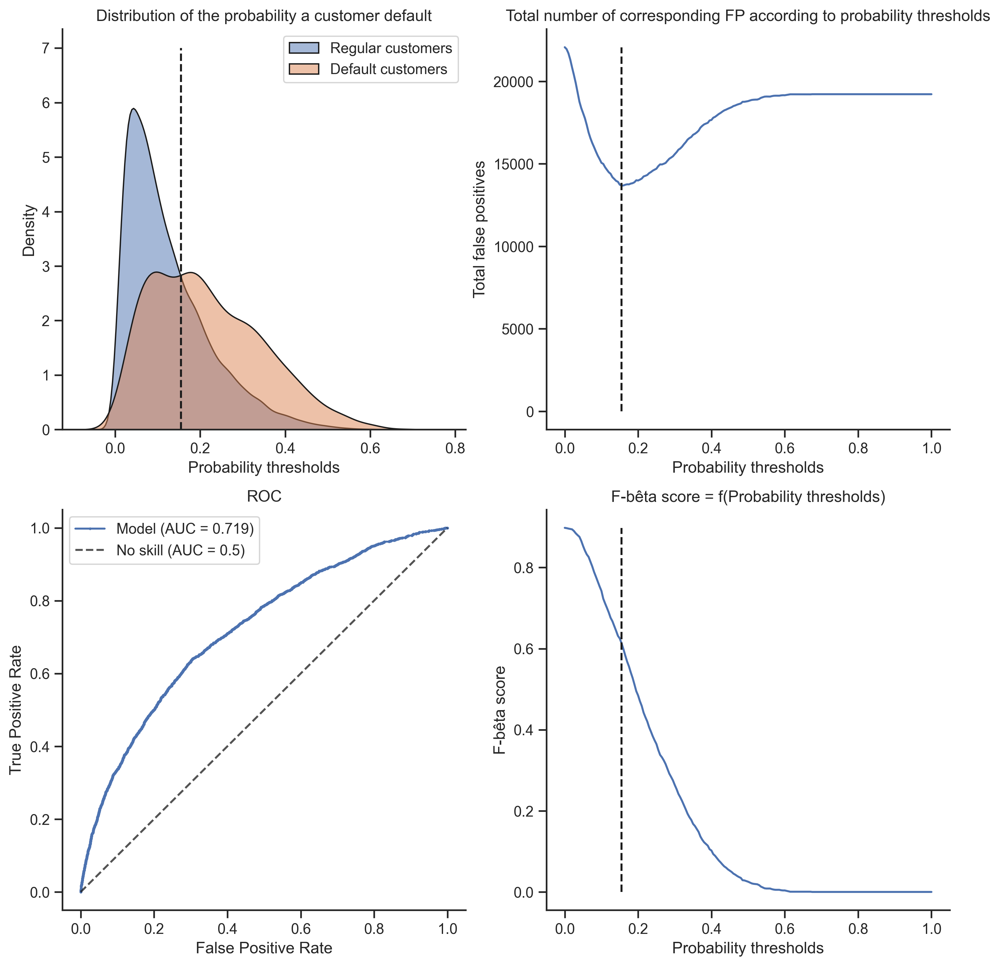


----------------------------------------------------------------------------------------------------

Creating new entry...
Done!
The new informations have been saved in a new row.


,Models,yhat_train,yhat_test,Best_proba_threshold_train,Best_proba_threshold_test,Job_score_train,Job_score_test,AUROC_scores_train,AUROC_scores_test,F-bêta_score_train,F-bêta_score_test,Process_time_train (s),Process_time_test (s)
Model_labels,,,,,,,,,,,,,
dummy_clf,DummyClassifier(strategy='stratified'),"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, ...",0.000,0.0,0.535220,0.539438,0.506514,0.510236,0.091577,0.091748,0.118105,0.028026
logi_reg_opt,"LogisticRegression(C=100.0, class_weight='bala...","[0.5950216861017936, 0.5400718415302808, 0.430...","[0.34288296588972866, 0.4585440415379346, 0.56...",0.475,0.475,0.587815,0.581008,0.618610,0.601764,0.897919,0.897778,2.928672,0.345314
rf_clf_opt,"(DecisionTreeClassifier(max_depth=10, max_feat...","[0.5443689719737853, 0.6585302236646584, 0.177...","[0.42756610416750596, 0.5202812622906803, 0.13...",0.400,0.38,0.668959,0.640988,0.727212,0.696335,0.897898,0.901347,7.106856,1.94677
xgb_clf_opt,"XGBClassifier(base_score=None, booster=None, c...","[0.5688134, 0.62018585, 0.15535076, 0.42749348...","[0.3637119, 0.47850734, 0.07989965, 0.32197857...",0.475,0.465,0.684892,0.6625,0.741560,0.706817,0.898201,0.897944,3.163377,1.121018
lgbm_clf_opt,"LGBMClassifier(class_weight='balanced', colsam...","[0.6142795453522419, 0.6490163088635007, 0.246...","[0.5517143544597476, 0.38818625549996316, 0.16...",0.505,0.485,0.681817,0.651357,0.742423,0.702991,0.898531,0.898577,1.303183,0.516469
logi_reg_opt_dt_sp,"(MinMaxScaler(), SMOTE(k_neighbors=10, random_...","[0.6010609071046806, 0.6039352551291393, 0.115...","[0.09112835665798243, 0.5446520704704663, 0.30...",0.370,0.31,0.677604,0.65,0.734119,0.710206,0.898762,0.897778,4.625697,0.583532
wt_logi_reg_opt,"(MinMaxScaler(), LogisticRegression(C=0.1, cla...","[0.6512462417233318, 0.6626875538059055, 0.215...","[0.4661041263911844, 0.48343001608522007, 0.38...",0.495,0.51,0.680413,0.659302,0.742460,0.719538,0.898795,0.900108,3.182272,0.35556
wt_rf_clf_opt,"(MinMaxScaler(), SMOTE(k_neighbors=4, random_s...","[0.22779337291446336, 0.23599944893841715, 0.0...",NaN,0.155,NaN,0.668741,NaN,0.719419,NaN,0.897919,NaN,18.100912,NaN


CPU times: total: 31.5 s
Wall time: 28 s


In [433]:
%%time

# Initialize local variables.
model_opt = rf_clf_opt
eval_dataset = 'valid_set'
get_csv_file = GET_CSV_FILE


# Train the model and get its predictions probabilities.
y_pred_proba_NP, process_time = model_fit_predict(model_opt)


print('sklearn cross val score =', np.mean(cross_val_score(model_opt, X_TRAIN, y_TRAIN, scoring='roc_auc', cv=SKF_5, n_jobs=-1)))

# Evaluate the model.
best_thr, g_norm, rocauc, fbeta = evaluate(y_pred_proba_NP[:,1], y_true=y_TRAIN)


# Store the relevant values in the model storage dataframe.
l_vars = [model_label, model_opt, y_pred_proba_NP[:,1], best_thr, g_norm, rocauc, fbeta, process_time]

# Update the csv file if the main score is higher and the user allowed it.
print("\n" + "-" * 100 + "\n")
df_MODELS = update_sum_table(df_MODELS, l_vars, get_csv_file, eval_dataset)
                        
# Show the table.
display(df_MODELS)

#### iii. Generalization over the test set


ROC-AUC = 0.696335
F-Bêta score of the optimal threshold found = 0.594
Highest F-Bêta score = 0.901
Job score: 0.641

----------------------------------------------------------------------------------------------------



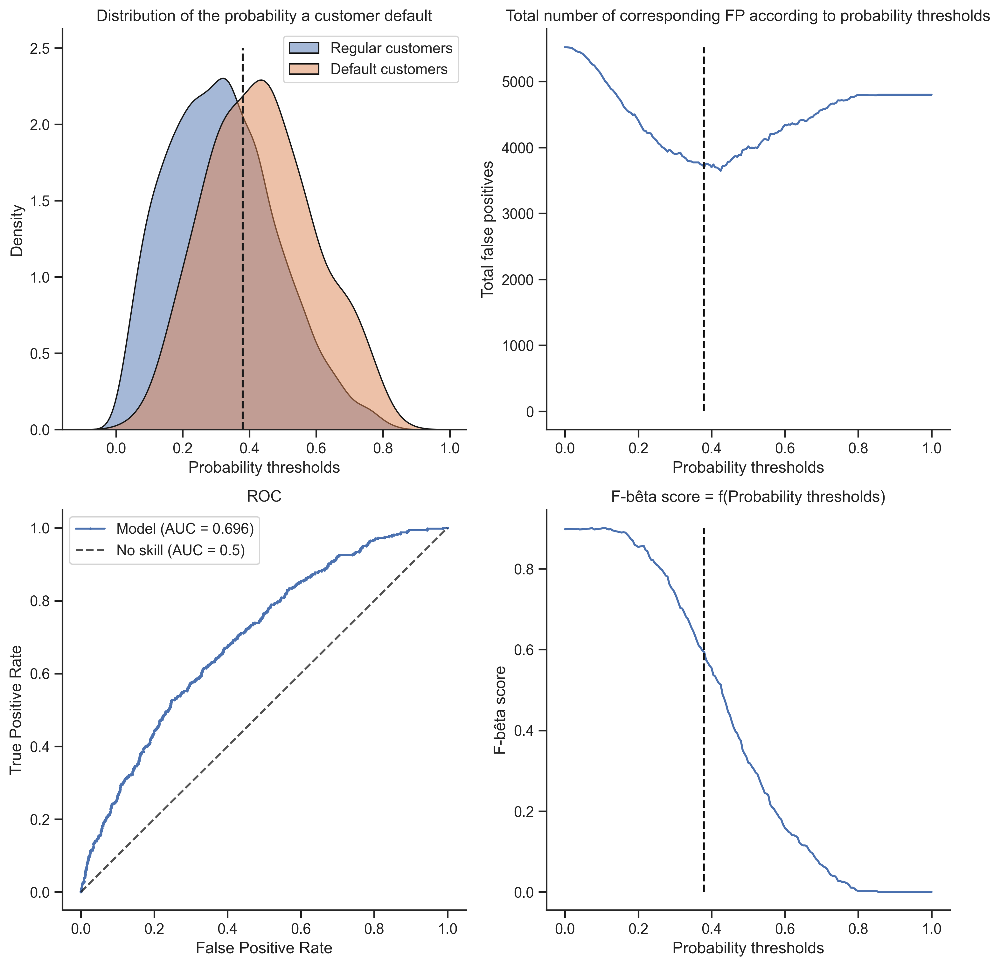


----------------------------------------------------------------------------------------------------

Updating entry...
Done!
The row have been updated.


,Models,yhat_train,yhat_test,Best_proba_threshold_train,Best_proba_threshold_test,Job_score_train,Job_score_test,AUROC_scores_train,AUROC_scores_test,F-bêta_score_train,F-bêta_score_test,Process_time_train (s),Process_time_test (s)
Model_labels,,,,,,,,,,,,,
dummy_clf,DummyClassifier(strategy='stratified'),"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, ...",1.000,1.0,0.534591,0.534884,0.499999,0.494565,0.078063,0.066694,0.110721,0.019011
logi_reg_opt,"LogisticRegression(C=100.0, class_weight='bala...","[0.5950216861017936, 0.5400718415302808, 0.430...","[0.34288296588972866, 0.4585440415379346, 0.56...",0.475,0.475,0.587815,0.581008,0.618610,0.601764,0.897919,0.897778,2.928672,0.345314
rf_clf_opt,"(DecisionTreeClassifier(max_depth=10, max_feat...","[0.5443689719737853, 0.6585302236646584, 0.177...","[0.42756610416750596, 0.5202812622906803, 0.13...",0.400,0.38,0.668959,0.640988,0.727212,0.696335,0.897898,0.901347,7.106856,1.94677
xgb_clf_opt,"XGBClassifier(base_score=None, booster=None, c...","[0.5688134, 0.62018585, 0.15535076, 0.42749348...","[0.3637119, 0.47850734, 0.07989965, 0.32197857...",0.475,0.465,0.684892,0.6625,0.741560,0.706817,0.898201,0.897944,3.163377,1.121018
lgbm_clf_opt,"LGBMClassifier(class_weight='balanced', colsam...","[0.6142795453522419, 0.6490163088635007, 0.246...","[0.5517143544597476, 0.38818625549996316, 0.16...",0.505,0.485,0.681817,0.651357,0.742423,0.702991,0.898531,0.898577,1.303183,0.516469


CPU times: total: 7.98 s
Wall time: 4.89 s


In [51]:
%%time

# Initialize local variables.
model_opt = rf_clf_opt
eval_dataset = 'test_set'
get_csv_file = GET_CSV_FILE


# Train the model and get its predictions probabilities.
y_pred_proba_NP, process_time = model_fit_predict(model_opt, X=X_TEST, y=y_TEST)


#print('sklearn score =', model.score(X_TEST, y_TEST, scoring='roc_auc', cv=SKF_5, n_jobs=-1))

# Evaluate the model.
best_thr, g_norm, rocauc, fbeta = evaluate(y_pred_proba_NP[:,1], y_true=y_TEST)


# Store the relevant values in the model storage dataframe.
l_vars = [model_label, model_opt, y_pred_proba_NP[:,1], best_thr, g_norm, rocauc, fbeta, process_time]

# Update the csv file if the main score is higher and the user allowed it.
print("\n" + "-" * 100 + "\n")
df_MODELS = update_sum_table(df_MODELS, l_vars, get_csv_file, eval_dataset)
                        
# Show the table.
display(df_MODELS)

### d) XGBoosting

In [52]:
import xgboost as xgb
from xgboost import XGBClassifier

print('XGBoost version:', xgb.__version__)

XGBoost version: 1.7.5


#### i. Hyperparameters tuning

In [53]:
# Initiliaze the model with its default values.
model = XGBClassifier(objective='binary:logistic', seed=0)

# Way to manage imbalanced data.
imb_process = IMB_PROCESS

# Create the label of the model.
model_label = select_model_label(imb_process, 'xgb_clf_opt')

# Initiliaze the model or the pipeline with its default values.
# NB: scaler = MinMaxScaler() as binary categories won't be changed and
#     the distance between all other values of a feature will be kept.
model_pl = set_model_pipeline(model, imb_process=IMB_PROCESS)
model_pl

In [449]:
# Get the list of the model's hyperparameters.
pprint(model_pl.get_params(), compact=True)

{'memory': None,
 'model': RandomForestClassifier(),
 'model__bootstrap': True,
 'model__ccp_alpha': 0.0,
 'model__class_weight': None,
 'model__criterion': 'gini',
 'model__max_depth': None,
 'model__max_features': 'sqrt',
 'model__max_leaf_nodes': None,
 'model__max_samples': None,
 'model__min_impurity_decrease': 0.0,
 'model__min_samples_leaf': 1,
 'model__min_samples_split': 2,
 'model__min_weight_fraction_leaf': 0.0,
 'model__n_estimators': 100,
 'model__n_jobs': None,
 'model__oob_score': False,
 'model__random_state': None,
 'model__verbose': 0,
 'model__warm_start': False,
 'resampler': SMOTE(random_state=0),
 'resampler__k_neighbors': 5,
 'resampler__n_jobs': None,
 'resampler__random_state': 0,
 'resampler__sampling_strategy': 'auto',
 'scaler': MinMaxScaler(),
 'scaler__clip': False,
 'scaler__copy': True,
 'scaler__feature_range': (0, 1),
 'steps': [('scaler', MinMaxScaler()), ('resampler', SMOTE(random_state=0)),
           ('model', RandomForestClassifier())],
 'verbose'

In [55]:
### Get the optimal number of trees thanks to early stopping ###

# Set the number of runs to perform.
n_es_loop = 5

# Set the xgboost evaluation metric for the early stopping.
# NB: if more than one evaluation metric are given the last one is used for early stopping
model.set_params(eval_metric='auc')

# Run the set amount of loops to get the most promising range of number of trees to get.
verbose = 0
l_n_iters = []
l_scores = []
l_n_trees = []
count = 0
for count in range(n_es_loop):
    model.fit(X_TRAIN, y_TRAIN, early_stopping_rounds=50, eval_set=[(X_TEST, y_TEST)], verbose=verbose)
    l_scores.append(model.best_score)
    l_n_iters.append(model.best_iteration)
    l_n_trees.append(model.best_ntree_limit)
    if verbose != 0:
        print()

# Show the results.    
print("Averages gotten on {0} loops. \
      \n Average score: {1}\n Average number of iterations: {2}\n Average number of trees: {3}".\
      format(n_es_loop, np.mean(l_scores), np.mean(l_n_iters), np.mean(l_n_trees)))

Averages gotten on 5 loops.       
 Average score: 0.709513134057971
 Average number of iterations: 12.0
 Average number of trees: 13.0


Finally, it appears that the optimal number of estimators depends too much on the other hyperparameters.<br>
=> The value is not set as default and will also by used in the searchCV.

In [448]:
### Hyperparameters tuning range setting ###

# 1. Forest's hyperparameters.

# Learning rate.
eta = [round(x, 2) for x in np.linspace(start=0.02, stop=0.3, num=15)]
#learning_rate = [x for x in np.logspace(-4, 0, 5)], # default 0.1 

# Number of trees in the random forest.
n_estimators = [int(x) for x in np.linspace(2, 50, 25)]


# 2. Tree's hyperparameters.

# Maximum number of levels in each tree.
max_depth = [int(x) for x in np.linspace(1, 100, 11)]

# Defines the minimum sum of weights of all observations required in a child.
min_child_weight = [int(x) for x in np.linspace(1, 10, 10)]

# Specify the minimum loss reduction required to make a split.
gamma = [x for x in np.linspace(0, 0.2, 11)] #uniform(0, 0.5)

# Denotes the fraction of observations to be random samples for each tree.
subsample = [x for x in np.linspace(0.5, 1.0, 6)]

# Denotes the fraction of columns to be random samples for each tree.
colsample_bytree = [x for x in np.linspace(0.5, 1.0, 6)]


# 3. Regulators' hyperparameters.

# L2 regularization term on weights (analogous to Ridge regression).
lambda_regul = [x for x in np.logspace(-4, 0, 5)], # default 0.1

# L1 regularization term on weight (analogous to Lasso regression)
alpha_regul = [x for x in np.logspace(-4, 0, 5)], # default 0.1 


### Building of the hyperparameters' dictionary ###

# Add the classifier's hyperparameters to tune.
hyperparams_grid = {'model__eta': eta,
                    'model__n_estimators': n_estimators,
                    'model__max_depth': max_depth,
                    'model__min_child_weight': min_child_weight,
                    'model__gamma': gamma,
                    'model__subsample': subsample,
                    'model__colsample_bytree': colsample_bytree
                   }


### Add and/or set additional contextual hyperparameters if required ###

# Add SMOTE hyperparameters in the case of data resampling.
if imb_process == 'Resp':
    hyperparams_grid.update(SMOTE_GRID)

# Add a weight hyperparameter for the imbalanced data.
elif imb_process == 'Weight':
    model_pl['model'].set_params(scale_pos_weight=9) # NB: scale_pos_weight = TN / TP


### Check the results ###    

# Show the hyperparameters list and their associated range of values to try.
print("Hyperameters tuning ranges:")
pprint(hyperparams_grid, compact=True)

print()

# Show the pipeline models' default hyperparmeters' values.
print("Default values of the model's hyperparameters:")
pprint(model_pl)

Hyperameters tuning ranges:
{'model__colsample_bytree': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
 'model__eta': [0.02, 0.04, 0.06, 0.08, 0.1, 0.12, 0.14, 0.16, 0.18, 0.2, 0.22,
                0.24, 0.26, 0.28, 0.3],
 'model__gamma': [0.0, 0.02, 0.04, 0.06, 0.08, 0.1, 0.12, 0.14, 0.16, 0.18,
                  0.2],
 'model__max_depth': [1, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100],
 'model__min_child_weight': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
 'model__n_estimators': [2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30,
                         32, 34, 36, 38, 40, 42, 44, 46, 48, 50],
 'model__subsample': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
 'resampler__k_neighbors': [3, 4, 6, 8, 10],
 'resampler__sampling_strategy': [0.2, 0.4, 0.6, 0.8, 1.0]}

Default values of the model's hyperparameters:
Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampler', SMOTE(random_state=0)),
                ('model', RandomForestClassifier())])


In [58]:
%%time

# True: Tune hyperparameters, False: Get the last tuned results stored.
tune = HT

# Tune the hyperparameters of the model.
if tune:
    model_grid = hyper_tune_rand_grid(model_pl, X_TRAIN, y_TRAIN, hyperparams_grid, g_norm_scorer, SKF_5,
                                      n_iter=100, grid_loop=1, range_precision=None, rand_state=0, verbose=3)

    # Get the model set with the best hyperparameters found.
    xgb_clf_opt = model_grid.best_estimator_

# Load the last values calculated for the hyperparameters.
else:
    df_MODELS = pd.read_pickle(os.path.join(EXPORTS_MODELS_DIR_PATH, PKL_MODELS_FILE))#.set_index('Model_labels')
    xgb_clf_opt = df_MODELS.loc['xgb_clf_opt', 'Models']
    
print()

Fitting 5 folds for each of 100 candidates, totalling 500 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits

Best estimator found:
 XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=1.0, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='auc', feature_types=None,
              gamma=0.4, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=2, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=80, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

Best score found:
 score = 0.686

Best hyperparameters found:
 {'colsample_bytree': 1.0, 'gamma': 0.4, 'lea

#### ii. Evaluation of the optimized model performances

sklearn cross val score = 0.7414031946673767

ROC-AUC = 0.741279
F-Bêta score of the optimal threshold found = 0.623
Highest F-Bêta score = 0.898
Job score: 0.684

----------------------------------------------------------------------------------------------------



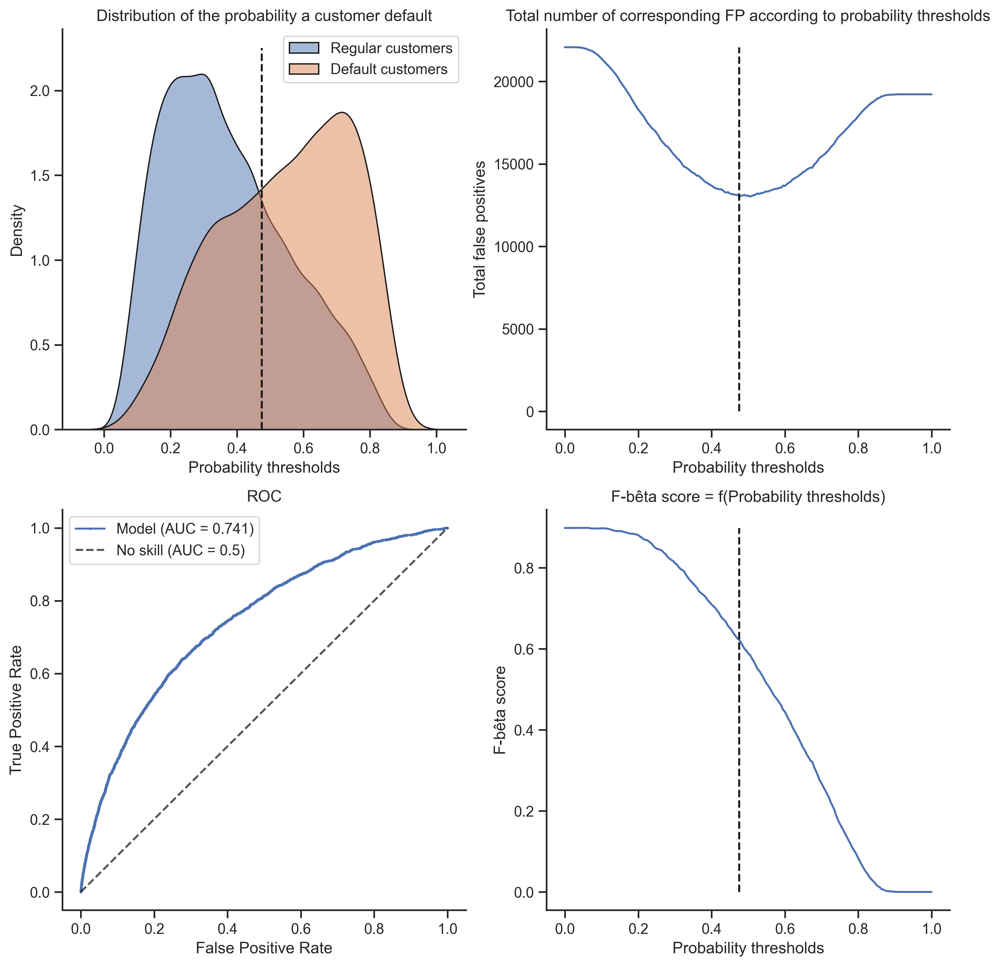


----------------------------------------------------------------------------------------------------

The new score is inferior to the one already saved.
Dataframe not saved.


,Models,yhat_train,yhat_test,Best_proba_threshold_train,Best_proba_threshold_test,Job_score_train,Job_score_test,AUROC_scores_train,AUROC_scores_test,F-bêta_score_train,F-bêta_score_test,Process_time_train (s),Process_time_test (s)
Model_labels,,,,,,,,,,,,,
dummy_clf,DummyClassifier(strategy='stratified'),"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, ...",1.000,1.0,0.534591,0.534884,0.499999,0.494565,0.078063,0.066694,0.110721,0.019011
logi_reg_opt,"LogisticRegression(C=100.0, class_weight='bala...","[0.5950216861017936, 0.5400718415302808, 0.430...","[0.34288296588972866, 0.4585440415379346, 0.56...",0.475,0.475,0.587815,0.581008,0.618610,0.601764,0.897919,0.897778,2.928672,0.345314
rf_clf_opt,"(DecisionTreeClassifier(max_depth=10, max_feat...","[0.5443689719737853, 0.6585302236646584, 0.177...","[0.42756610416750596, 0.5202812622906803, 0.13...",0.400,0.38,0.668959,0.640988,0.727212,0.696335,0.897898,0.901347,7.106856,1.94677
xgb_clf_opt,"XGBClassifier(base_score=None, booster=None, c...","[0.5688134, 0.62018585, 0.15535076, 0.42749348...","[0.3637119, 0.47850734, 0.07989965, 0.32197857...",0.475,0.465,0.684892,0.6625,0.741560,0.706817,0.898201,0.897944,3.163377,1.121018
lgbm_clf_opt,"LGBMClassifier(class_weight='balanced', colsam...","[0.6142795453522419, 0.6490163088635007, 0.246...","[0.5517143544597476, 0.38818625549996316, 0.16...",0.505,0.485,0.681817,0.651357,0.742423,0.702991,0.898531,0.898577,1.303183,0.516469


CPU times: total: 58.9 s
Wall time: 13.7 s


In [59]:
%%time

# Initialize local variables.
model_opt = xgb_clf_opt
eval_dataset = 'valid_set'
get_csv_file = GET_CSV_FILE


# Train the model and get its predictions probabilities.
y_pred_proba_NP, process_time = model_fit_predict(model_opt)


print('sklearn cross val score =', np.mean(cross_val_score(model_opt, X_TRAIN, y_TRAIN, scoring='roc_auc', cv=SKF_5, n_jobs=-1)))

# Evaluate the model.
best_thr, g_norm, rocauc, fbeta = evaluate(y_pred_proba_NP[:,1], y_true=y_TRAIN)


# Store the relevant values in the model storage dataframe.
l_vars = [model_label, model_opt, y_pred_proba_NP[:,1], best_thr, g_norm, rocauc, fbeta, process_time]

# Update the csv file if the main score is higher and the user allowed it.
print("\n" + "-" * 100 + "\n")
df_MODELS = update_sum_table(df_MODELS, l_vars, get_csv_file, eval_dataset)
                        
# Show the table.
display(df_MODELS)

#### iii. Generalization over the test set


ROC-AUC = 0.705211
F-Bêta score of the optimal threshold found = 0.706
Highest F-Bêta score = 0.898
Job score: 0.644

----------------------------------------------------------------------------------------------------



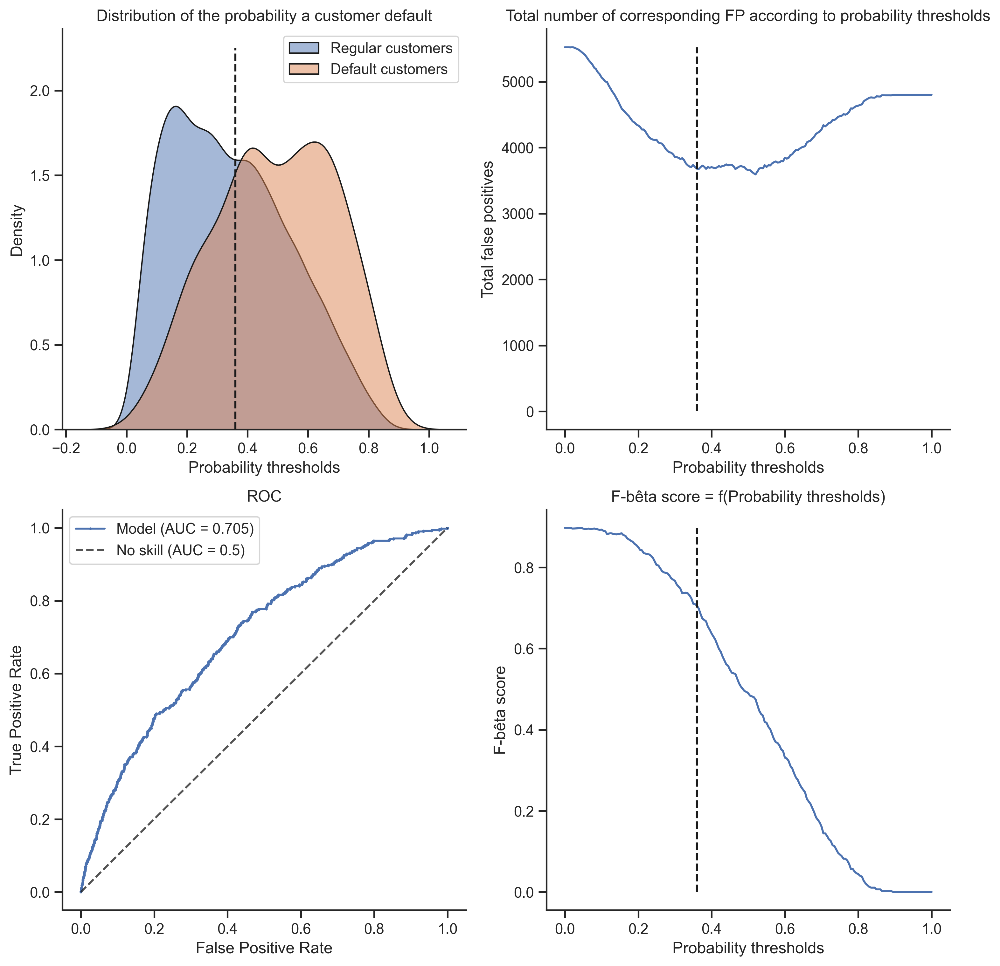


----------------------------------------------------------------------------------------------------

The new score is inferior to the one already saved.
Dataframe not saved.


,Models,yhat_train,yhat_test,Best_proba_threshold_train,Best_proba_threshold_test,Job_score_train,Job_score_test,AUROC_scores_train,AUROC_scores_test,F-bêta_score_train,F-bêta_score_test,Process_time_train (s),Process_time_test (s)
Model_labels,,,,,,,,,,,,,
dummy_clf,DummyClassifier(strategy='stratified'),"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, ...",1.000,1.0,0.534591,0.534884,0.499999,0.494565,0.078063,0.066694,0.110721,0.019011
logi_reg_opt,"LogisticRegression(C=100.0, class_weight='bala...","[0.5950216861017936, 0.5400718415302808, 0.430...","[0.34288296588972866, 0.4585440415379346, 0.56...",0.475,0.475,0.587815,0.581008,0.618610,0.601764,0.897919,0.897778,2.928672,0.345314
rf_clf_opt,"(DecisionTreeClassifier(max_depth=10, max_feat...","[0.5443689719737853, 0.6585302236646584, 0.177...","[0.42756610416750596, 0.5202812622906803, 0.13...",0.400,0.38,0.668959,0.640988,0.727212,0.696335,0.897898,0.901347,7.106856,1.94677
xgb_clf_opt,"XGBClassifier(base_score=None, booster=None, c...","[0.5688134, 0.62018585, 0.15535076, 0.42749348...","[0.3637119, 0.47850734, 0.07989965, 0.32197857...",0.475,0.465,0.684892,0.6625,0.741560,0.706817,0.898201,0.897944,3.163377,1.121018
lgbm_clf_opt,"LGBMClassifier(class_weight='balanced', colsam...","[0.6142795453522419, 0.6490163088635007, 0.246...","[0.5517143544597476, 0.38818625549996316, 0.16...",0.505,0.485,0.681817,0.651357,0.742423,0.702991,0.898531,0.898577,1.303183,0.516469


CPU times: total: 23.9 s
Wall time: 4.26 s


In [60]:
%%time

# Initialize local variables.
model_opt = xgb_clf_opt
eval_dataset = 'test_set'
get_csv_file = GET_CSV_FILE


# Train the model and get its predictions probabilities.
y_pred_proba_NP, process_time = model_fit_predict(model_opt, X=X_TEST, y=y_TEST)


#print('sklearn score =', model.score(X_TEST, y_TEST, scoring='roc_auc', cv=SKF_5, n_jobs=-1))

# Evaluate the model.
best_thr, g_norm, rocauc, fbeta = evaluate(y_pred_proba_NP[:,1], y_true=y_TEST)


# Store the relevant values in the model storage dataframe.
l_vars = [model_label, model_opt, y_pred_proba_NP[:,1], best_thr, g_norm, rocauc, fbeta, process_time]

# Update the csv file if the main score is higher and the user allowed it.
print("\n" + "-" * 100 + "\n")
df_MODELS = update_sum_table(df_MODELS, l_vars, get_csv_file, eval_dataset)
                        
# Show the table.
display(df_MODELS)

### e) LightGBM

In [35]:
import lightgbm as lgbm
from lightgbm import LGBMClassifier

print('lightgbm version:', lgbm.__version__)

lightgbm version: 3.3.5


#### i. Hyperparameters tuning

In [36]:
# Initiliaze the model with its default values.
model = LGBMClassifier(objective='binary', random_state=0)

# Way to manage imbalanced data.
imb_process = IMB_PROCESS

# Create the label of the model.
model_label = select_model_label(imb_process, 'lgbm_clf_opt')

# Initiliaze the model or the pipeline with its default values.
# NB: scaler = MinMaxScaler() as binary categories won't be changed and
#     the distance between all other values of a feature will be kept.
model_pl = set_model_pipeline(model, imb_process=IMB_PROCESS)
model_pl

Pipeline(steps=[('scaler', MinMaxScaler()),
                ('model', LGBMClassifier(objective='binary', random_state=0))])

In [37]:
# Get the list of the model's hyperparameters.
pprint(model_pl.get_params(), compact=True)

{'memory': None,
 'model': LGBMClassifier(objective='binary', random_state=0),
 'model__boosting_type': 'gbdt',
 'model__class_weight': None,
 'model__colsample_bytree': 1.0,
 'model__importance_type': 'split',
 'model__learning_rate': 0.1,
 'model__max_depth': -1,
 'model__min_child_samples': 20,
 'model__min_child_weight': 0.001,
 'model__min_split_gain': 0.0,
 'model__n_estimators': 100,
 'model__n_jobs': -1,
 'model__num_leaves': 31,
 'model__objective': 'binary',
 'model__random_state': 0,
 'model__reg_alpha': 0.0,
 'model__reg_lambda': 0.0,
 'model__silent': 'warn',
 'model__subsample': 1.0,
 'model__subsample_for_bin': 200000,
 'model__subsample_freq': 0,
 'scaler': MinMaxScaler(),
 'scaler__clip': False,
 'scaler__copy': True,
 'scaler__feature_range': (0, 1),
 'steps': [('scaler', MinMaxScaler()),
           ('model', LGBMClassifier(objective='binary', random_state=0))],
 'verbose': False}


In [38]:
### Hyperparameters tuning range setting ###

# 1. Forest's hyperparameters.

# Learning rate.
learning_rate = [round(x, 2) for x in np.linspace(start=0.0, stop=0.3, num=16)]
#learning_rate = [x for x in np.logspace(-4, 0, 5)], # default 0.1 

# Number of trees in the random forest.
n_estimators = [int(x) for x in np.linspace(2, 50, 25)]


# 2. Tree's hyperparameters.

# Maximum number of levels in each tree.
max_depth = [int(x) for x in np.linspace(1, 100, 11)]

# Defines the minimum sum of weights of all observations required in a child.
min_child_weight = [int(x) for x in np.linspace(1, 10, 10)]

# Specify the minimum loss reduction required to make a split.
#gamma = [x for x in np.linspace(0, 0.2, 11)] #uniform(0, 0.5)

# Denotes the fraction of observations to be random samples for each tree.
subsample = [x for x in np.linspace(0.5, 1.0, 6)]

# Denotes the fraction of columns to be random samples for each tree.
colsample_bytree = [x for x in np.linspace(0.5, 1.0, 6)]


# 3. Regulators' hyperparameters.

# L2 regularization term on weights (analogous to Ridge regression).
reg_lambda = [x for x in np.logspace(-4, 0, 5)] # default 0.1

# L1 regularization term on weight (analogous to Lasso regression)
reg_alpha = [x for x in np.logspace(-4, 0, 5)] # default 0.1 


### Building of the hyperparameters' dictionary ###

# Add the classifier's hyperparameters to tune.
hyperparams_grid = {'model__learning_rate': learning_rate,
                    'model__n_estimators': n_estimators,
                    'model__max_depth': max_depth,
                    'model__min_child_weight': min_child_weight,
                    #'model__gamma': gamma,
                    'model__subsample': subsample,
                    'model__colsample_bytree': colsample_bytree,
                    'model__reg_lambda': reg_lambda,
                    'model__reg_alpha': reg_alpha
                   }


### Add and/or set additional contextual hyperparameters if required ###

# Add SMOTE hyperparameters in the case of data resampling.
if imb_process == 'Resp':
    hyperparams_grid.update(SMOTE_GRID)

# Add a weight hyperparameter for the imbalanced data.
elif imb_process == 'Weight':
    model_pl['model'].set_params(class_weight='balanced')


### Check the results ###    

# Show the hyperparameters list and their associated range of values to try.
print("Hyperameters tuning ranges:")
pprint(hyperparams_grid, compact=True)

print()

# Show the pipeline models' default hyperparmeters' values.
print("Default values of the model's hyperparameters:")
pprint(model_pl)

Hyperameters tuning ranges:
{'model__colsample_bytree': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
 'model__learning_rate': [0.0, 0.02, 0.04, 0.06, 0.08, 0.1, 0.12, 0.14, 0.16,
                          0.18, 0.2, 0.22, 0.24, 0.26, 0.28, 0.3],
 'model__max_depth': [1, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100],
 'model__min_child_weight': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
 'model__n_estimators': [2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30,
                         32, 34, 36, 38, 40, 42, 44, 46, 48, 50],
 'model__reg_alpha': [0.0001, 0.001, 0.01, 0.1, 1.0],
 'model__reg_lambda': [0.0001, 0.001, 0.01, 0.1, 1.0],
 'model__subsample': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0]}

Default values of the model's hyperparameters:
Pipeline(steps=[('scaler', MinMaxScaler()),
                ('model',
                 LGBMClassifier(class_weight='balanced', objective='binary',
                                random_state=0))])


In [39]:
%%time

# True: Tune hyperparameters, False: Get the last tuned results stored.
tune = False #HT

# Tune the hyperparameters of the model.
if tune:
    model_grid = hyper_tune_rand_grid(model_pl, X_TRAIN, y_TRAIN, hyperparams_grid, g_norm_scorer, SKF_5,
                                      n_iter=100, grid_loop=1, range_precision=None, rand_state=0, verbose=3)

    # Get the model set with the best hyperparameters found.
    model_pl_opt = model_grid.best_estimator_

# Load the last values calculated for the hyperparameters.
else:
    df_MODELS = pd.read_pickle(os.path.join(EXPORTS_MODELS_DIR_PATH, PKL_MODELS_FILE))#.set_index('Model_labels')
    model_pl_opt = df_MODELS.loc['wt_lgbm_clf_opt', 'Models']
    
print()


CPU times: total: 234 ms
Wall time: 18 ms


#### ii. Evaluation of the optimized model performances

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] learning_rate is set=0.1, eta=0.1 will be ignored. Current value: learning_rate=0.1
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] learning_rate is set=0.1, eta=0.1 will be ignored. Current value: learning_rate=0.1
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] learning_rate is set=0.1, eta=0.1 will be ignored. Current value: learning_rate=0.1
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] learning_rate is set=0.1, eta=0.1 will be ignored. Current value: learning_rate=0.1
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] learning_rate is set=0.1, eta=0.1 will be ignored. Current value: learning_rate=0.1
sklearn cross val score = 0.7323400644686009

ROC-AUC = 0.732281
F-Bêta score of the optimal threshold found = 0.641
Highest F-Bêta score = 0.898
Job score: 0.672

---------------------------------------------------------------------------------

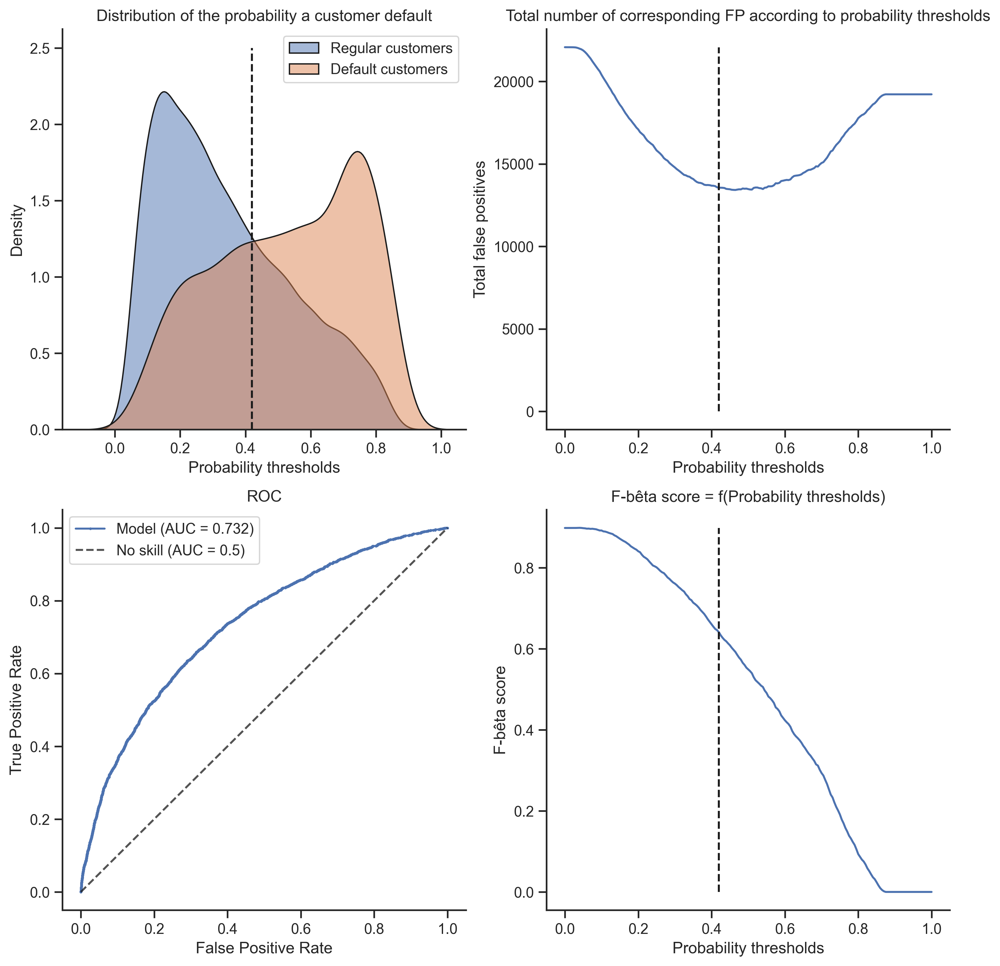


----------------------------------------------------------------------------------------------------

The new score is inferior to the one already saved.
Dataframe not saved.


,Models,yhat_train,yhat_test,Best_proba_threshold_train,Best_proba_threshold_test,Job_score_train,Job_score_test,AUROC_scores_train,AUROC_scores_test,F-bêta_score_train,F-bêta_score_test,Process_time_train (s),Process_time_test (s)
Model_labels,,,,,,,,,,,,,
dummy_clf,DummyClassifier(strategy='stratified'),"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, ...",0.000,0.0,0.535220,0.539438,0.506514,0.510236,0.091577,0.091748,0.118105,0.028026
logi_reg_opt,"LogisticRegression(C=100.0, class_weight='bala...","[0.5950216861017936, 0.5400718415302808, 0.430...","[0.34288296588972866, 0.4585440415379346, 0.56...",0.475,0.475,0.587815,0.581008,0.618610,0.601764,0.897919,0.897778,2.928672,0.345314
rf_clf_opt,"(DecisionTreeClassifier(max_depth=10, max_feat...","[0.5443689719737853, 0.6585302236646584, 0.177...","[0.42756610416750596, 0.5202812622906803, 0.13...",0.400,0.38,0.668959,0.640988,0.727212,0.696335,0.897898,0.901347,7.106856,1.94677
xgb_clf_opt,"XGBClassifier(base_score=None, booster=None, c...","[0.5688134, 0.62018585, 0.15535076, 0.42749348...","[0.3637119, 0.47850734, 0.07989965, 0.32197857...",0.475,0.465,0.684892,0.6625,0.741560,0.706817,0.898201,0.897944,3.163377,1.121018
lgbm_clf_opt,"LGBMClassifier(class_weight='balanced', colsam...","[0.6142795453522419, 0.6490163088635007, 0.246...","[0.5517143544597476, 0.38818625549996316, 0.16...",0.505,0.485,0.681817,0.651357,0.742423,0.702991,0.898531,0.898577,1.303183,0.516469
logi_reg_opt_dt_sp,"(MinMaxScaler(), SMOTE(k_neighbors=10, random_...","[0.6010609071046806, 0.6039352551291393, 0.115...","[0.09112835665798243, 0.5446520704704663, 0.30...",0.370,0.31,0.677604,0.65,0.734119,0.710206,0.898762,0.897778,4.625697,0.583532
wt_logi_reg_opt,"(MinMaxScaler(), LogisticRegression(C=0.1, cla...","[0.6512462417233318, 0.6626875538059055, 0.215...","[0.4661041263911844, 0.48343001608522007, 0.38...",0.495,0.51,0.680413,0.659302,0.742460,0.719538,0.898795,0.900108,3.182272,0.35556
wt_rf_clf_opt,"(MinMaxScaler(), SMOTE(k_neighbors=4, random_s...","[0.22779337291446336, 0.23599944893841715, 0.0...",NaN,0.155,NaN,0.668741,NaN,0.719419,NaN,0.897919,NaN,18.100912,NaN
wt_lgbm_clf_opt,"(MinMaxScaler(), LGBMClassifier(class_weight='...","[0.42106664903786667, 0.7378387650141042, 0.22...","[0.09226216071321515, 0.27391479648233213, 0.0...",0.445,0.205,0.682083,0.648643,0.735635,0.69377,0.898643,0.897861,1.788634,0.917834


CPU times: total: 38 s
Wall time: 15.8 s


In [569]:
%%time

# Initialize local variables.
#model_opt = lgbm_clf_opt
eval_dataset = 'valid_set'
get_csv_file = GET_CSV_FILE


# Train the model and get its predictions probabilities.
y_pred_proba_NP, process_time = model_fit_predict(model_pl_opt['model'])


print('sklearn cross val score =', np.mean(cross_val_score(model_pl_opt['model'], X_TRAIN, y_TRAIN, scoring='roc_auc', cv=SKF_5, n_jobs=-1)))

# Evaluate the model.
best_thr, g_norm, rocauc, fbeta = evaluate(y_pred_proba_NP[:,1], y_true=y_TRAIN)


# Store the relevant values in the model storage dataframe.
l_vars = [model_label, model_pl_opt['model'], y_pred_proba_NP[:,1], best_thr, g_norm, rocauc, fbeta, process_time]

# Update the csv file if the main score is higher and the user allowed it.
print("\n" + "-" * 100 + "\n")
df_MODELS = update_sum_table(df_MODELS, l_vars, get_csv_file, eval_dataset)
                        
# Show the table.
display(df_MODELS)

#### iii. Generalization over the test set

[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] learning_rate is set=0.1, eta=0.1 will be ignored. Current value: learning_rate=0.1
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] learning_rate is set=0.1, eta=0.1 will be ignored. Current value: learning_rate=0.1
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] learning_rate is set=0.1, eta=0.1 will be ignored. Current value: learning_rate=0.1
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] learning_rate is set=0.1, eta=0.1 will be ignored. Current value: learning_rate=0.1
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] learning_rate is set=0.1, eta=0.1 will be ignored. Current value: learning_rate=0.1

ROC-AUC = 0.693001
F-Bêta score of the optimal threshold found = 0.697
Highest F-Bêta score = 0.898
Job score: 0.642

----------------------------------------------------------------------------------------------------



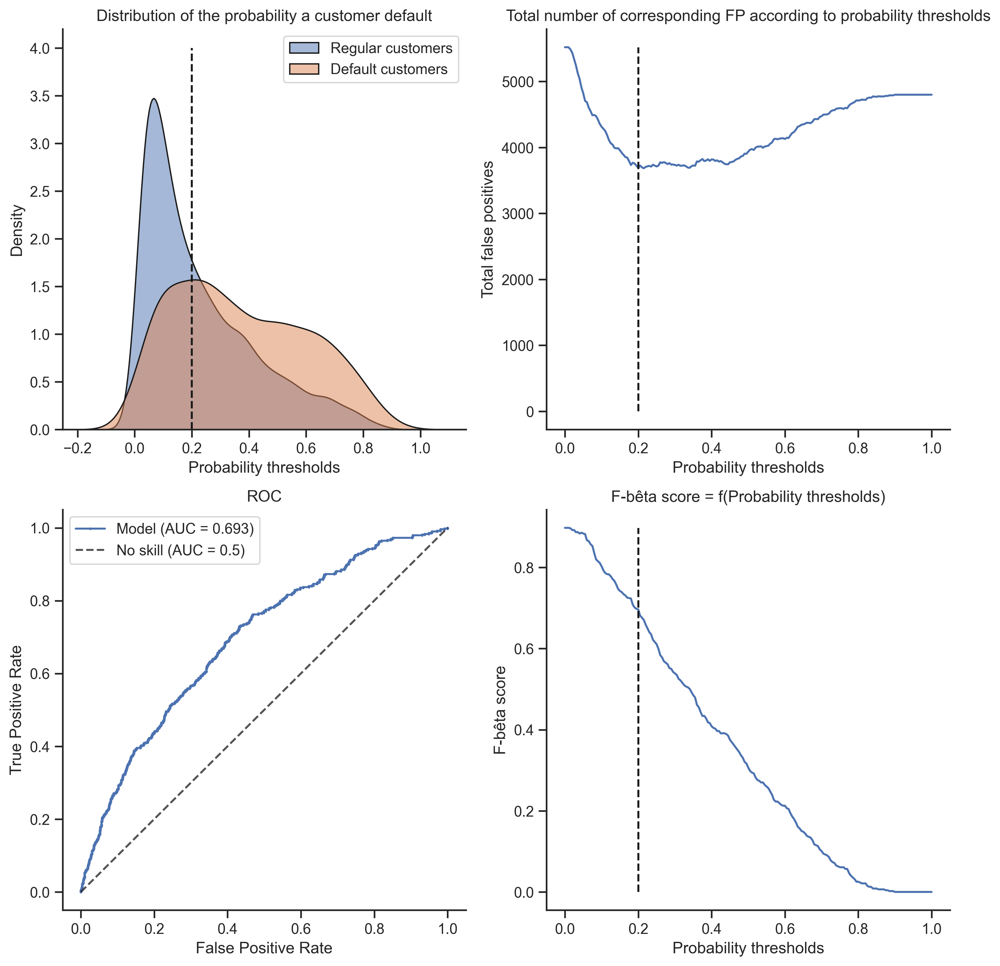


----------------------------------------------------------------------------------------------------

The new score is inferior to the one already saved.
Dataframe not saved.


,Models,yhat_train,yhat_test,Best_proba_threshold_train,Best_proba_threshold_test,Job_score_train,Job_score_test,AUROC_scores_train,AUROC_scores_test,F-bêta_score_train,F-bêta_score_test,Process_time_train (s),Process_time_test (s)
Model_labels,,,,,,,,,,,,,
dummy_clf,DummyClassifier(strategy='stratified'),"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, ...",0.000,0.0,0.535220,0.539438,0.506514,0.510236,0.091577,0.091748,0.118105,0.028026
logi_reg_opt,"LogisticRegression(C=100.0, class_weight='bala...","[0.5950216861017936, 0.5400718415302808, 0.430...","[0.34288296588972866, 0.4585440415379346, 0.56...",0.475,0.475,0.587815,0.581008,0.618610,0.601764,0.897919,0.897778,2.928672,0.345314
rf_clf_opt,"(DecisionTreeClassifier(max_depth=10, max_feat...","[0.5443689719737853, 0.6585302236646584, 0.177...","[0.42756610416750596, 0.5202812622906803, 0.13...",0.400,0.38,0.668959,0.640988,0.727212,0.696335,0.897898,0.901347,7.106856,1.94677
xgb_clf_opt,"XGBClassifier(base_score=None, booster=None, c...","[0.5688134, 0.62018585, 0.15535076, 0.42749348...","[0.3637119, 0.47850734, 0.07989965, 0.32197857...",0.475,0.465,0.684892,0.6625,0.741560,0.706817,0.898201,0.897944,3.163377,1.121018
lgbm_clf_opt,"LGBMClassifier(class_weight='balanced', colsam...","[0.6142795453522419, 0.6490163088635007, 0.246...","[0.5517143544597476, 0.38818625549996316, 0.16...",0.505,0.485,0.681817,0.651357,0.742423,0.702991,0.898531,0.898577,1.303183,0.516469
logi_reg_opt_dt_sp,"(MinMaxScaler(), SMOTE(k_neighbors=10, random_...","[0.6010609071046806, 0.6039352551291393, 0.115...","[0.09112835665798243, 0.5446520704704663, 0.30...",0.370,0.31,0.677604,0.65,0.734119,0.710206,0.898762,0.897778,4.625697,0.583532
wt_logi_reg_opt,"(MinMaxScaler(), LogisticRegression(C=0.1, cla...","[0.6512462417233318, 0.6626875538059055, 0.215...","[0.4661041263911844, 0.48343001608522007, 0.38...",0.495,0.51,0.680413,0.659302,0.742460,0.719538,0.898795,0.900108,3.182272,0.35556
wt_rf_clf_opt,"(MinMaxScaler(), SMOTE(k_neighbors=4, random_s...","[0.22779337291446336, 0.23599944893841715, 0.0...",NaN,0.155,NaN,0.668741,NaN,0.719419,NaN,0.897919,NaN,18.100912,NaN
wt_lgbm_clf_opt,"(MinMaxScaler(), LGBMClassifier(class_weight='...","[0.42106664903786667, 0.7378387650141042, 0.22...","[0.09226216071321515, 0.27391479648233213, 0.0...",0.445,0.205,0.682083,0.648643,0.735635,0.69377,0.898643,0.897861,1.788634,0.917834


CPU times: total: 17.9 s
Wall time: 3.84 s


In [570]:
%%time

# Initialize local variables.
#model_opt = lgbm_clf_opt
eval_dataset = 'test_set'
get_csv_file = GET_CSV_FILE


# Train the model and get its predictions probabilities.
y_pred_proba_NP, process_time = model_fit_predict(model_pl_opt['model'], X=X_TEST, y=y_TEST)


#print('sklearn score =', model.score(X_TEST, y_TEST, scoring='roc_auc', cv=SKF_5, n_jobs=-1))

# Evaluate the model.
best_thr, g_norm, rocauc, fbeta = evaluate(y_pred_proba_NP[:,1], y_true=y_TEST)


# Store the relevant values in the model storage dataframe.
l_vars = [model_label, model_pl_opt['model'], y_pred_proba_NP[:,1], best_thr, g_norm, rocauc, fbeta, process_time]

# Update the csv file if the main score is higher and the user allowed it.
print("\n" + "-" * 100 + "\n")
df_MODELS = update_sum_table(df_MODELS, l_vars, get_csv_file, eval_dataset)
                        
# Show the table.
display(df_MODELS)

### f) Models comparison

#### i. Functions

In [266]:
def figure_barplot (df, x_labels = 'Model_labels', y_label = 'Score', title = None):
    
    # Rearrange the df such as it fits the seaborn.barplot() data format.
    tidy = df.reset_index().melt(id_vars=x_labels, value_name=y_label, var_name='')
    
    # Plot the figure.
    ax = sns.barplot(data=tidy, y=x_labels, x=y_label, hue='', orient='h', edgecolor='k')
    
    plt.ylabel = ' '
    
    # Set the figure title.
    plt.title(title)
    
    #return ax

#### ii. Figures

*__- ROCs comparison__*

CPU times: total: 46.9 ms
Wall time: 56.1 ms


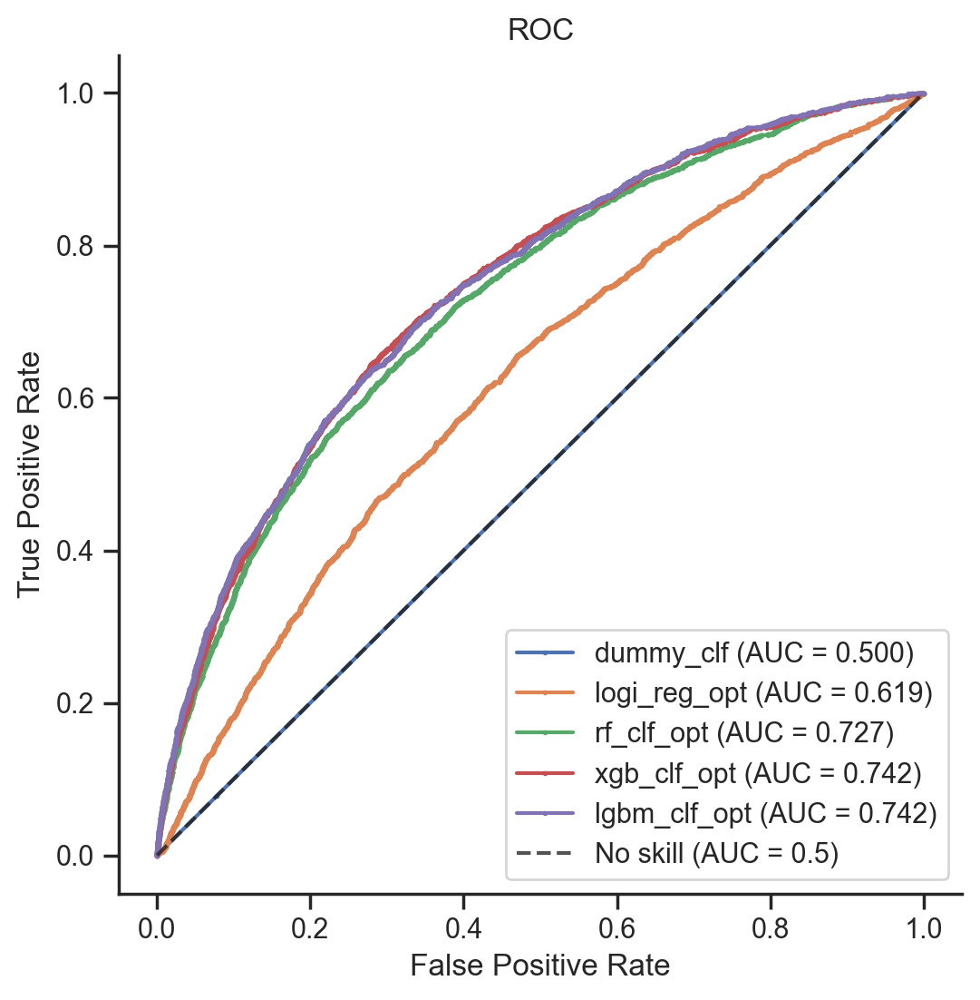

In [250]:
%%time

# Draw the ROCs.
figure_roc(y_TRAIN, df_MODELS['yhat_train'], df_MODELS.index)

*__- Scores and processing times comparisons__*

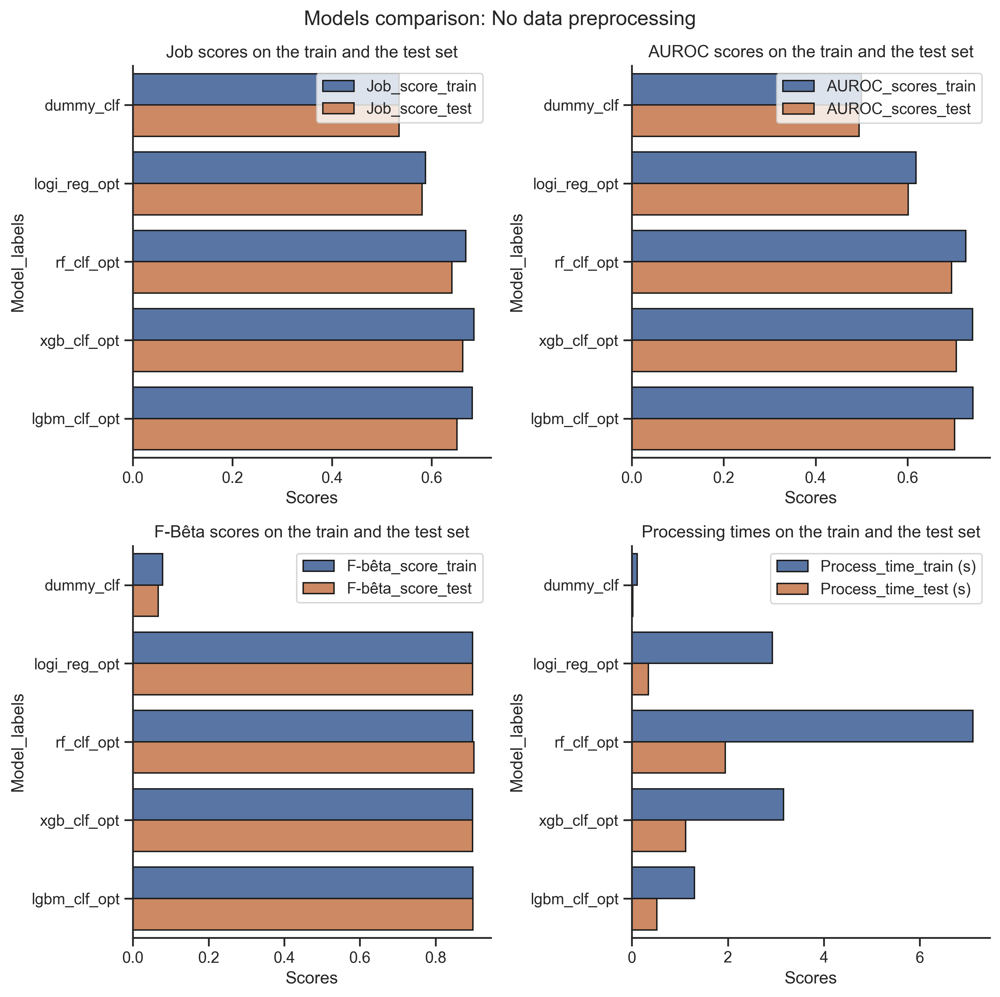

CPU times: total: 844 ms
Wall time: 839 ms


In [277]:
%%time

### Configuration ###

# Select the columns to compare.
l_features_peers = [
                    ['Job_score_train', 'Job_score_test'],
                    ['AUROC_scores_train', 'AUROC_scores_test'],
                    ['F-bêta_score_train', 'F-bêta_score_test'],
                    ['Process_time_train (s)', 'Process_time_test (s)']
                   ]

# Set each subplot titles.
l_subplot_titles = ["Job scores on the train and the test set",
                    "AUROC scores on the train and the test set",
                    "F-Bêta scores on the train and the test set",
                    "Processing times on the train and the test set"]

# Set the figure environment.
fig = plt.figure(figsize=(10,10), dpi=300)

# Set the whole figure title.
fig.suptitle("Models comparison: No data sampling")

# Initialize the subplot grid (2 lines x 2 columns).
l, c = int(len(l_features_peers) / 2), 2


### Plotting ###

# Run the loop to drw and position each subplot on the figure's subplot grid.
i = 0
for i in range(len(l_features_peers)):

    # Get the columns and the subplot title to plot.
    features_peer = l_features_peers[i]
    subplot_title = l_subplot_titles[i]
    
    # Set the position of the subplot.
    p = i + 1
    plt.subplot(l, c, p)
    
    # Plot the subplot.
    figure_barplot(df_MODELS[features_peer],
                   x_labels = 'Model_labels', y_label = 'Scores',
                   title = subplot_title)
    

### Drawing ###

# Arrange the subplots such as they are not superimposing each others. 
plt.tight_layout()

# Draw the figure.
plt.show()

# Interpretations

## Global

### LightGBM importance parameter

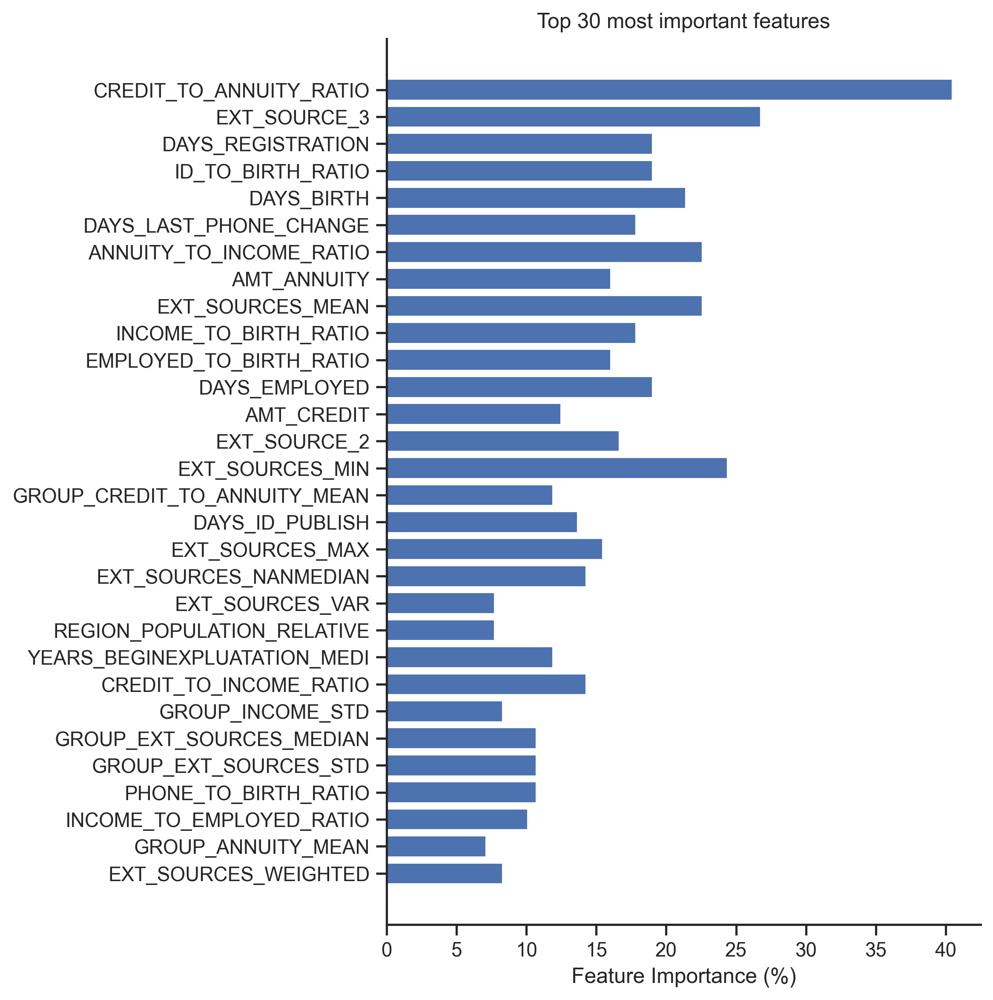

In [43]:
n_top_fts = 30

model_pl['model'].fit(X_TRAIN, y_TRAIN)

npa_top_fts = model_pl['model'].feature_importances_.argsort()#[-n_top_fts:]

plt.figure(figsize=(6,9), dpi=300)

plt.barh(X_TRAIN.columns[npa_top_fts[-n_top_fts:]], model_pl_opt['model'].\
         feature_importances_[npa_top_fts[-n_top_fts:]] / len(X_TRAIN.columns) * 100)

plt.xlabel("Feature Importance (%)")
plt.title("Top %i most important features" % n_top_fts)

plt.show()

### SHAP

- doc 1: https://shap.readthedocs.io/en/latest/example_notebooks/api_examples/plots/bar.html
- doc 2: https://shap-lrjball.readthedocs.io/en/latest/generated/shap.dependence_plot.html

*NB: More about Kernel Explainer and its requirements for big datasets that Tree explainer bypasses:* https://colab.research.google.com/drive/1pjPzsw_uZew-Zcz646JTkRDhF2GkPk0N#scrollTo=SCOJFGMj3fq5

#### Library importation

In [278]:
import copy

import shap
from scipy.special import expit # Importing the logit function for the base value transformation.

shap.initjs()

#### Functions

In [430]:
def logodd_to_odd (explanations, y_pred, cat_class):
    
    # Initialize the explanation objects which will store the transformed values.
    explanation = copy.deepcopy(explanations)
    explanations_transformed = copy.deepcopy(explanations)
    
    # Store the length of each client's shape values in logodd.
    len_values = len(explanations[0])
    
    # Transform values.
    for i in range(len(explanations.values)):

        # Reformat the explanation attributes to their normal format.
        explanation.values = explanations.values[i].reshape(1, len_values)
                       
        # Select the probability to untransform (Select the value corresponding to the selected category's class).
        base_value = explanation.base_values[i]

        # Compute the original_explanation_distance to construct the distance_coefficient later on.
        original_explanation_distance = np.sum(explanation.values, axis=1)#[cat_class]

        # Get the untransformed base value (Odd).
        base_value_trf = 1 - expit(base_value) # = 1 - 1 / (1 + np.exp(-transformed_base_value))

        # Compute the distance between the model_prediction and the untransformed base_value.
        distance_to_explain = y_pred[i][cat_class] - base_value_trf

        # The distance_coefficient is the ratio between both distances cat_class will be used later on.
        distance_coefficient = original_explanation_distance / distance_to_explain

        # Transform the original shapley values to the new scale (Odd scale).
        explanations_transformed.values[i] = explanation.values / distance_coefficient        
        
        # Finally reset the base_value as it does not need to be transformed.
        explanations_transformed.base_values[i] = base_value_trf       
        
    # Return the transformed array from the logodd to the odd scale.
    return explanations_transformed    

#### Shap explanation

- Different explainers: https://snyk.io/advisor/python/shap/functions/shap.explainers.explainer.Explainer
- Background data or not & feature_perturbation = "interventional" or "tree_path_dependent" ? https://github.com/slundberg/shap/issues/1098 <br>
=> Background data: Closer to the model. <br>

*NB: According to the model (classifier or regressor) and the presence or not of background data, some graphics (such as shap.plots.bar()) won't behave the same way and might not be usable (for the classifiers mainly). Ex: shap.plots.bar can replaced by shap.plot_bar but such graphics are less detailed (as it can be noticed in a couple of cells below).*

In [431]:
%%time

# Select the number of the most important features to keep.
top_ft = 10

# Select the categorical class to base the explanations on (ex: 0 or 1 for binaries).
cat_class = 0

# Get the pipeline to use.
model_pl_label = 'wt_lgbm_clf_opt'
model_pl = df_MODELS.loc[model_pl_label]['Models']

# Get the model and the scaler of the pipeline.
scaler = model_pl['scaler']
clf = model_pl['model']

# Scale the train and the test set to fit the model pipeline inputs format.
X_train_norm = scaler.transform(X_TRAIN)
#X_test_norm = scaler.transform(X_TEST)
X_test_norm = pd.DataFrame(X_test_norm, columns=X_TEST.columns)
#X_test_norm_mean = pd.DataFrame(X_test_norm.mean(axis=0).reshape(1, X_TEST.shape[1]), columns=X_TEST.columns)


# Get a sample of the scaled train set to accelerate the training process.
# 1. Sampling for KernelExplainer():
#X_train_norm_sp = shap.sample(X_train_norm, 100, random_state=None) # use 600 samples of train data as background data
#X_test_norm_sp = shap.sample(X_test_norm, 5, random_state=None)

t0 = time()

# Create the explainer.
# 1. Config for KernelExplainer:
#explainer= shap.KernelExplainer(clf.predict_proba, X_train_norm_sp)

# 2. Config for TreeExplainer():
explainer_shap = shap.TreeExplainer(clf, X_train_norm)#, model_output="probability")

# Get the shapley values.
# 1. Config for KernelExplainer:
#explanations = explainer_shap.explanations(X_test_norm_sp, l1_reg='aic')

# 2. Config for TreeExplainer:
# NB: Get shap values only: explanations = explainer_shap.explanations(X_test_norm)
explanations = explainer_shap(X_test_norm, check_additivity=False)

delta_t = time() - t0

# Transform log odd values to odd (easier to understand for clients and staffs).
yhat = clf.predict_proba(X_test_norm)
explanations_transformed = logodd_to_odd(explanations, yhat, cat_class)


# Summarize relevant values.
print("Model used:\n", clf)
print()
print("Model mean prediction probabilities on test data:", yhat.mean(axis=0))
print()
N_proba_mean = 1 - clf.predict(X_train_norm).mean(axis=0)
print("Model mean proportions of negative predictions (=> Ratio of accepted applications):", N_proba_mean)
N_shap_proba_mean = explanations_transformed.base_values.mean(axis=0)
print("SHAP expected mean proportions of negative predictions:", N_shap_proba_mean) #explainer_shap.expected_value
print("SHAP explanation reliability index =", 1 - abs(N_shap_proba_mean - N_proba_mean))
print()
print("SHAP explainer run time:", round(delta_t, 2), "s")
print()

Model used:
 LGBMClassifier(class_weight='balanced', colsample_bytree=0.9, eta=0.1,
               gamma=0.1, max_depth=40, min_child_weight=3, n_estimators=42,
               objective='binary', random_state=0, subsample=0.5)

Model mean prediction probabilities on test data: [0.63190974 0.36809026]

Model mean proportions of negative predictions (=> Ratio of accepted applications): 0.72982207591983
SHAP expected mean proportions of negative predictions: 0.6862082869990987
SHAP explanation reliability index = 0.9563862110792688

SHAP explainer run time: 8.52 s

CPU times: total: 10.5 s
Wall time: 8.7 s


#### Interpretations

__- Mean absolute shapley values__

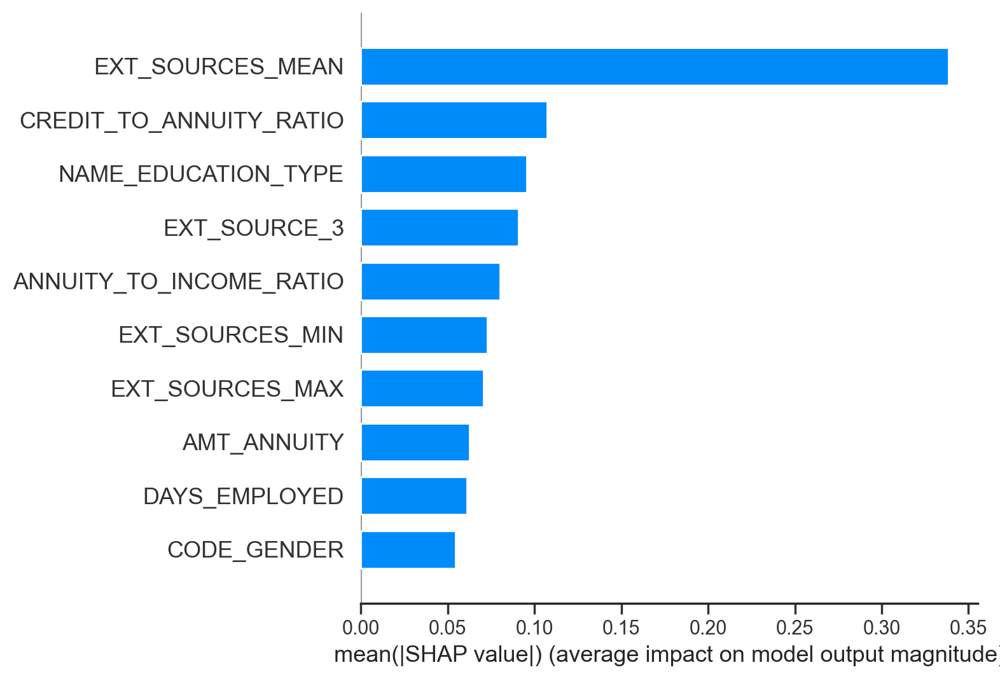

In [432]:
# Method 1:
shap.summary_plot(explanations, max_display=top_ft, plot_type='bar') #feature_names=X_TEST.columns,

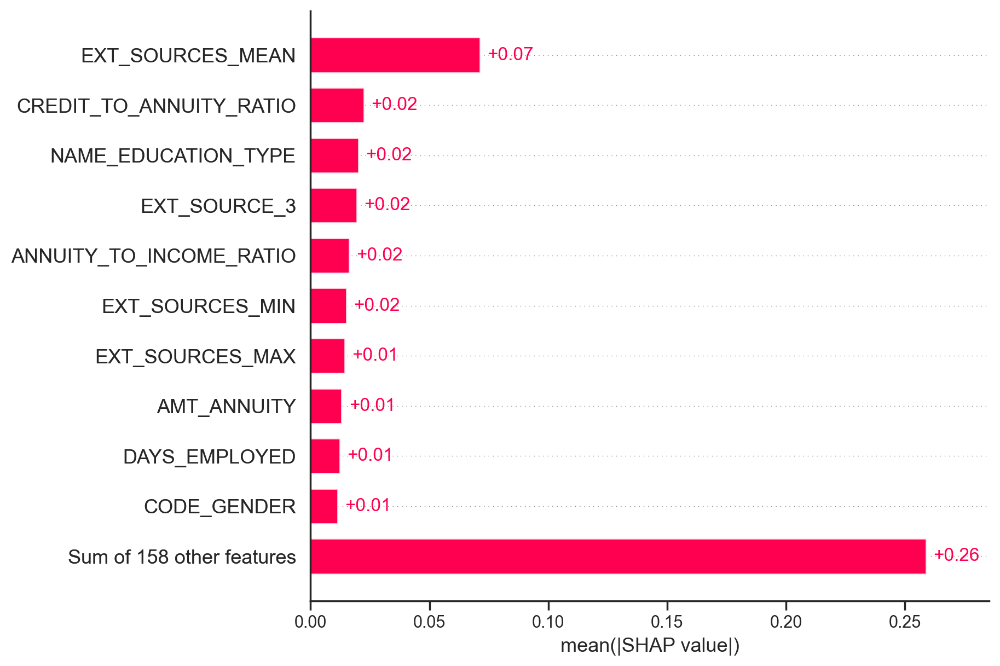

In [433]:
# Method 2 (with the absolute mean shapley values displayed):
# NB: As no feature_names parameter is present X_test_norm are reassociated with them in a df.
shap.plots.bar(explanations_transformed, max_display=top_ft+1)

In [423]:
# Method 3 (with the shapley values as text):
# Source: https://towardsdatascience.com/using-shap-values-to-explain-how-your-machine-learning-model-works-732b3f40e137

from scipy.special import softmax

def print_feature_importances_shap_values(shap_values, features):
    '''
    Prints the feature importances based on SHAP values in an ordered way
    shap_values -> The SHAP values calculated from a shap.Explainer object
    features -> The name of the features, on the order presented to the explainer
    '''
    # Calculates the feature importance (mean absolute shap value) for each feature
    importances = []
    for i in range(shap_values.values.shape[1]):
        importances.append(np.mean(np.abs(shap_values.values[:, i])))
    # Calculates the normalized version
    importances_norm = softmax(importances)
    # Organize the importances and columns in a dictionary
    feature_importances = {fea: imp for imp, fea in zip(importances, features)}
    feature_importances_norm = {fea: imp for imp, fea in zip(importances_norm, features)}
    # Sorts the dictionary
    feature_importances = {k: v for k, v in sorted(feature_importances.items(), key=lambda item: item[1], reverse = True)}
    feature_importances_norm= {k: v for k, v in sorted(feature_importances_norm.items(), key=lambda item: item[1], reverse = True)}
    # Prints the feature importances
    for k, v in feature_importances.items():
        print(f"{k} -> {v:.4f} (softmax = {feature_importances_norm[k]:.4f})")
        
print_feature_importances_shap_values(explanations, X_TEST.columns)

EXT_SOURCES_MEAN -> 0.3384 (softmax = 0.0082)
CREDIT_TO_ANNUITY_RATIO -> 0.1071 (softmax = 0.0065)
NAME_EDUCATION_TYPE -> 0.0954 (softmax = 0.0065)
EXT_SOURCE_3 -> 0.0908 (softmax = 0.0064)
ANNUITY_TO_INCOME_RATIO -> 0.0802 (softmax = 0.0064)
EXT_SOURCES_MIN -> 0.0729 (softmax = 0.0063)
EXT_SOURCES_MAX -> 0.0707 (softmax = 0.0063)
AMT_ANNUITY -> 0.0626 (softmax = 0.0062)
DAYS_EMPLOYED -> 0.0611 (softmax = 0.0062)
CODE_GENDER -> 0.0543 (softmax = 0.0062)
DAYS_BIRTH -> 0.0531 (softmax = 0.0062)
EXT_SOURCES_PROD -> 0.0503 (softmax = 0.0062)
DAYS_REGISTRATION -> 0.0482 (softmax = 0.0062)
INCOME_TO_BIRTH_RATIO -> 0.0442 (softmax = 0.0061)
EXT_SOURCES_WEIGHTED -> 0.0430 (softmax = 0.0061)
NEW_DOC_KURT -> 0.0427 (softmax = 0.0061)
EXT_SOURCES_NANMEDIAN -> 0.0427 (softmax = 0.0061)
EMPLOYED_TO_BIRTH_RATIO -> 0.0426 (softmax = 0.0061)
CAR_TO_EMPLOYED_RATIO -> 0.0359 (softmax = 0.0061)
DAYS_LAST_PHONE_CHANGE -> 0.0343 (softmax = 0.0061)
EXT_SOURCE_2 -> 0.0320 (softmax = 0.0061)
CAR_TO_BIRTH_RATI

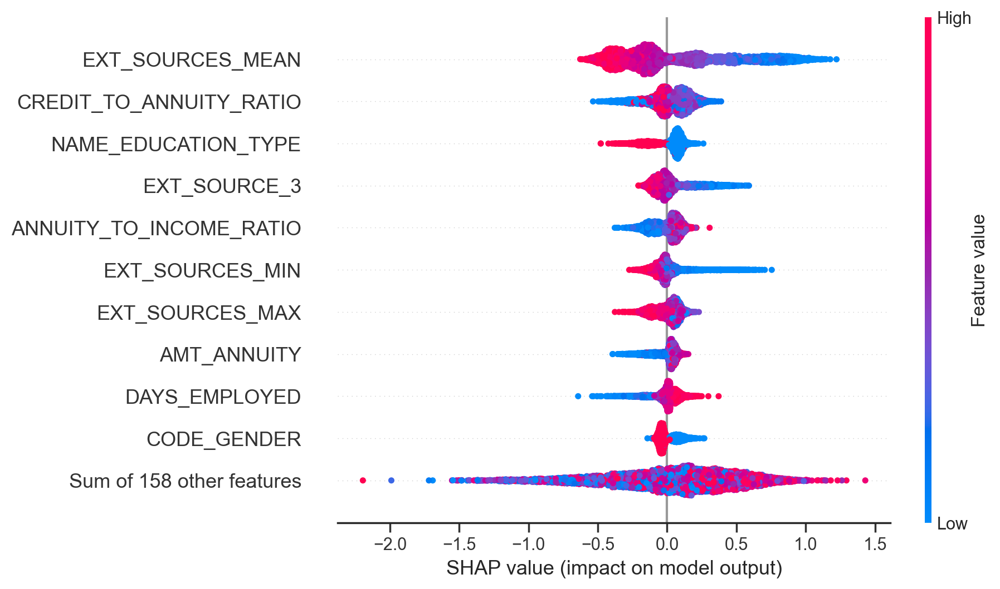

In [429]:
# Method 4 (Beeswarm):
# NB: Equivalent plot: shap.summary_plot(explanations, X_test_norm, feature_names=X_TEST.columns, max_display=top_ft, plot_type='dot')
shap.plots.beeswarm(explanations, max_display=top_ft+1)

__- Features' influences and dependences__

In [ ]:
# Detail features influences on predictions.
shap.dependence_plot('EXT_SOURCE_3', shap_values.values, X_test_norm, interaction_index='EXT_SOURCES_MEAN') #feature_names=X_TEST.columns

## Local

### Shap

#### Shap explanation

In [434]:
# Select the number of the most important features to keep.
top_ft = 10

# Select the client.
client_idx = 0

# Select the categorical class to base the explanations on (ex: 0 or 1 for binaries).
cat_class = 0

# Get the pipeline to use.
model_pl_label = 'wt_lgbm_clf_opt'
model_pl = df_MODELS.loc[model_pl_label]['Models']

# Get the model and the scaler of the pipeline.
scaler = model_pl['scaler']
clf = model_pl['model']

# Scale the train and the test set to fit the model pipeline inputs format.
X_train_norm = scaler.transform(X_TRAIN)
X_test_norm = scaler.transform(X_TEST) 

# Get a sample of the scaled train set to accelerate the training process.
# 1. Sampling for KernelExplainer():
#X_train_norm_sp = shap.sample(X_train_norm, 100, random_state=None) # use 600 samples of train data as background data
#X_test_norm_sp = shap.sample(X_test_norm, 5, random_state=None)

# 2. Sampling for TreeExplainer():
X_test_norm_sp = pd.DataFrame(X_test_norm[client_idx].reshape(1,-1), columns=X_TEST.columns)

t0 = time()

# Create the explainer model (simplified .
# 1. Config for KernelExplainer:
#explainer_shap = shap.KernelExplainer(clf.predict_proba, X_train_norm_sp)

# 2. Config for TreeExplainer():
explainer_shap = shap.TreeExplainer(clf, X_train_norm)#, X_train_norm, model_output='probability')


# Get explanations
#explanations = explainer_shap(pd.DataFrame(X_test_norm_sp, columns=X_TEST.columns))
explanations = explainer_shap(X_test_norm_sp)


# Get the shapley values.
# 1. Config for KernelExplainer:
#shap_values = explainer_shap.shap_values(X_test_norm_sp, l1_reg='aic')

# 2. Config for TreeExplainer:
# NB: Get shap values only: shap_values = explainer_shap.shap_values(X_test_norm)
shap_values = explainer_shap.shap_values(X_test_norm_sp) #explainer_shap.shap_values(X_test_norm_sp) #explainer_shap.shap_values(X_test_norm_sp)

delta_t = time() - t0

# Transform log odd values to odd (easier to understand for clients and staffs).
yhat = clf.predict_proba(X_test_norm)
explanations_transformed = logodd_to_odd(explanations, yhat, cat_class)


# Summarize relevant values.
print("Model used:\n", clf)
print()
print("Model mean prediction probabilities on test data:", yhat.mean(axis=0))
print()
N_proba_mean = 1 - clf.predict(X_train_norm).mean(axis=0)
print("Model mean proportions of negative predictions (=> Ratio of accepted applications):", N_proba_mean)
N_shap_proba_mean = explanations_transformed.base_values.mean(axis=0)
print("SHAP expected mean proportions of negative predictions:", N_shap_proba_mean) #explainer_shap.expected_value
print("SHAP explanation reliability index =", 1 - abs(N_shap_proba_mean - N_proba_mean))
print()
print("Model prediction probabilities for the tested data:", clf.predict_proba(X_test_norm_sp)[0])
print()
print("SHAP explainer run time:", round(delta_t, 2), "s")
print()

Model used:
 LGBMClassifier(class_weight='balanced', colsample_bytree=0.9, eta=0.1,
               gamma=0.1, max_depth=40, min_child_weight=3, n_estimators=42,
               objective='binary', random_state=0, subsample=0.5)

Model mean prediction probabilities on test data: [0.63190974 0.36809026]

Model mean proportions of negative predictions (=> Ratio of accepted applications): 0.72982207591983
SHAP expected mean proportions of negative predictions: 0.6862082869990985
SHAP explanation reliability index = 0.9563862110792686

Model prediction probabilities for the tested data: [0.50458686 0.49541314]

SHAP explainer run time: 0.04 s



#### Interpretations

__- Mean absolute shapley values__

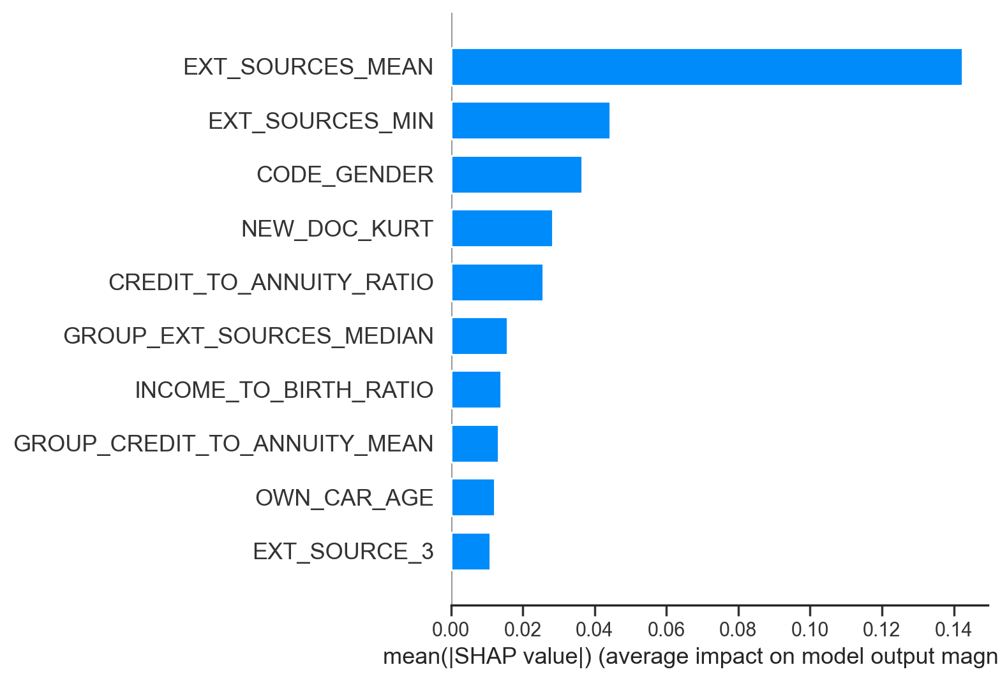

In [435]:
# Method 1:
shap.summary_plot(explanations_transformed, max_display=top_ft, plot_type='bar') #feature_names=X_TEST.columns,

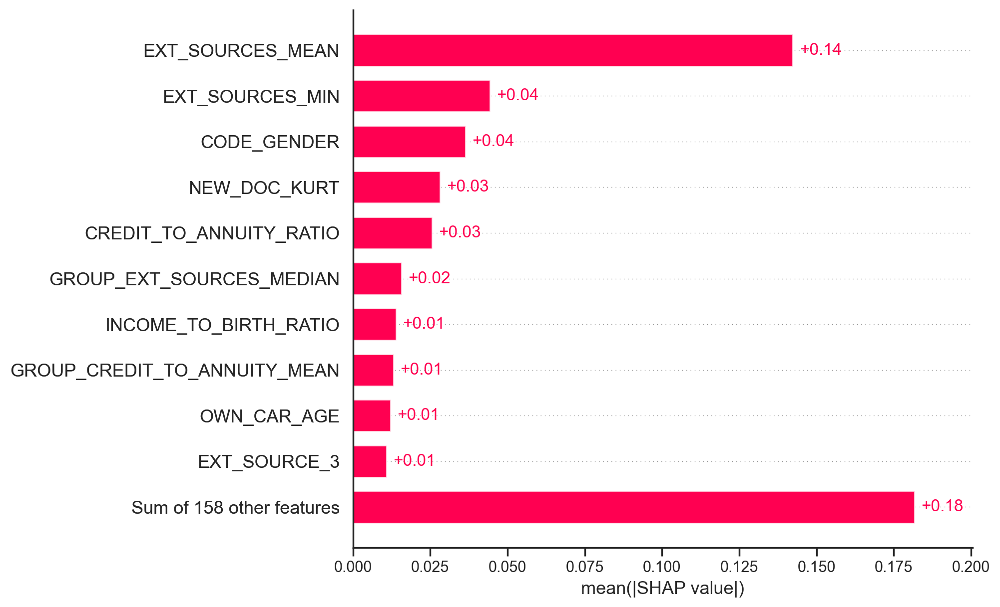

In [436]:
# Method 2 (with the absolute mean shapley values displayed):
# NB: As no feature_names parameter is present X_test_norm are reassociated with them in a df.
shap.plots.bar(explanations_transformed, max_display=top_ft+1)

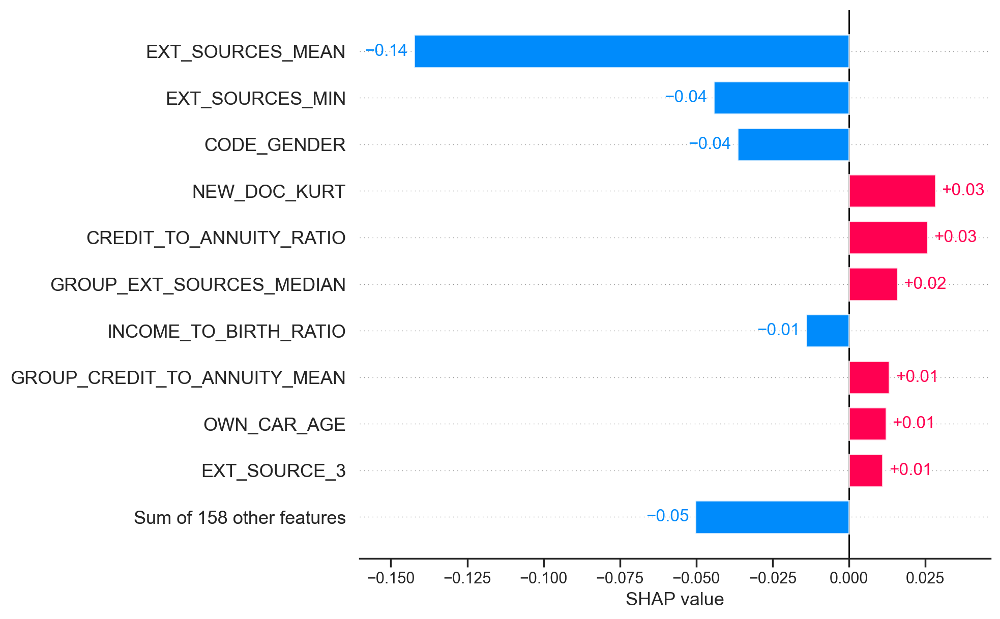

In [437]:
# Method 3 (with the mean shapley values displayed):
# NB: As no feature_names parameter is present X_test_norm are reassociated with them in a df.
shap.plots.bar(explanations_transformed[0], max_display=top_ft+1)

__- Force plots__

In [470]:
### Shape 1: Condensed ###

# NB1: f(x) scale coorresponds to the log odd (=> It shoud be <= 0 for positive ).
#      => In order to get the corresponding probability P = 10^(log odd value).
# NB2: .force_plot() seems to be the same as .plots.force().
#shap.plots.force(explainer_shap.expected_value[1], explanations[1], X_test_norm_sp, feature_names=X_TEST.columns)
shap.plots.force(explanations_transformed, X_test_norm_sp, feature_names=X_TEST.columns)

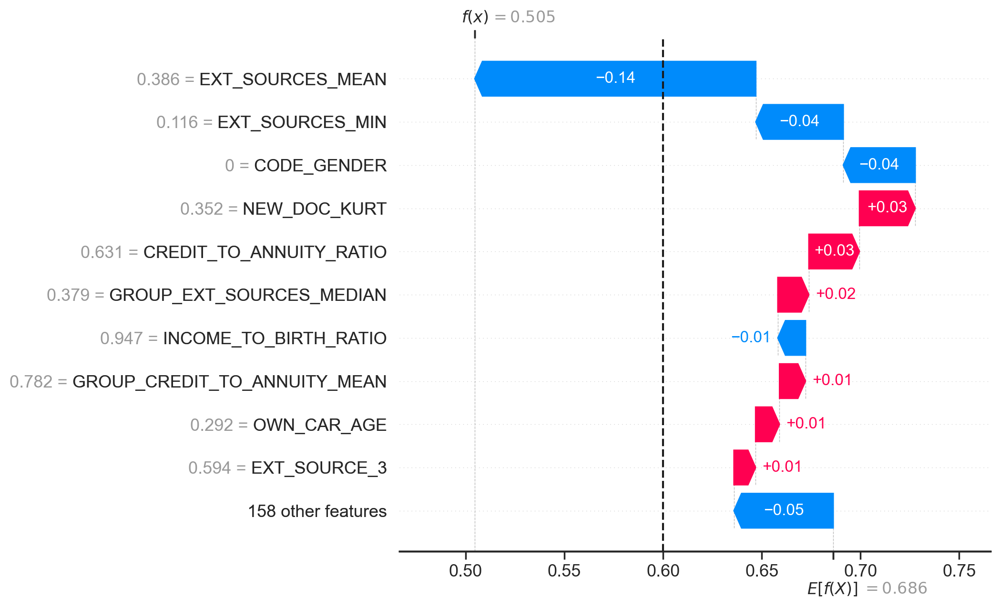

In [478]:
### Shape 2: Detailed ###

# Transform the log odds default model values to their odd counterpart which
# is an easier scale to interpret for none professional people.
# NB: The argument "show=False" allows to not display the graph immediately in order to allows further customization with
#     matplotlib or seaborn or other... before displaying the graph with a "plt.show()".
shap_values_transformed = logodd_to_odd(explanations, yhat, cat_class)
shap.plots.waterfall(explanations_transformed[cat_class], top_ft+1, show=False)  
plt.axvline(x=0.6, color='k', linestyle='--')
#plt.xticks()
plt.show()

### Dashboard: streamlit

In [521]:
#from pathlib import Path
#import pandas as pd
import streamlit as st
from streamlit_jupyter import StreamlitPatcher, tqdm

import streamlit.components.v1 as components

StreamlitPatcher().jupyter()  # register streamlit with jupyter-compatible wrappers

In [485]:
df_test_w_ids

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,...,LAST_LOAN_PAID_OVER_AMOUNT_sum,LAST_LOAN_PAID_OVER_AMOUNT_mean,LAST_LOAN_PAID_OVER_AMOUNT_max,LAST_LOAN_PAID_OVER_AMOUNT_min,LAST_LOAN_PAID_OVER_count,LAST_LOAN_PAID_OVER_mean,PAYMENT_MIN_TO_ANNUITY_RATIO,PAYMENT_MAX_TO_ANNUITY_RATIO,PAYMENT_MEAN_TO_ANNUITY_RATIO,TARGET
0,118464.0,0.0,0.0,1.0,157500.0,927000.0,29466.0,927000.0,0.0,2.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.304443,0.398682,0.362427,1.0
1,126006.0,0.0,1.0,0.0,90000.0,325908.0,16767.0,247500.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.304443,0.398682,0.362427,0.0
2,127688.0,0.0,0.0,0.0,67500.0,152820.0,15241.5,135000.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.304443,0.398682,0.362427,0.0
3,132968.0,0.0,1.0,0.0,103500.0,128092.5,11875.5,103500.0,0.0,2.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.011017,0.011017,0.011017,0.0
4,118485.0,0.0,0.0,0.0,360000.0,450000.0,23107.5,450000.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.304443,0.398682,0.362427,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5995,133526.0,0.0,1.0,0.0,72000.0,545040.0,25537.5,450000.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.304443,0.398682,0.362427,1.0
5996,124209.0,0.0,0.0,1.0,225000.0,685012.5,35104.5,553500.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.304443,0.398682,0.362427,0.0
5997,125755.0,0.0,1.0,0.0,180000.0,1339884.0,36846.0,1170000.0,1.0,2.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.304443,0.398682,0.362427,0.0
5998,119563.0,0.0,1.0,0.0,135000.0,314100.0,11767.5,225000.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.304443,0.398682,0.362427,0.0


In [ ]:
st.dataframe(data=None, width=None, height=None, *, use_container_width=False)

In [ ]:
#####################################
### Dossiers de crédit similaires ###
#####################################

test_features_nn = test_features_with_id
test_features_nn.reset_index(drop=True, inplace=True)

credit_cur = test_features_nn[test_features_nn['SK_ID_CURR'] == str(credit_id_default_test)+'_'].iloc[0:1,1:]

scoring_multi_nn = nn_credit_test.kneighbors(credit_cur, 15, return_distance=False)
best_nn = pd.DataFrame(scoring_multi_nn)

gap_0 = 5

best_nn_ = best_nn.iloc[0:1,gap_0-4:gap_0].T
best_nn_ = best_nn_.set_index([0]).merge(test_features_nn, left_index=True, right_index=True)
scoring_multi_nn = best_nn_.merge(scoring_test, left_on='SK_ID_CURR', right_on='SK_ID_CURR')[['SK_ID_CURR','_P','_Pred','_True']]

##################################################
### Dossiers de crédit similaires - base score ###
##################################################

current_P = scoring_test[scoring_test['SK_ID_CURR'] == str(credit_id_default_test)+'_'][['_P']].iloc[0,0]
gap_1 = current_P * gap_0 / 100
scoring_multi = scoring_test[((scoring_test['_P'] > (current_P - gap_1))
                              & (scoring_test['_P'] < current_P))|((scoring_test['_P'] < (current_P + gap_1))
                                                                    & (scoring_test['_P'] > current_P))].sort_values('_P')

scoring_multi = pd.concat([scoring_multi.head(2),scoring_multi.tail(2)])
del scoring_multi['_N']

#############################################
### Choix du modèle de crédits similaires ###
#############################################

scoring_multi_ = scoring_multi

feat_val_per_cust_multi = scoring_multi_.merge(test_features_with_id, left_on='SK_ID_CURR',
                                              right_on='SK_ID_CURR').sort_values('_P')

feat_val_per_cust_multi.sort_index(inplace=True)
feat_val_per_cust_multi = feat_val_per_cust_multi.T

feat_val_per_cust_cur = test_features_with_id[test_features_with_id['SK_ID_CURR'] == str(credit_id_default_test)+'_']
feat_val_per_cust_cur = scoring_test.merge(feat_val_per_cust_cur, left_on='SK_ID_CURR',
                                              right_on='SK_ID_CURR').sort_values('_P')

feat_val_per_cust_cur = feat_val_per_cust_cur.T

feat_val_per_cust_multi = feat_val_per_cust_cur.merge(feat_val_per_cust_multi, left_index=True, right_index=True, how = 'right')
feat_val_per_cust_multi.reset_index(inplace=True)

tab_labels = ['Variable', 'Courant', 'Réf. 1', 'Réf. 2', 'Réf. 3', 'Réf. 4', 'Importance']
feat_imp.columns = ['index','importance']

# On fusionne les variables importantes avec les variables du dossier de crédit
feat_val_per_cust_2_2 = feat_val_per_cust_multi.merge(feat_imp,
                                                      left_on='index',
                                                      right_on='index',
                                                      how='left')

feat_val_per_cust_2_2 = round(feat_val_per_cust_2_2,2)
feat_val_per_cust_2_2.columns = tab_labels

In [503]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Indicator(
    value = 200,
    delta = {'reference': 160},
    gauge = {
        'axis': {'visible': False}},
    domain = {'row': 0, 'column': 0}))

fig.add_trace(go.Indicator(
    value = 120,
    gauge = {
        'shape': "bullet",
        'axis' : {'visible': False}},
    domain = {'x': [0.05, 0.5], 'y': [0.15, 0.35]}))

fig.add_trace(go.Indicator(
    mode = "number+delta",
    value = 300,
    domain = {'row': 0, 'column': 1}))

fig.add_trace(go.Indicator(
    mode = "delta",
    value = 40,
    domain = {'row': 1, 'column': 1}))

fig.update_layout(
    grid = {'rows': 2, 'columns': 2, 'pattern': "independent"},
    template = {'data' : {'indicator': [{
        'title': {'text': "Speed"},
        'mode' : "number+delta+gauge",
        'delta' : {'reference': 90}}]
                         }})

In [ ]:

    
    #############
    ### Jauge ###
    #############
    
    if input_value_str == best_record_['SK_ID_CURR'].iloc[0]:
        proba_ = pd.DataFrame(yp).iloc[1,0]
        proba_worst_ = pd.DataFrame(yp).iloc[0,0]
    
    elif input_value_str == worst_record_['SK_ID_CURR'].iloc[0]:
        proba_ = pd.DataFrame(yp).iloc[0,0]
        proba_worst_ = pd.DataFrame(yp).iloc[0,0]
        
    else:
        proba_ = pd.DataFrame(yp).iloc[1,0]
        proba_worst_ = pd.DataFrame(yp).iloc[0,0]

    fig_gauge = go.Figure(go.Indicator(
        mode = "gauge+number+delta",
        value = proba_,
#         title = {'text': "Risque d'insolvabilité", 'font': {'size': 11}},
        delta = {'reference': thr_ch, 'increasing': {'color': "Red"}, 'decreasing': {'color': "Green"}},
        gauge = {
            'axis': {'range': [0, 1], 'tickwidth': 1, 'tickcolor': "darkblue"},
            'bar': {'color': 'rgba(255, 255, 255, 0.6)'},
            'bgcolor': "white",
            'borderwidth': 2,
            'bordercolor': "gray",
            'steps': [
                {'range': [0, thr_ch], 'color': 'rgba(0, 153, 51, 0.8)'},
                {'range': [thr_ch, 1], 'color': 'rgba(255, 51, 0, 0.8)'}],
            'threshold': {
                'line': {'color': "white", 'width': 1},
                'thickness': 1,
                'value': proba_worst_}}))

    fig_gauge.update_layout(paper_bgcolor = "lightgrey",
                            autosize=True,
                            height=150,
                            margin=dict(l=30, r=30, t=20, b=20),
                            font = {'color': "grey", 'family': "Arial"})

    return fig_scoring, fig_gauge

In [ ]:
fig_scoring = go.Figure()
    
    fig_scoring.add_trace(go.Bar(
        y=credit,
        x=yp,
        name='_P',
        orientation='h',
        text=yp,
        textposition='inside',
        marker=dict(
                color='rgba(255, 51, 0, 0.8)',
                line=dict(color='lightgrey', width=1)
        )
    ))
    
    fig_scoring.add_trace(go.Bar(
        y=credit,
        x=yn,
        name='_N',
        orientation='h',
        text=yn,
        textposition='inside',
        marker=dict(
            color='rgba(0, 153, 51, 0.8)',
            line=dict(color='lightgrey', width=1)
        )
    ))

    fig_scoring.update_layout(
        xaxis=dict(
            showgrid=False,
            showline=False,
            showticklabels=True,
            zeroline=False
        ),
        yaxis=dict(
            showgrid=False,
            showline=False,
            showticklabels=True,
            zeroline=False,
        ),
        barmode='stack',
                      margin=dict(l=20, r=20, t=20, b=20),
                      autosize=True,
                      height=125,
                      plot_bgcolor=colors['background_2'],
                      paper_bgcolor=colors['background_2'],
                     )  

    fig_scoring.update_layout(transition_duration=500)

In [507]:
import plotly.graph_objects as go

fig = go.Figure(go.Indicator(
    mode = "gauge+number",
    value = 450,
    #title = {'text': "Speed"},
    domain = {'x': [0, 1], 'y': [0, 1]}
))

fig.show()

In [ ]:
col1, col2, col3 = st.columns(3)

with col1:
   st.header("A cat")
   st.image("https://static.streamlit.io/examples/cat.jpg")

with col2:
   st.header("A dog")
   st.image("https://static.streamlit.io/examples/dog.jpg")

with col3:
   st.header("An owl")
   st.image("https://static.streamlit.io/examples/owl.jpg")

In [522]:
@st.cache
def load_data():
    df = pd.read_csv(os.path.join(IMPORTS_DIR_PATH, 'preprocessed_data_test.csv'))
    return df

def st_shap(shap_plot, height=10):
    shap_html = f"<head>{shap.getjs()}</head><body>{shap_plot.html()}</body>"
    components.html(shap_html, height=height)


def shap_plot_waterfall ():
    shap_values_transformed = logodd_to_odd(explanations, yhat, cat_class)
    fig = shap.plots.waterfall(explanations_transformed[cat_class], top_ft+1, show=False)  
    fig.axvline(x=0.6, color='k', linestyle='--')
    #plt.xticks()
    st.show(fig)
    #plt.show()
    
df = load_data()
    
selected_customer_id = st.selectbox("Customer ID", df['SK_ID_CURR'])#, index=0, format_func=special_internal_function, key=None, help=None, on_change=None, args=None, kwargs=None, *, disabled=False, label_visibility="visible")


col1, col2 = st.columns(2)

with col1:
    st.header("Gauge")
    st.slider("Threshold", 0.0, 1.0, 0.5, 0.01)#, min_value=None, max_value=None, value=None, step=None, format=None, key=None, help=None, on_change=None, args=None, kwargs=None, *, disabled=False, label_visibility="visible")


#name = st.text_input("CouCou")

# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
#st_shap(shap.plots.bar(explanations_transformed, max_display=top_ft+1))
st.write(shap.plots.force(explanations_transformed, X_test_norm_sp, feature_names=X_TEST.columns))


col1, col2 = st.columns(2)


with col1:
    st.header("Absolute SHAP values")
    st.write(shap.plots.bar(explanations_transformed, max_display=top_ft+1))

with col2:
    st.header("Detailed force plot")
    st.write(shap_plot_waterfall())

    
st.dataframe(df[df['SK_ID_CURR'] == selected_customer_id])

TypeError: 'NoneType' object is not subscriptable

In [519]:
streamlit run "D:\0Partage\MP-P2PNet\MP-Sync\MP-Sync_Pro\Info\OC_DS\Projet 7\GitRepo\api\streamlit\app.py"

SyntaxError: invalid syntax (253668811.py, line 1)

In [ ]:
STOP

In [757]:

for i, idx in enumerate(range(len(clf.predict_proba(X_test_norm)))):
    #print(clf.predict_proba(X_test_norm)[0])
    if clf.predict_proba(X_test_norm)[i][0] < 0.3:
        print(idx, clf.predict_proba(X_test_norm)[i])

4 [0.24838616 0.75161384]
27 [0.15925108 0.84074892]
31 [0.28157465 0.71842535]
36 [0.17474485 0.82525515]
41 [0.22770169 0.77229831]
43 [0.21133615 0.78866385]
48 [0.23330285 0.76669715]
52 [0.25163784 0.74836216]
56 [0.28031153 0.71968847]
72 [0.18341804 0.81658196]
96 [0.25613869 0.74386131]
107 [0.29364379 0.70635621]
125 [0.19839486 0.80160514]
136 [0.18949059 0.81050941]
143 [0.20684787 0.79315213]
146 [0.26616558 0.73383442]
147 [0.16382654 0.83617346]
156 [0.1577616 0.8422384]
164 [0.14152907 0.85847093]
166 [0.27528052 0.72471948]
178 [0.29726706 0.70273294]
229 [0.29018639 0.70981361]
246 [0.14837865 0.85162135]
255 [0.2941958 0.7058042]
261 [0.16667094 0.83332906]
265 [0.235508 0.764492]
272 [0.22857441 0.77142559]
276 [0.23626444 0.76373556]
303 [0.19719318 0.80280682]
330 [0.23564361 0.76435639]
331 [0.1858621 0.8141379]
338 [0.20513848 0.79486152]
343 [0.18603385 0.81396615]
361 [0.18176439 0.81823561]
362 [0.20005514 0.79994486]
373 [0.18933463 0.81066537]
385 [0.2362841

KeyboardInterrupt: 

### LIME

LIME (Local Interpretable Model-Agnostic Explanations) is a python library for local interpretations.<br>
LIME doc: https://lime-ml.readthedocs.io/en/latest/lime.html

*NB: show_in_notebook() method does not work.*

In [762]:
import lime
from lime.lime_tabular import LimeTabularExplainer

In [763]:
def create_lime_explainer (model_pl, data, class_labels = list(set(y_TRAIN))):

    ft_labels = data.columns

    # NB: Another way to get all objetc dtypes columns pd.api.types.is_categorical_dtype(data[ft_label])].
    cat_ft_labels = list(ft_labels[data.dtypes.apply(str).isin(['int8', 'int16', 'int32', 'int64'])]) # NB: Get all int columns.
    cat_ft_pos_idx = [i for i, ft_label in enumerate(data.columns) if ft_label in cat_ft_labels]

    scaler = model_pl["scaler"]
    data = scaler.transform(data) # scale data to reflect train time scaling. NB: data are now data values => it might not be the same object as the original data object input.

    lime_explainer = LimeTabularExplainer(data,
                                          feature_names=ft_labels,
                                          class_names=class_labels,
                                          categorical_features=cat_ft_pos_idx,
                                          categorical_names=cat_ft_labels,
                                          mode="classification",
                                          feature_selection='auto',
                                          random_state=0,
                                          verbose=False,
                                         )
    
    return lime_explainer

In [764]:
def figure_lime_explanation (ft_expl_dict):
    
    l_ft_labels = list(ft_expl_dict.keys())[::-1]
    l_ft_expl = list(ft_expl_dict.values())[::-1]

    plt.barh(l_ft_labels, l_ft_expl,
             #label=(pd.Series(l_ft_expl) > 0).map({True: 'Positive', False: 'Negative'}),
             color=(pd.Series(l_ft_expl) > 0).map({True: 'g', False: 'r'})
            )

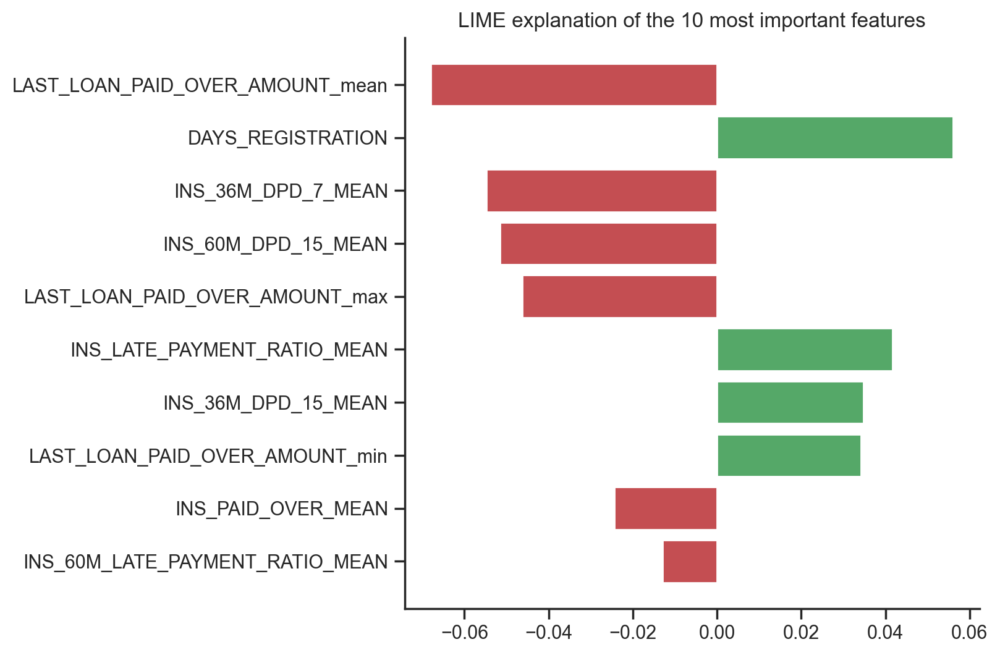

CPU times: total: 34.8 s
Wall time: 10.7 s


,lime class1,actual class1,class_diff
1,0.396001,0.42447,0.02847


In [766]:
%%time

model_pl_label = 'wt_lgbm_clf_opt'
model_pl = df_MODELS.loc[model_pl_label]['Models']
predict_fn = lambda x: model_pl['model'].predict_proba(x) #>= df_MODELS.loc[model_pl_label]['Best_proba_threshold_train'] #model_pl['model'].predict_proba #df_MODELS.loc[model_pl_label]['yhat_train']
l_ft_labels = list(X_TRAIN.columns)
top_ft = 10 # Select the number of the most important features to keep.
client_idx = 9
n_iter = 10

X_test_norm = model_pl['scaler'].transform(X_TEST)

t0 = time()
# Explain for the selected client from the test data.
delta_t = 0
lime_metrics_opt = {"class_diff": 1}
for i in range(n_iter):
    lime_explainer = create_lime_explainer(model_pl, X_TRAIN, y_TRAIN)
    lime_explanation = lime_explainer.explain_instance(X_test_norm[client_idx], predict_fn, num_features=top_ft)#, num_samples = 10000) 
    if delta_t == 0:
        delta_t += time() - t0

    actual_pred = predict_fn(X_test_norm[client_idx].reshape(1,-1))
    perc_pred_diff = abs(actual_pred[0][1] - lime_explanation.local_pred[0])

    lime_metrics = {"lime class1": lime_explanation.local_pred[0], "actual class1": actual_pred[0][1], "class_diff": round(perc_pred_diff,5)}
    if perc_pred_diff < lime_metrics_opt["class_diff"]:
        lime_metrics_opt = lime_metrics
        lime_explainer_opt = lime_explainer
        lime_explanation_opt = lime_explanation
    
ft_expl_dict = {}
for ft_idx, expl in lime_explanation_opt.as_map()[1]:
    ft_expl_dict[l_ft_labels[ft_idx]] = expl

    
# Show the dictionary.
#print("LIME explanation for the {0} most important features:\n".format(top_ft))
#pprint(ft_expl_dict)

# Graphical representation.
figure_lime_explanation(ft_expl_dict)
plt.title("LIME explanation of the {0} most important features".format(top_ft))
#plt.legend()
plt.show()

pd.DataFrame(lime_metrics_opt, index=[1])

In [ ]:
delta_t

# API Flask

In [63]:
from flask import Flask
#from .views import app

In [67]:
app = Flask(__name__)

@app.route('/api/flask/')
def index():
    return "Hello world !"

if __name__ == "__main__":
    app.run()

 * Serving Flask app '__main__'
 * Debug mode: off


 * Running on http://127.0.0.1:5000
Press CTRL+C to quit
127.0.0.1 - - [05/May/2023 15:13:38] "GET / HTTP/1.1" 404 -
127.0.0.1 - - [05/May/2023 15:13:39] "GET /favicon.ico HTTP/1.1" 404 -


In [59]:
@app.route('/api/flask/')
def api_flask ():
    pass # ligne temporaire

NameError: name 'app' is not defined